In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widget
from IPython import display
from os import listdir
from os.path import isfile, join
import glob

%matplotlib inline

In [2]:
#Work with camera calibration, This is done only once
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

global counter 
global ref_leftfit 
global ref_rightfit
global left_fit
global right_fit
counter = 0
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
cv2.destroyAllWindows()

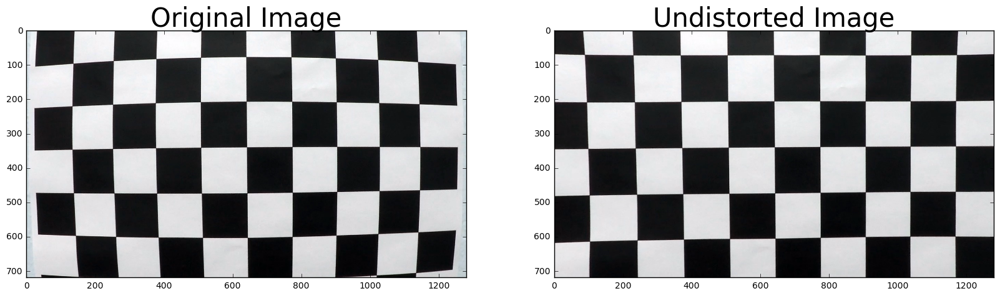

In [3]:
import pickle
%matplotlib inline

# Calibrate camera and Test undistortion on an image

fname = 'camera_cal/calibration{}.jpg'.format(1)
img = cv2.imread(fname)
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('result_cal/test_undist1.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/cal_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [4]:
#find abs_sobel_thresh 

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_threshx(img,sobel_kernel = 3, threshminx=0, threshmaxx=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
#     fname = 'test_images/test{}.jpg'.format(1)
#     img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= threshminx) & (scaled_sobel <= threshmaxx)] = 1
    return sbinary
 

In [5]:
#find abs_sobel_thresh 

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_threshy(img,sobel_kernel = 3, threshminy=0, threshmaxy=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
#     fname = 'test_images/test{}.jpg'.format(1)
#     img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= threshminy) & (scaled_sobel <= threshmaxy)] = 1
    return sbinary
 

In [6]:
# calc magn and dir of gradient 
def mag_thresh(img, sobel_kernel=3, mag_threshmin=0, mag_threshmax=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    mag_sobel = np.sqrt(sobelx**2+sobely**2)
    #mag_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= mag_threshmin) & (scaled_sobel <= mag_threshmax)] = 1
    
    return sbinary


In [7]:
def dir_threshold(img, sobel_kernel=3, thresh_dirmin=0, thresh_dirmax=np.pi/2):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    orient = np.arctan2(abs_sobely, abs_sobelx) 
    sbinary = np.zeros_like(orient)
    sbinary[(orient >= thresh_dirmin)&(orient <= thresh_dirmax)] = 1
    
    return sbinary
    


In [8]:
def s_threshold(img, s_thresh_min=90, s_thresh_max =255):
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Threshold S channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    return s_binary


In [9]:
# Run the function

def update_params(image ):

    # Choose a larger odd number to smooth gradient measurements
    # Apply each of the thresholding functions
    #image = cv2.imread(fname)
    #found the parameter optimally using iwidget widget
    ksize=15,
    thresh_minx=62, 
    thresh_maxx=155,
    thresh_miny=42, 
    thresh_maxy=117,
    mag_thresh_min=36, 
    mag_thresh_max=202,
    s_min=111, 
    s_max =255
    gradx = abs_sobel_threshx(image, sobel_kernel=ksize, threshminx=thresh_minx, threshmaxx=thresh_maxx)
    grady = abs_sobel_threshy(image, sobel_kernel=ksize, threshminy=thresh_miny, threshmaxy=thresh_maxy)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_threshmin=mag_thresh_min, mag_threshmax=mag_thresh_max)
    #dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh_dirmin=thresh_dir_min, thresh_dirmax=thresh_dir_max)
    s_binary = s_threshold(image, s_thresh_min=s_min, s_thresh_max =s_max)
    combined = np.zeros_like(mag_binary)
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))|(s_binary==1)] = 1
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) )|(s_binary==1)] = 1
    #plt.imshow(combined, cmap='gray')
    return combined
    

    

In [10]:
# one set of good working params
# def update_params(ksize=15,thresh_min=76, thresh_max=255,mag_thresh_min=48, 
#                   mag_thresh_max=255,thresh_dir_min=0.70, thresh_dir_max=1.40):

In [11]:
def region_of_interest(image,vertices):
     #defining a blank mask to start with
    mask = np.zeros_like(image)   
    ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(image, mask)
    #plt.imshow(masked_image, cmap='gray')
    return masked_image

In [12]:
 

# image = cv2.imread(fname)
# color_binary1 = update_params(ksize = 9,image=fname)
# color_binary2 = region_of_interest(color_binary1, vertices)
# histogram = np.sum(color_binary2[color_binary2.shape[0]/2:,:], axis=0)
# plt.plot(histogram)

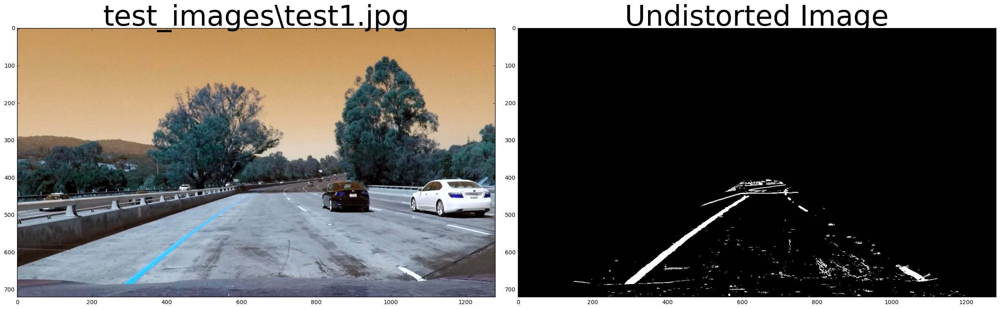

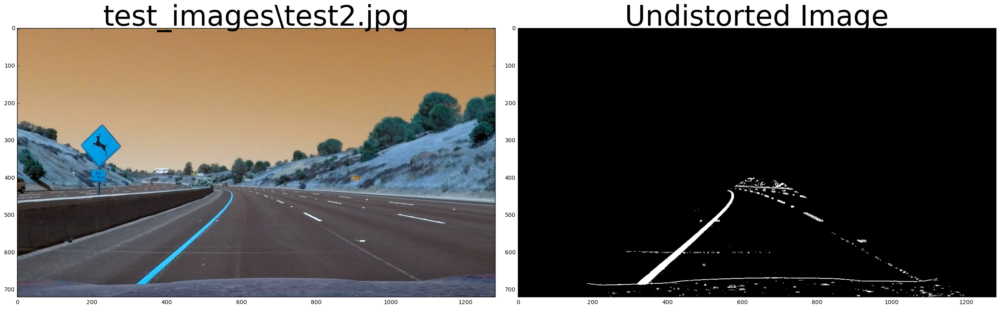

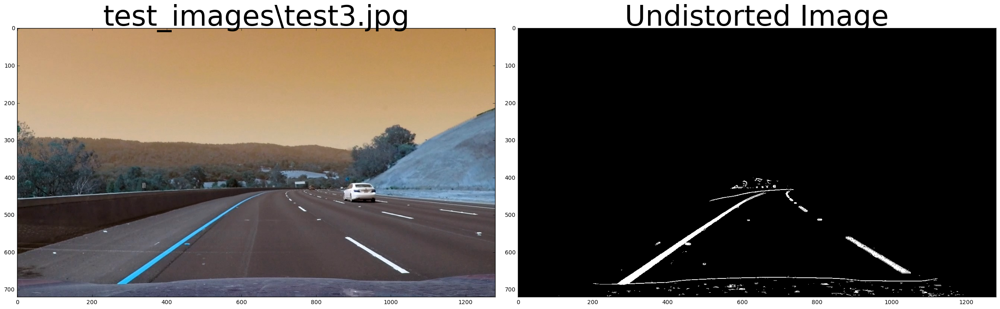

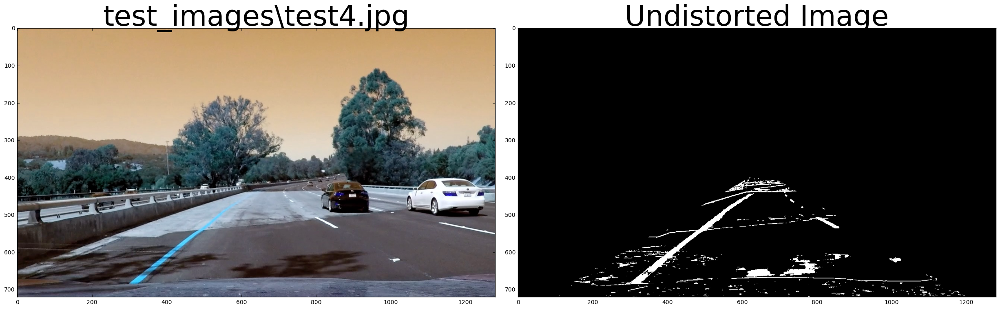

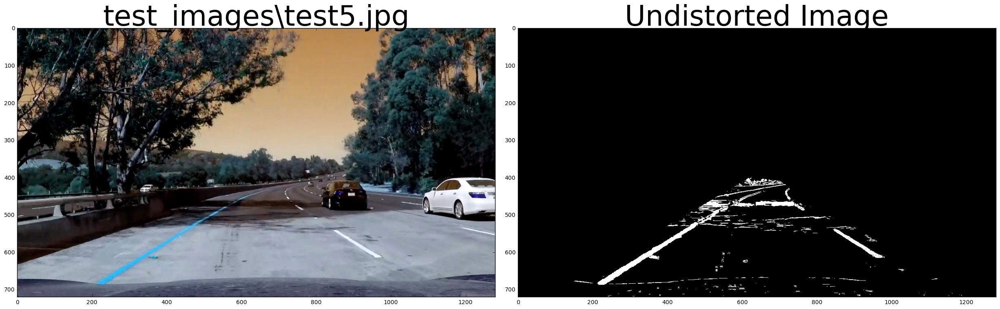

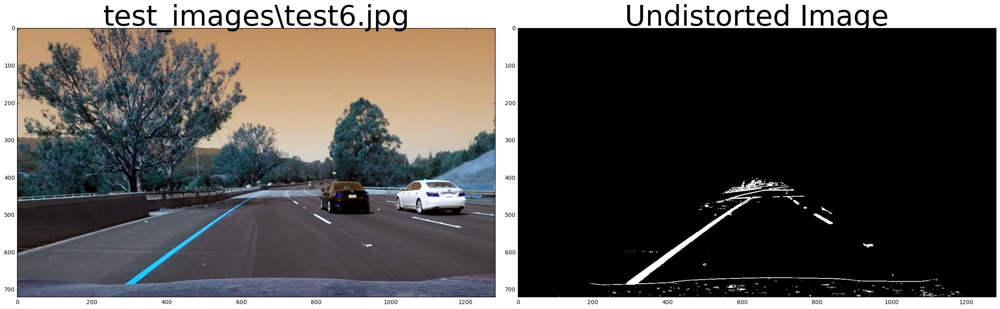

In [13]:
#View the edges of lanes 
fname = 'test_images/test{}.jpg'.format(5)
image_test = cv2.imread(fname)
imshape = image_test.shape
x,y = imshape[1],imshape[0]
left_bottom = ((x-1200),y)
right_bottom = (x-80, y)
apex1 = (620, 400)
apex2 = (700, 410)
vertices = np.array([[left_bottom, apex1, apex2, 
                      right_bottom]], dtype=np.int32)
# Step through the list and search for chessboard corners
imagesall = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(imagesall):
    image = cv2.imread(fname)
    binary_thresh = update_params(image)
    binary_thresh_edges = region_of_interest(binary_thresh, vertices)
    cv2.imwrite('result_cal/'+fname,binary_thresh_edges)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title(fname, fontsize=50)
    ax2.imshow(binary_thresh_edges, cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
#unwamrp the undistorted images

# TODO: Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
src = np.float32([[585, 460], [203, 720], [1127, 720], [695, 460]])
dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
def undistort(img):
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    return undst
    
def cal_unwarp(img):
   
    undist = undistort(img)
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    return warped,M
# fname = 'test_images/straight_lines{}.jpg'.format(1)
# image = cv2.imread(fname)
# img_size = (image.shape[1], image.shape[0])
# binary_thres = update_params(image)
# binary_edges = region_of_interest(binary_thres, vertices)
# color=[0, 255, 0] 
# thickness=5
# cv2.line(image, (585, 460), (203, 720), color, thickness)
# cv2.line(image, (585, 460), (695, 460), color, thickness)
# cv2.line(image, (695, 460), (1127, 720), color, thickness)
# cv2.line(image, (203, 720), (1127, 720), color, thickness)
# img_warped,M = cal_unwarp(binary_edges)
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image,cmap='gray')
# ax1.set_title('Original Image', fontsize=50)
# # color=[155, 0, 0] 
# # cv2.line(img_warped, (320, 0), (320, 720), color, thickness)
# # cv2.line(img_warped, (585, 460), (695, 460), color, thickness)
# # cv2.line(img_warped, (695, 460), (960,720), color, thickness)
# # cv2.line(img_warped, (203, 720), (960,720), color, thickness)
# ax2.imshow(img_warped, cmap='gray')
# ax2.set_title('Undistorted Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [15]:
#find the line on image by checking the peaks of histogram using window sliding

def find_lanes_window(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    plt.plot(histogram)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))


            ## Visualizing the lane line
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 


    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    ## tried sanity check to check slope of lines 
#     print("len of left and rt line",len(left_fitx),len(right_fitx))
#     print("2 points left ",(left_fitx[0],ploty[0]),(left_fitx[600],ploty[600]))
#     slope_m1_lt = ploty[600]-ploty[0]/left_fitx[600]-left_fitx[0]
#     print("points left and rt",(right_fitx[0],ploty[0]),(right_fitx[600],ploty[600]))
#     slope_m1_rt = ploty[600]-ploty[0]/right_fitx[600]-right_fitx[0]
#     print("slope",slope_m1_lt,slope_m1_rt)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return left_fitx,right_fitx,left_fit,right_fit,out_img
## test the function with pipeline
# fname = 'test_images/straight_lines{}.jpg'.format(2)
# image = cv2.imread(fname)
# img_size = (image.shape[1], image.shape[0])
# binary_thres = update_params(image)
# binary_edges = region_of_interest(binary_thres, vertices)
# binary_warped,M = cal_unwarp(binary_edges)
# lineLt,lineRt,left_fit,right_fit,ploty,out_img = find_lanes_window(binary_warped)
# plt.imshow(out_img)
# plt.plot(lineLt, ploty, color='yellow')
# plt.plot(lineRt, ploty, color='yellow')
# plt.xlim(0, 1280)
# plt.ylim(720, 0)

In [16]:
# find the lane lines on new image without searching the lines but findind them in 
#our are of interest

def search_lines_ROI(binary_warped,left_fit,right_fit):
    # Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    #visualize the lane lines
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return left_fitx,right_fitx,left_fit,right_fit,result
    
# ## test the function with pipeline
# fname = 'test_images/straight_lines{}.jpg'.format(1)
# image = cv2.imread(fname)
# binary_thres= update_params(image)
# binary_edges = region_of_interest(binary_thres, vertices)
# binary_warped,Minv = cal_unwarp(binary_edges)
# left_fitx,right_fitx,left_fit,right_fit,ploty,result = find_lanes_window(binary_warped)
# left_fitx,right_fitx,left_fit,right_fit,ploty,result = search_lines_ROI(binary_warped,left_fit,right_fit)
# # Draw the lane onto the warped blank image
# plt.imshow(result)
# plt.plot(left_fitx, ploty, color='yellow')
# plt.plot(right_fitx, ploty, color='yellow')
# plt.xlim(0, 1280)
# plt.ylim(720, 0)


In [17]:
def radiusOfCurvature(left_fit,right_fit,binary_warped):
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    #print("plot y",ploty)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    #left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fit*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fit*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) /  np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    center = (((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]) ) /2 - 640)*xm_per_pix
    return left_curverad, right_curverad,center

In [18]:
def sanitcheck(left_fit, right_fit):
   
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False
        d0=0
        d1=0
        #Previous fitlines routine returns empty list to them if not finds
    else:
        #Difference of slope
        L_0 = 2*left_fit[0]*460+left_fit[1]
        R_0 = 2*right_fit[0]*460+right_fit[1]
        d0 =  np.abs(L_0-R_0)
      
        L_1 = 2*left_fit[0]*720+left_fit[1]
        R_1 = 2*right_fit[0]*720+right_fit[1]
        d1 =  np.abs(L_1-R_1)
          ## trying to find slope
#         m1 = 720-460/L_1-L_0
#         m2 = 720 -460/R_1-R_0
#         print("l1 l2",(L_0,460),(L_1,720))
#         print("r1 r2",(R_0,460),(R_1,720))
#         print("m1 and m2",m1,m2)    
        if d0>= 0 and d0<= 0.5 and d1>= 0 and d1<= 0.5:
            status = True
        else:
            status = False
            
    return(status)
    

In [19]:
# Create an image to draw the lines on
# Create an image to draw the lines on
def image_overlap(undist,binary_warped,left_fitx,right_fitx):
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    #plt.imshow(color_warp)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    return result
# Combine the result with the original image
#result = image_overlap(binary_warped)

#plt.imshow(result)

In [20]:
def imageClub(img_merge,img_mag_thr,img_warped):
    #Composition of images to final display
    img_out=np.zeros((600,1280,3), dtype=np.uint8)
    #alarge image
    img_out[0:600,0:1000,:] =cv2.resize(img_merge,(1000,600))
    #b) Threshold convert into color by * 255
    img_out[0:300,1000:1280, 0] =cv2.resize(img_mag_thr*255,(280,300))
    img_out[0:300,1000:1280, 1] =cv2.resize(img_mag_thr*255,(280,300))
    img_out[0:300,1000:1280, 2] =cv2.resize(img_mag_thr*255,(280,300))
   
    #c)Birds eye view
    img_out[300:600,1000:1280,0] =cv2.resize(img_warped*255,(280,300))
    img_out[300:600,1000:1280,1] =cv2.resize(img_warped*255,(280,300))
    img_out[300:600,1000:1280,2] =cv2.resize(img_warped*255,(280,300))
    
    return img_out

In [21]:
def out_string_image(img_out,left_curv,right_curv,center_off):
     
    #Write curvature and center in image
    TextL = "Left curv: " + str(int(left_curv)) + " m"
    TextR = "Right curv: " + str(int(right_curv))+ " m"
    TextC = "Center offset: " + str(round( center_off,2)) + "m"
    fontScale=2
    thickness=2
    fontFace = cv2.FONT_HERSHEY_COMPLEX


    cv2.putText(img_out, TextL, (130,50), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(img_out, TextR, (130,100), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(img_out, TextC, (130,150), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    #cv2.putText(img_out, TextAux, (100,130), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)

    cv2.putText(img_out, "Thresh_view", (1000,40), fontFace, .8,(200,200,0), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(img_out, "warped", (1000,400), fontFace, .8,(200,200,0), thickness,  lineType = cv2.LINE_AA)
    
    return img_out

In [22]:
def pipline(image):
    global counter
    global ref_leftfit 
    global ref_rightfit
    global left_fit
    global right_fit
    undist = undistort(image)
    binary_thres= update_params(image)
    binary_edges = region_of_interest(binary_thres, vertices)
   
    binary_warped,Minv = cal_unwarp(binary_edges)
    if counter == 0 :
        left_fitx,right_fitx,left_fit,right_fit,result = find_lanes_window(binary_warped)
    else:
        left_fitx,right_fitx,left_fit,right_fit,result = search_lines_ROI(binary_warped,left_fit,right_fit)
    
    status = sanitcheck(left_fit, right_fit)
    if status == True:
        #Save as last reliable fit
        ref_leftfit, ref_rightfit = left_fit, right_fit        
        counter =counter +1
    else:        
        #Use the last realible fit
        left_fit, right_fit = ref_leftfit, ref_rightfit
        counter = 0
        
    left_curve, right_curve,center = radiusOfCurvature(left_fit,right_fit,binary_warped)
    img_unwarp = image_overlap(undist,binary_warped,left_fitx,right_fitx)
    image_club = imageClub(img_unwarp,binary_edges,binary_warped)
    image_out = out_string_image(image_club,left_curve,right_curve,center)
    return image_out


C:\Users\Rahul\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


2650.28627272 2545.7456984


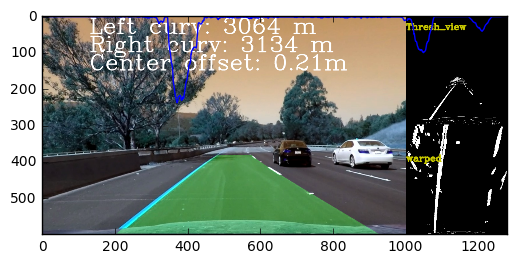

In [23]:

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    #pipline(image)
    
    return pipline(image)

# fname = 'test_images/test{}.jpg'.format(6)
# image = cv2.imread(fname)
# result = process_image(image)
# plt.imshow(result)

1818.29425837 2333.61672926
[MoviePy] >>>> Building video project_video_1.mp4
[MoviePy] Writing video project_video_1.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

1992.59898283 2790.88060071


  0%|                                         | 1/1261 [00:00<07:19,  2.87it/s]

2008.90852147 4052.52381416


  0%|                                         | 2/1261 [00:00<07:15,  2.89it/s]

1995.49838914 2047.75268752


  0%|                                         | 3/1261 [00:01<07:09,  2.93it/s]

1935.20301985 1782.83887614


  0%|▏                                        | 4/1261 [00:01<07:11,  2.91it/s]

1927.10617732 1884.80765261


  0%|▏                                        | 5/1261 [00:01<07:07,  2.94it/s]

1921.39208776 2249.416792


  0%|▏                                        | 6/1261 [00:02<07:00,  2.99it/s]

2002.92663228 2766.97213019


  1%|▏                                        | 7/1261 [00:02<07:03,  2.96it/s]

2053.62707569 10481.3891699


  1%|▎                                        | 8/1261 [00:02<07:06,  2.94it/s]

2047.04032059 73634.8610489


  1%|▎                                        | 9/1261 [00:03<07:01,  2.97it/s]

2120.31885838 20018.2377717


  1%|▎                                       | 10/1261 [00:03<07:09,  2.92it/s]

2245.94675842 2660.56841146


  1%|▎                                       | 11/1261 [00:03<07:11,  2.90it/s]

2429.22428367 2476.54294334


  1%|▍                                       | 12/1261 [00:04<07:05,  2.93it/s]

2620.54478634 3322.84076879


  1%|▍                                       | 13/1261 [00:04<07:14,  2.87it/s]

2593.85935421 6340.78279564


  1%|▍                                       | 14/1261 [00:04<07:09,  2.90it/s]

2903.55879079 3107.84866359


  1%|▍                                       | 15/1261 [00:05<07:06,  2.92it/s]

2822.33112545 2317.09033656


  1%|▌                                       | 16/1261 [00:05<07:05,  2.93it/s]

2833.71047256 2520.69873826


  1%|▌                                       | 17/1261 [00:05<07:06,  2.91it/s]

3012.45268393 2938.67169765


  1%|▌                                       | 18/1261 [00:06<07:04,  2.93it/s]

3124.93833271 3293.56703887


  2%|▌                                       | 19/1261 [00:06<07:20,  2.82it/s]

3385.1893668 3348.05821566


  2%|▋                                       | 20/1261 [00:06<07:09,  2.89it/s]

3768.86730895 5239.68736872


  2%|▋                                       | 21/1261 [00:07<07:08,  2.89it/s]

3795.0142499 5829.45252859


  2%|▋                                       | 22/1261 [00:07<07:03,  2.93it/s]

3760.77906642 5461.88765015


  2%|▋                                       | 23/1261 [00:07<06:59,  2.95it/s]

3378.69451074 2699.50056103


  2%|▊                                       | 24/1261 [00:08<07:02,  2.93it/s]

2902.67014643 2099.50991441


  2%|▊                                       | 25/1261 [00:08<07:08,  2.88it/s]

2887.8099393 2501.1308782


  2%|▊                                       | 26/1261 [00:08<07:17,  2.83it/s]

2925.45438072 3096.32114841


  2%|▊                                       | 27/1261 [00:09<07:21,  2.79it/s]

2774.46308184 4452.02196708


  2%|▉                                       | 28/1261 [00:09<07:14,  2.84it/s]

2574.54256409 3348.48330809


  2%|▉                                       | 29/1261 [00:09<07:13,  2.84it/s]

2279.29986026 1975.85725241


  2%|▉                                       | 30/1261 [00:10<07:10,  2.86it/s]

2091.58271085 1964.29975816


  2%|▉                                       | 31/1261 [00:10<07:38,  2.68it/s]

1949.13221398 2354.75418787


  3%|█                                       | 32/1261 [00:11<08:16,  2.48it/s]

1982.43620963 3040.47203735


  3%|█                                       | 33/1261 [00:11<08:03,  2.54it/s]

1894.54073441 5252.96283938


  3%|█                                       | 34/1261 [00:11<07:56,  2.58it/s]

1805.86468395 3695.99992014


  3%|█                                       | 35/1261 [00:12<08:12,  2.49it/s]

1746.70195898 1851.32643921


  3%|█▏                                      | 36/1261 [00:12<07:46,  2.63it/s]

1690.12134815 2139.4616749


  3%|█▏                                      | 37/1261 [00:13<07:33,  2.70it/s]

1581.27234523 2950.97118825


  3%|█▏                                      | 38/1261 [00:13<07:32,  2.71it/s]

1531.35674162 2016.51828229


  3%|█▏                                      | 39/1261 [00:13<07:23,  2.75it/s]

1517.75276968 1422.80699971


  3%|█▎                                      | 40/1261 [00:14<07:14,  2.81it/s]

1502.67567316 1460.92708438


  3%|█▎                                      | 41/1261 [00:14<07:19,  2.78it/s]

1536.04035445 1581.81671602


  3%|█▎                                      | 42/1261 [00:14<07:06,  2.86it/s]

1508.74552482 1680.31733574


  3%|█▎                                      | 43/1261 [00:15<07:10,  2.83it/s]

1610.56532874 1852.07326005


  3%|█▍                                      | 44/1261 [00:15<07:42,  2.63it/s]

1625.09763072 2101.41476696


  4%|█▍                                      | 45/1261 [00:16<07:53,  2.57it/s]

1746.44014544 3049.55831477


  4%|█▍                                      | 46/1261 [00:16<07:45,  2.61it/s]

1862.43479277 3546.32039558


  4%|█▍                                      | 47/1261 [00:16<07:36,  2.66it/s]

1874.75569257 3722.0745589


  4%|█▌                                      | 48/1261 [00:17<07:39,  2.64it/s]

2064.01692935 2247.82305302


  4%|█▌                                      | 49/1261 [00:17<07:42,  2.62it/s]

2292.1060342 1656.09656269


  4%|█▌                                      | 50/1261 [00:17<07:33,  2.67it/s]

2475.49722388 2288.28832095


  4%|█▌                                      | 51/1261 [00:18<07:30,  2.69it/s]

2643.41350321 2634.64717996


  4%|█▋                                      | 52/1261 [00:18<08:14,  2.44it/s]

2736.39322896 1741.7143081


  4%|█▋                                      | 53/1261 [00:19<07:56,  2.53it/s]

2856.95417721 1511.18343794


  4%|█▋                                      | 54/1261 [00:19<07:36,  2.64it/s]

3140.60758166 1604.41056153


  4%|█▋                                      | 55/1261 [00:19<07:36,  2.64it/s]

3290.35754172 1844.92588864


  4%|█▊                                      | 56/1261 [00:20<07:29,  2.68it/s]

3755.10961967 2309.52562652


  5%|█▊                                      | 57/1261 [00:20<07:24,  2.71it/s]

3629.79851234 2983.77891225


  5%|█▊                                      | 58/1261 [00:20<07:19,  2.73it/s]

3139.93228683 4722.38211997


  5%|█▊                                      | 59/1261 [00:21<07:24,  2.70it/s]

2845.08109134 2675.14307676


  5%|█▉                                      | 60/1261 [00:21<07:22,  2.71it/s]

2658.16527377 3841.44790159


  5%|█▉                                      | 61/1261 [00:22<07:15,  2.76it/s]

2552.5340086 2317.99038671


  5%|█▉                                      | 62/1261 [00:22<07:08,  2.80it/s]

2447.8518763 2936.26560908


  5%|█▉                                      | 63/1261 [00:22<07:07,  2.81it/s]

2294.25541556 1764.09705863


  5%|██                                      | 64/1261 [00:23<07:13,  2.76it/s]

2276.57220904 1988.41354891


  5%|██                                      | 65/1261 [00:23<07:07,  2.80it/s]

2305.37547748 2236.44655378


  5%|██                                      | 66/1261 [00:23<07:32,  2.64it/s]

2278.39980647 2555.67415746


  5%|██▏                                     | 67/1261 [00:24<07:37,  2.61it/s]

2251.68761524 2875.02053622


  5%|██▏                                     | 68/1261 [00:24<07:33,  2.63it/s]

2270.35437608 3809.85102186


  5%|██▏                                     | 69/1261 [00:25<07:29,  2.65it/s]

2426.7668104 4392.0075519


  6%|██▏                                     | 70/1261 [00:25<07:23,  2.68it/s]

2553.66427778 3803.15691751


  6%|██▎                                     | 71/1261 [00:25<07:36,  2.61it/s]

2690.34631678 3280.28745607


  6%|██▎                                     | 72/1261 [00:26<07:43,  2.56it/s]

2986.87971769 2765.96463777


  6%|██▎                                     | 73/1261 [00:26<07:26,  2.66it/s]

3178.02565768 2627.56802942


  6%|██▎                                     | 74/1261 [00:26<07:22,  2.68it/s]

3604.34171297 2890.59094943


  6%|██▍                                     | 75/1261 [00:27<07:20,  2.69it/s]

4115.79463321 2425.06521603


  6%|██▍                                     | 76/1261 [00:27<07:22,  2.68it/s]

4455.45947166 2215.60447154


  6%|██▍                                     | 77/1261 [00:28<07:15,  2.72it/s]

5320.46996536 1891.10572326


  6%|██▍                                     | 78/1261 [00:28<07:22,  2.67it/s]

5746.51196393 1737.83785554


  6%|██▌                                     | 79/1261 [00:28<07:15,  2.71it/s]

5605.57136561 1693.0360002


  6%|██▌                                     | 80/1261 [00:29<07:18,  2.69it/s]

5418.28659574 1954.27504671


  6%|██▌                                     | 81/1261 [00:29<07:05,  2.77it/s]

5040.26692128 2221.06080359


  7%|██▌                                     | 82/1261 [00:29<07:05,  2.77it/s]

4847.4507633 2698.40636632


  7%|██▋                                     | 83/1261 [00:30<07:02,  2.79it/s]

5443.1805517 3022.56128528


  7%|██▋                                     | 84/1261 [00:30<07:00,  2.80it/s]

4463.92404422 7134.07504977


  7%|██▋                                     | 85/1261 [00:30<06:53,  2.84it/s]

3771.04309377 10652.3556348


  7%|██▋                                     | 86/1261 [00:31<06:55,  2.83it/s]

3141.92430025 2642.50770252


  7%|██▊                                     | 87/1261 [00:31<06:58,  2.81it/s]

2765.8630618 5002.5674842


  7%|██▊                                     | 88/1261 [00:31<06:57,  2.81it/s]

2435.61465732 2592.48045598


  7%|██▊                                     | 89/1261 [00:32<07:02,  2.78it/s]

2127.86612813 1922.51689792


  7%|██▊                                     | 90/1261 [00:32<06:56,  2.81it/s]

2060.38561355 1844.88576182


  7%|██▉                                     | 91/1261 [00:33<06:49,  2.86it/s]

2195.22993276 2122.3820078


  7%|██▉                                     | 92/1261 [00:33<07:16,  2.68it/s]

2070.95692771 2376.62338796


  7%|██▉                                     | 93/1261 [00:33<07:52,  2.47it/s]

2094.54364112 2902.6541849


  7%|██▉                                     | 94/1261 [00:34<07:48,  2.49it/s]

2189.20097876 3497.4580637


  8%|███                                     | 95/1261 [00:34<07:35,  2.56it/s]

2159.02150274 4710.46014887


  8%|███                                     | 96/1261 [00:35<07:20,  2.64it/s]

2201.69527773 2756.08039304


  8%|███                                     | 97/1261 [00:35<07:12,  2.69it/s]

2265.09254445 2632.28956961


  8%|███                                     | 98/1261 [00:35<07:02,  2.75it/s]

2299.18003636 2099.10324408


  8%|███▏                                    | 99/1261 [00:36<07:02,  2.75it/s]

2460.22051572 2551.44159647


  8%|███                                    | 100/1261 [00:36<07:13,  2.68it/s]

2441.29285481 2988.16027159


  8%|███                                    | 101/1261 [00:36<07:02,  2.74it/s]

2498.38691618 2012.17151012


  8%|███▏                                   | 102/1261 [00:37<07:00,  2.75it/s]

2328.61949289 1656.14397792


  8%|███▏                                   | 103/1261 [00:37<07:00,  2.76it/s]

2325.98205932 1680.95321892


  8%|███▏                                   | 104/1261 [00:37<07:00,  2.75it/s]

2431.25637074 1782.82740969


  8%|███▏                                   | 105/1261 [00:38<07:12,  2.67it/s]

2422.94536615 1858.5922645


  8%|███▎                                   | 106/1261 [00:38<07:31,  2.56it/s]

2471.65710965 1988.94328873


  8%|███▎                                   | 107/1261 [00:39<07:27,  2.58it/s]

2228.80405711 2518.17621882


  9%|███▎                                   | 108/1261 [00:39<07:25,  2.59it/s]

2198.7385798 3338.795646


  9%|███▎                                   | 109/1261 [00:39<07:33,  2.54it/s]

2212.54343082 5832.08555031


  9%|███▍                                   | 110/1261 [00:40<07:22,  2.60it/s]

2165.44490656 3376.96679862


  9%|███▍                                   | 111/1261 [00:40<07:12,  2.66it/s]

2311.94507929 2430.05064564


  9%|███▍                                   | 112/1261 [00:41<07:10,  2.67it/s]

2104.24323556 2093.31225283


  9%|███▍                                   | 113/1261 [00:41<07:06,  2.69it/s]

2052.79297899 2385.85619466


  9%|███▌                                   | 114/1261 [00:41<07:15,  2.64it/s]

1975.36013475 1920.43375936


  9%|███▌                                   | 115/1261 [00:42<08:00,  2.39it/s]

1952.45674875 1417.25094475


  9%|███▌                                   | 116/1261 [00:42<07:49,  2.44it/s]

1939.24249113 1473.98525817


  9%|███▌                                   | 117/1261 [00:43<07:27,  2.56it/s]

1865.30857173 1623.58703209


  9%|███▋                                   | 118/1261 [00:43<07:26,  2.56it/s]

1799.63167875 1800.65280526


  9%|███▋                                   | 119/1261 [00:43<07:17,  2.61it/s]

1809.93580428 2182.66632439


 10%|███▋                                   | 120/1261 [00:44<07:14,  2.63it/s]

1861.44633151 2916.87240314


 10%|███▋                                   | 121/1261 [00:44<06:58,  2.73it/s]

1847.27549086 2153.62704843


 10%|███▊                                   | 122/1261 [00:44<06:51,  2.77it/s]

1776.72437195 1803.20644734


 10%|███▊                                   | 123/1261 [00:45<06:48,  2.79it/s]

1796.71638204 2252.00905675


 10%|███▊                                   | 124/1261 [00:45<06:51,  2.76it/s]

1793.29980209 2468.88350425


 10%|███▊                                   | 125/1261 [00:45<06:44,  2.81it/s]

1930.91552598 2165.01629307


 10%|███▉                                   | 126/1261 [00:46<06:40,  2.84it/s]

1908.11756165 1446.32773098


 10%|███▉                                   | 127/1261 [00:46<06:45,  2.80it/s]

2004.28076203 1405.1143538


 10%|███▉                                   | 128/1261 [00:46<06:49,  2.77it/s]

1943.48877623 1476.00728945


 10%|███▉                                   | 129/1261 [00:47<06:46,  2.79it/s]

2013.59407587 1709.27052209


 10%|████                                   | 130/1261 [00:47<06:53,  2.74it/s]

2029.76467611 1966.10941988


 10%|████                                   | 131/1261 [00:48<06:51,  2.75it/s]

2176.31968759 2241.20422853


 10%|████                                   | 132/1261 [00:48<06:47,  2.77it/s]

2255.50307137 2700.00605768


 11%|████                                   | 133/1261 [00:48<06:47,  2.77it/s]

2316.02407425 1803.12035547


 11%|████▏                                  | 134/1261 [00:49<06:42,  2.80it/s]

2433.63482464 1880.01902727


 11%|████▏                                  | 135/1261 [00:49<06:36,  2.84it/s]

2491.94119025 1996.05851807


 11%|████▏                                  | 136/1261 [00:49<06:43,  2.78it/s]

2530.2956514 2348.27592792


 11%|████▏                                  | 137/1261 [00:50<06:49,  2.74it/s]

2608.02549323 2803.52883282


 11%|████▎                                  | 138/1261 [00:50<06:46,  2.76it/s]

2612.55733558 4958.56716505


 11%|████▎                                  | 139/1261 [00:50<06:40,  2.80it/s]

2767.90566079 3844.18268215


 11%|████▎                                  | 140/1261 [00:51<06:38,  2.82it/s]

2520.56575202 2235.75968728


 11%|████▎                                  | 141/1261 [00:51<06:36,  2.82it/s]

2685.41946644 1995.39672195


 11%|████▍                                  | 142/1261 [00:51<06:37,  2.81it/s]

2530.0101097 2415.6959417


 11%|████▍                                  | 143/1261 [00:52<06:41,  2.78it/s]

2487.05854137 2633.71944952


 11%|████▍                                  | 144/1261 [00:52<06:38,  2.80it/s]

2675.3781516 3308.93752537


 11%|████▍                                  | 145/1261 [00:53<06:37,  2.81it/s]

2819.68280115 5463.58616431


 12%|████▌                                  | 146/1261 [00:53<06:30,  2.85it/s]

2843.52491062 4250.18998362


 12%|████▌                                  | 147/1261 [00:53<06:33,  2.83it/s]

2657.13673901 2339.96804342


 12%|████▌                                  | 148/1261 [00:54<06:31,  2.84it/s]

2730.95332531 2716.34689619


 12%|████▌                                  | 149/1261 [00:54<06:32,  2.83it/s]

2896.04021406 2915.01229103


 12%|████▋                                  | 150/1261 [00:54<06:29,  2.85it/s]

2980.00349137 1893.35389862


 12%|████▋                                  | 151/1261 [00:55<06:33,  2.82it/s]

3046.29953991 1580.52939432


 12%|████▋                                  | 152/1261 [00:55<06:36,  2.80it/s]

2848.20754333 1543.31793488


 12%|████▋                                  | 153/1261 [00:55<06:34,  2.81it/s]

2838.45638495 1646.94908885


 12%|████▊                                  | 154/1261 [00:56<06:31,  2.83it/s]

2747.06664308 1826.31277959


 12%|████▊                                  | 155/1261 [00:56<06:27,  2.85it/s]

2674.99731262 2068.88583453


 12%|████▊                                  | 156/1261 [00:56<06:35,  2.80it/s]

2599.4080954 2256.52676421


 12%|████▊                                  | 157/1261 [00:57<06:29,  2.83it/s]

2407.99034313 3457.89201616


 13%|████▉                                  | 158/1261 [00:57<06:27,  2.85it/s]

2434.38749908 4633.86493541


 13%|████▉                                  | 159/1261 [00:57<06:22,  2.88it/s]

2276.06532727 3370.32708979


 13%|████▉                                  | 160/1261 [00:58<06:27,  2.84it/s]

2451.3509962 2928.61079435


 13%|████▉                                  | 161/1261 [00:58<06:25,  2.85it/s]

2269.57590517 2780.27593418


 13%|█████                                  | 162/1261 [00:59<06:24,  2.86it/s]

2348.34342536 4070.40430271


 13%|█████                                  | 163/1261 [00:59<06:24,  2.85it/s]

2332.2977725 5065.36864901


 13%|█████                                  | 164/1261 [00:59<06:28,  2.83it/s]

2175.83640104 2374.40150511


 13%|█████                                  | 165/1261 [01:00<06:25,  2.84it/s]

2349.59168307 1811.72011539


 13%|█████▏                                 | 166/1261 [01:00<06:26,  2.83it/s]

2184.21642901 2201.21096182


 13%|█████▏                                 | 167/1261 [01:00<06:25,  2.84it/s]

2397.09427014 2033.52029435


 13%|█████▏                                 | 168/1261 [01:01<06:32,  2.78it/s]

2615.66264799 2307.53191791


 13%|█████▏                                 | 169/1261 [01:01<06:29,  2.80it/s]

2749.03675569 2448.55750396


 13%|█████▎                                 | 170/1261 [01:01<06:25,  2.83it/s]

3109.3012806 2738.50169158


 14%|█████▎                                 | 171/1261 [01:02<06:24,  2.84it/s]

3170.16768238 2984.72175444


 14%|█████▎                                 | 172/1261 [01:02<06:22,  2.85it/s]

3243.63899863 1593.56031881


 14%|█████▎                                 | 173/1261 [01:02<06:26,  2.81it/s]

2955.23796137 1570.63337748


 14%|█████▍                                 | 174/1261 [01:03<06:21,  2.85it/s]

2715.51675937 1250.49290048


 14%|█████▍                                 | 175/1261 [01:03<06:20,  2.85it/s]

2644.16995476 1026.22764748


 14%|█████▍                                 | 176/1261 [01:03<06:20,  2.86it/s]

2872.51520598 1001.66211315


 14%|█████▍                                 | 177/1261 [01:04<06:20,  2.85it/s]

2662.38002287 1073.11093673


 14%|█████▌                                 | 178/1261 [01:04<06:13,  2.90it/s]

2522.80818013 1123.9118992


 14%|█████▌                                 | 179/1261 [01:05<06:14,  2.89it/s]

2337.00405668 1160.37488951


 14%|█████▌                                 | 180/1261 [01:05<06:19,  2.85it/s]

2060.76284418 1399.70701188


 14%|█████▌                                 | 181/1261 [01:05<06:26,  2.80it/s]

2069.21850194 1528.80354806


 14%|█████▋                                 | 182/1261 [01:06<06:21,  2.83it/s]

1863.15260797 1949.48270225


 15%|█████▋                                 | 183/1261 [01:06<06:19,  2.84it/s]

1727.92233593 1512.05348396


 15%|█████▋                                 | 184/1261 [01:06<06:20,  2.83it/s]

1641.92198256 1675.65039936


 15%|█████▋                                 | 185/1261 [01:07<06:21,  2.82it/s]

1476.70444051 1648.76259783


 15%|█████▊                                 | 186/1261 [01:07<06:15,  2.86it/s]

1455.81115858 1169.60918693


 15%|█████▊                                 | 187/1261 [01:07<06:12,  2.88it/s]

1425.47708373 1305.38875416


 15%|█████▊                                 | 188/1261 [01:08<06:15,  2.86it/s]

1448.01987461 1460.2746529


 15%|█████▊                                 | 189/1261 [01:08<06:29,  2.76it/s]

1474.04133549 1639.82269523


 15%|█████▉                                 | 190/1261 [01:08<06:28,  2.76it/s]

1506.86697137 2022.72620275


 15%|█████▉                                 | 191/1261 [01:09<06:21,  2.80it/s]

1610.42830935 2140.66640466


 15%|█████▉                                 | 192/1261 [01:09<06:19,  2.82it/s]

1606.79227415 1901.46921456


 15%|█████▉                                 | 193/1261 [01:10<06:19,  2.82it/s]

1748.67133303 1682.50989493


 15%|██████                                 | 194/1261 [01:10<06:19,  2.81it/s]

1742.71013368 1501.72253179


 15%|██████                                 | 195/1261 [01:10<06:15,  2.84it/s]

2071.43731004 1451.65320195


 16%|██████                                 | 196/1261 [01:11<06:18,  2.81it/s]

2198.24576809 1834.86881956


 16%|██████                                 | 197/1261 [01:11<06:22,  2.78it/s]

2466.09108709 2331.56836669


 16%|██████                                 | 198/1261 [01:11<06:21,  2.79it/s]

2651.25852208 3627.72175758


 16%|██████▏                                | 199/1261 [01:12<06:17,  2.81it/s]

2617.10371262 2556.65785601


 16%|██████▏                                | 200/1261 [01:12<06:21,  2.78it/s]

2977.07225314 1658.88304705


 16%|██████▏                                | 201/1261 [01:12<06:16,  2.82it/s]

2772.07000249 2819.52098723


 16%|██████▏                                | 202/1261 [01:13<06:13,  2.83it/s]

2740.149386 2300.01932493


 16%|██████▎                                | 203/1261 [01:13<06:15,  2.81it/s]

2551.48248475 1689.63636374


 16%|██████▎                                | 204/1261 [01:13<06:14,  2.83it/s]

2399.51461983 1697.19261976


 16%|██████▎                                | 205/1261 [01:14<06:11,  2.84it/s]

2259.00925612 1969.54127668


 16%|██████▎                                | 206/1261 [01:14<06:13,  2.82it/s]

2031.70786749 2421.99221052


 16%|██████▍                                | 207/1261 [01:14<06:11,  2.84it/s]

1940.77059415 1987.42885897


 16%|██████▍                                | 208/1261 [01:15<06:10,  2.84it/s]

1950.0254312 1638.79581712


 17%|██████▍                                | 209/1261 [01:15<06:06,  2.87it/s]

2076.95073567 1571.77027375


 17%|██████▍                                | 210/1261 [01:16<06:05,  2.87it/s]

2055.7173101 1761.32909785


 17%|██████▌                                | 211/1261 [01:16<06:06,  2.86it/s]

1944.28695415 2083.82626742


 17%|██████▌                                | 212/1261 [01:16<06:06,  2.86it/s]

1888.17600444 3094.76720493


 17%|██████▌                                | 213/1261 [01:17<06:07,  2.86it/s]

1845.60321217 2617.64609403


 17%|██████▌                                | 214/1261 [01:17<06:06,  2.85it/s]

1853.12231217 1731.5742327


 17%|██████▋                                | 215/1261 [01:17<06:08,  2.84it/s]

1870.0329222 1775.35005152


 17%|██████▋                                | 216/1261 [01:18<06:07,  2.84it/s]

1844.64233995 2065.70926824


 17%|██████▋                                | 217/1261 [01:18<06:08,  2.83it/s]

2018.79748128 2100.0677813


 17%|██████▋                                | 218/1261 [01:18<06:06,  2.85it/s]

1903.54085638 2847.92672794


 17%|██████▊                                | 219/1261 [01:19<06:08,  2.83it/s]

2218.95194143 3551.01839709


 17%|██████▊                                | 220/1261 [01:19<06:07,  2.84it/s]

2252.87871849 12299.7391191


 18%|██████▊                                | 221/1261 [01:19<06:01,  2.88it/s]

2319.34499235 28026.0903192


 18%|██████▊                                | 222/1261 [01:20<06:03,  2.86it/s]

2423.02023627 3895.55154867


 18%|██████▉                                | 223/1261 [01:20<06:04,  2.85it/s]

2586.43192808 3338.67082633


 18%|██████▉                                | 224/1261 [01:20<06:06,  2.83it/s]

2623.65838161 4427.63579222


 18%|██████▉                                | 225/1261 [01:21<06:16,  2.75it/s]

2427.58092527 2640.51678921


 18%|██████▉                                | 226/1261 [01:21<06:08,  2.81it/s]

2436.95206894 1758.39277533


 18%|███████                                | 227/1261 [01:22<06:06,  2.82it/s]

2626.79841667 1890.06738977


 18%|███████                                | 228/1261 [01:22<06:10,  2.79it/s]

2680.52378232 2077.45369148


 18%|███████                                | 229/1261 [01:22<06:05,  2.82it/s]

2818.48368905 2130.60217956


 18%|███████                                | 230/1261 [01:23<06:06,  2.82it/s]

3038.84254967 2472.57246149


 18%|███████▏                               | 231/1261 [01:23<06:04,  2.83it/s]

3295.70625104 2652.43592796


 18%|███████▏                               | 232/1261 [01:23<06:06,  2.81it/s]

3188.606902 3308.3711295


 18%|███████▏                               | 233/1261 [01:24<06:03,  2.83it/s]

3247.35365645 2529.6812754


 19%|███████▏                               | 234/1261 [01:24<06:06,  2.80it/s]

3278.2044206 1707.68661982


 19%|███████▎                               | 235/1261 [01:24<06:04,  2.81it/s]

2904.98150186 2477.33461002


 19%|███████▎                               | 236/1261 [01:25<06:10,  2.77it/s]

2853.771322 1702.0540414


 19%|███████▎                               | 237/1261 [01:25<06:16,  2.72it/s]

2690.33405822 1350.06464241


 19%|███████▎                               | 238/1261 [01:26<06:30,  2.62it/s]

2602.36340382 1321.97314037


 19%|███████▍                               | 239/1261 [01:26<06:28,  2.63it/s]

2659.49584356 1395.21204263


 19%|███████▍                               | 240/1261 [01:26<06:24,  2.66it/s]

2565.73719522 1569.42547751


 19%|███████▍                               | 241/1261 [01:27<06:38,  2.56it/s]

2493.70475575 1592.34156187


 19%|███████▍                               | 242/1261 [01:27<06:41,  2.54it/s]

2389.09415805 1899.30662311


 19%|███████▌                               | 243/1261 [01:28<06:52,  2.47it/s]

2422.05009578 2187.11113803


 19%|███████▌                               | 244/1261 [01:28<06:53,  2.46it/s]

2250.8527837 1760.78404064


 19%|███████▌                               | 245/1261 [01:28<06:46,  2.50it/s]

2133.85657334 1923.69183545


 20%|███████▌                               | 246/1261 [01:29<06:41,  2.53it/s]

2202.5843956 2661.86634618


 20%|███████▋                               | 247/1261 [01:29<06:39,  2.54it/s]

2079.86626689 1735.12100762


 20%|███████▋                               | 248/1261 [01:29<06:36,  2.56it/s]

2260.00591754 1332.89872379


 20%|███████▋                               | 249/1261 [01:30<06:24,  2.63it/s]

2153.82413695 1344.33711793


 20%|███████▋                               | 250/1261 [01:30<06:13,  2.70it/s]

2353.13406865 1426.15980176


 20%|███████▊                               | 251/1261 [01:31<06:28,  2.60it/s]

2532.97310755 1638.32091813


 20%|███████▊                               | 252/1261 [01:31<06:25,  2.62it/s]

2357.27068974 1916.56951194


 20%|███████▊                               | 253/1261 [01:31<06:19,  2.65it/s]

2507.18514028 1959.45820872


 20%|███████▊                               | 254/1261 [01:32<06:13,  2.69it/s]

2484.52451853 2498.42411026


 20%|███████▉                               | 255/1261 [01:32<06:07,  2.74it/s]

2575.93758156 2767.30738796


 20%|███████▉                               | 256/1261 [01:32<06:04,  2.75it/s]

2475.00712999 1711.39951234


 20%|███████▉                               | 257/1261 [01:33<06:02,  2.77it/s]

2620.84673486 1682.37438501


 20%|███████▉                               | 258/1261 [01:33<06:01,  2.78it/s]

2599.8025815 1817.41848867


 21%|████████                               | 259/1261 [01:33<05:57,  2.80it/s]

2562.67369704 1882.03662297


 21%|████████                               | 260/1261 [01:34<05:56,  2.81it/s]

2846.58763296 1642.14086838


 21%|████████                               | 261/1261 [01:34<05:56,  2.81it/s]

2863.60816572 1436.01301235


 21%|████████                               | 262/1261 [01:35<05:54,  2.82it/s]

2889.90298106 1413.80118479


 21%|████████▏                              | 263/1261 [01:35<05:51,  2.84it/s]

2713.41224144 1559.0317162


 21%|████████▏                              | 264/1261 [01:35<05:51,  2.84it/s]

2663.32415592 1766.14256193


 21%|████████▏                              | 265/1261 [01:36<05:51,  2.83it/s]

2703.49269803 1822.68677508


 21%|████████▏                              | 266/1261 [01:36<05:52,  2.83it/s]

2584.37458233 2265.66964759


 21%|████████▎                              | 267/1261 [01:36<05:55,  2.79it/s]

2648.61370461 2635.68851088


 21%|████████▎                              | 268/1261 [01:37<05:54,  2.80it/s]

2770.29272869 3439.02313509


 21%|████████▎                              | 269/1261 [01:37<05:52,  2.81it/s]

2655.20792412 6434.40065866


 21%|████████▎                              | 270/1261 [01:37<05:49,  2.83it/s]

2753.60267135 2335.14513918


 21%|████████▍                              | 271/1261 [01:38<05:51,  2.82it/s]

2556.77257332 2880.79893722


 22%|████████▍                              | 272/1261 [01:38<05:54,  2.79it/s]

2540.67923812 2555.17027387


 22%|████████▍                              | 273/1261 [01:38<05:50,  2.82it/s]

2421.33904708 1772.60421106


 22%|████████▍                              | 274/1261 [01:39<05:51,  2.81it/s]

2506.47024545 1803.64094583


 22%|████████▌                              | 275/1261 [01:39<05:51,  2.80it/s]

2930.76234564 1961.10312794


 22%|████████▌                              | 276/1261 [01:40<05:56,  2.76it/s]

2761.79152367 2372.56350755


 22%|████████▌                              | 277/1261 [01:40<05:57,  2.75it/s]

3022.64934741 2486.46341765


 22%|████████▌                              | 278/1261 [01:40<05:50,  2.80it/s]

2776.77244709 3081.21148181


 22%|████████▋                              | 279/1261 [01:41<05:50,  2.80it/s]

2833.44323847 3868.10853563


 22%|████████▋                              | 280/1261 [01:41<05:49,  2.80it/s]

3376.15887995 3891.20007767


 22%|████████▋                              | 281/1261 [01:41<05:53,  2.77it/s]

3423.18315094 2400.74521762


 22%|████████▋                              | 282/1261 [01:42<05:55,  2.76it/s]

3566.21878301 2516.99806837


 22%|████████▊                              | 283/1261 [01:42<05:52,  2.77it/s]

3630.47046302 4300.78297941


 23%|████████▊                              | 284/1261 [01:42<05:51,  2.78it/s]

3763.86844817 4419.34390657


 23%|████████▊                              | 285/1261 [01:43<05:55,  2.74it/s]

4181.49885224 6246.31163106


 23%|████████▊                              | 286/1261 [01:43<05:51,  2.77it/s]

4342.78188605 2536.49876987


 23%|████████▉                              | 287/1261 [01:44<06:01,  2.70it/s]

4834.27879283 2373.69969128


 23%|████████▉                              | 288/1261 [01:44<05:59,  2.71it/s]

4153.99927476 2487.94698207


 23%|████████▉                              | 289/1261 [01:44<06:02,  2.68it/s]

4182.15373376 2881.00745475


 23%|████████▉                              | 290/1261 [01:45<06:11,  2.61it/s]

4532.56882538 3468.92535907


 23%|█████████                              | 291/1261 [01:45<06:16,  2.58it/s]

4184.33752013 4755.70613317


 23%|█████████                              | 292/1261 [01:45<06:19,  2.55it/s]

4854.82902432 3471.9119736


 23%|█████████                              | 293/1261 [01:46<06:25,  2.51it/s]

4946.85810279 2719.08719466


 23%|█████████                              | 294/1261 [01:46<06:27,  2.50it/s]

4488.83776875 2666.63539773


 23%|█████████                              | 295/1261 [01:47<06:25,  2.51it/s]

4865.77917981 3741.71547786


 23%|█████████▏                             | 296/1261 [01:47<06:23,  2.52it/s]

4797.10120125 2671.73711757


 24%|█████████▏                             | 297/1261 [01:48<06:37,  2.43it/s]

5383.01723884 2174.10919609


 24%|█████████▏                             | 298/1261 [01:48<06:51,  2.34it/s]

5872.32790867 2094.66341336


 24%|█████████▏                             | 299/1261 [01:48<06:45,  2.37it/s]

6063.89715985 2264.90417498


 24%|█████████▎                             | 300/1261 [01:49<06:44,  2.37it/s]

5197.91977746 2704.79681109


 24%|█████████▎                             | 301/1261 [01:49<06:39,  2.40it/s]

6047.9636943 2810.15748852


 24%|█████████▎                             | 302/1261 [01:50<06:39,  2.40it/s]

5887.35602608 3660.72535661


 24%|█████████▎                             | 303/1261 [01:50<06:35,  2.42it/s]

6420.7794248 5584.74282797


 24%|█████████▍                             | 304/1261 [01:50<06:30,  2.45it/s]

7718.99919302 174786.393293


 24%|█████████▍                             | 305/1261 [01:51<06:31,  2.44it/s]

7748.53181556 32952.2463126


 24%|█████████▍                             | 306/1261 [01:51<06:32,  2.44it/s]

7499.75697689 480848.947454


 24%|█████████▍                             | 307/1261 [01:52<06:28,  2.46it/s]

8420.74764387 11322.445725


 24%|█████████▌                             | 308/1261 [01:52<06:27,  2.46it/s]

10395.2808836 24757.9824649


 25%|█████████▌                             | 309/1261 [01:52<06:28,  2.45it/s]

7346.96316579 6065.71414963


 25%|█████████▌                             | 310/1261 [01:53<06:25,  2.47it/s]

9150.89036403 4849.47892802


 25%|█████████▌                             | 311/1261 [01:53<06:25,  2.47it/s]

13597.0240546 7972.13058136


 25%|█████████▋                             | 312/1261 [01:54<06:27,  2.45it/s]

11911.8510756 22666.5872798


 25%|█████████▋                             | 313/1261 [01:54<06:30,  2.43it/s]

18017.5518822 31956.1690829


 25%|█████████▋                             | 314/1261 [01:55<06:30,  2.43it/s]

20528.6974497 71519.5689142


 25%|█████████▋                             | 315/1261 [01:55<06:28,  2.43it/s]

20451.7527058 22541.0761872


 25%|█████████▊                             | 316/1261 [01:55<06:28,  2.43it/s]

28244.6590731 14184.6285475


 25%|█████████▊                             | 317/1261 [01:56<06:27,  2.43it/s]

159942.329927 7160.47443387


 25%|█████████▊                             | 318/1261 [01:56<06:33,  2.40it/s]

93459.8013199 12183.0364419


 25%|█████████▊                             | 319/1261 [01:57<06:32,  2.40it/s]

54638.5770372 3615.28786221


 25%|█████████▉                             | 320/1261 [01:57<06:30,  2.41it/s]

44308.5964035 2843.8961018


 25%|█████████▉                             | 321/1261 [01:57<06:25,  2.44it/s]

23515.4902669 2561.71940443


 26%|█████████▉                             | 322/1261 [01:58<06:27,  2.42it/s]

14611.9904781 3115.25625491


 26%|█████████▉                             | 323/1261 [01:58<06:24,  2.44it/s]

16742.8864852 3260.01271473


 26%|██████████                             | 324/1261 [01:59<06:24,  2.44it/s]

19100.6529502 4169.48055611


 26%|██████████                             | 325/1261 [01:59<06:21,  2.45it/s]

23065.1359574 5015.51966016


 26%|██████████                             | 326/1261 [01:59<06:22,  2.44it/s]

20203.4409781 6495.97496852


 26%|██████████                             | 327/1261 [02:00<06:22,  2.44it/s]

21927.047914 9580.31627211


 26%|██████████▏                            | 328/1261 [02:00<06:19,  2.46it/s]

27711.7076844 10490.5490635


 26%|██████████▏                            | 329/1261 [02:01<06:18,  2.46it/s]

35181.2240894 11407.7159811


 26%|██████████▏                            | 330/1261 [02:01<06:17,  2.46it/s]

702338.886895 7011.34681393


 26%|██████████▏                            | 331/1261 [02:02<06:20,  2.45it/s]

259745.7658 6536.45111422


 26%|██████████▎                            | 332/1261 [02:02<06:16,  2.46it/s]

41817.4321721 3945.59159983


 26%|██████████▎                            | 333/1261 [02:02<06:19,  2.45it/s]

39462.5806757 4164.07486624


 26%|██████████▎                            | 334/1261 [02:03<06:25,  2.41it/s]

36514.1512615 5278.24473392


 27%|██████████▎                            | 335/1261 [02:03<06:26,  2.39it/s]

37405.6427592 5139.55656132


 27%|██████████▍                            | 336/1261 [02:04<06:26,  2.39it/s]

15483.1557415 7873.2798527


 27%|██████████▍                            | 337/1261 [02:04<06:25,  2.40it/s]

16538.3251305 8806.45760692


 27%|██████████▍                            | 338/1261 [02:04<06:24,  2.40it/s]

72057.9095529 25062.6732938


 27%|██████████▍                            | 339/1261 [02:05<06:29,  2.37it/s]

1193344.64311 52907.8885813


 27%|██████████▌                            | 340/1261 [02:05<06:24,  2.40it/s]

42260.2434277 42521.2494158


 27%|██████████▌                            | 341/1261 [02:06<06:21,  2.41it/s]

16674.4973093 29902.8948401


 27%|██████████▌                            | 342/1261 [02:06<06:26,  2.38it/s]

16609.161979 19482.951708


 27%|██████████▌                            | 343/1261 [02:07<06:23,  2.39it/s]

11191.4978236 36247.3109375


 27%|██████████▋                            | 344/1261 [02:07<06:16,  2.44it/s]

10224.780985 108029.273596


 27%|██████████▋                            | 345/1261 [02:07<06:12,  2.46it/s]

10711.5437112 18914.6486813


 27%|██████████▋                            | 346/1261 [02:08<06:14,  2.44it/s]

12155.5709796 5811.53074559


 28%|██████████▋                            | 347/1261 [02:08<06:31,  2.33it/s]

14348.58665 6058.89719338


 28%|██████████▊                            | 348/1261 [02:09<06:28,  2.35it/s]

42062.1802907 7711.21094826


 28%|██████████▊                            | 349/1261 [02:09<06:24,  2.37it/s]

221418.245751 9142.94150721


 28%|██████████▊                            | 350/1261 [02:09<06:23,  2.38it/s]

15578.7355213 17286.9402225


 28%|██████████▊                            | 351/1261 [02:10<06:21,  2.39it/s]

13275.8131825 50087.1117457


 28%|██████████▉                            | 352/1261 [02:10<06:14,  2.43it/s]

9952.98919576 121148.073098


 28%|██████████▉                            | 353/1261 [02:11<06:14,  2.42it/s]

7801.23521362 358973.582995


 28%|██████████▉                            | 354/1261 [02:11<06:13,  2.43it/s]

6739.74818721 9761.83605046


 28%|██████████▉                            | 355/1261 [02:12<06:13,  2.43it/s]

6192.42115955 11224.7534651


 28%|███████████                            | 356/1261 [02:12<06:16,  2.40it/s]

7613.79673013 148688.336351


 28%|███████████                            | 357/1261 [02:12<06:14,  2.41it/s]

9039.97019746 7741.30681108


 28%|███████████                            | 358/1261 [02:13<06:11,  2.43it/s]

16996.1822252 4165.98739806


 28%|███████████                            | 359/1261 [02:13<06:08,  2.45it/s]

24564.6645623 4572.45710505


 29%|███████████▏                           | 360/1261 [02:14<06:06,  2.46it/s]

434542.786746 5448.43226345


 29%|███████████▏                           | 361/1261 [02:14<06:06,  2.46it/s]

16395.0565965 10378.4001471


 29%|███████████▏                           | 362/1261 [02:14<06:07,  2.45it/s]

10860.3503104 17539.739862


 29%|███████████▏                           | 363/1261 [02:15<06:09,  2.43it/s]

5781.86290981 26050.9109031


 29%|███████████▎                           | 364/1261 [02:15<06:11,  2.41it/s]

4880.11563069 9609.06449725


 29%|███████████▎                           | 365/1261 [02:16<06:11,  2.41it/s]

4071.89443252 9418.28595035


 29%|███████████▎                           | 366/1261 [02:16<06:13,  2.40it/s]

3868.31834528 15081.8595546


 29%|███████████▎                           | 367/1261 [02:16<06:10,  2.41it/s]

3559.97341682 27702.8280597


 29%|███████████▍                           | 368/1261 [02:17<06:11,  2.41it/s]

3580.78513135 7980.21909456


 29%|███████████▍                           | 369/1261 [02:17<06:08,  2.42it/s]

3590.01034368 6880.3064753


 29%|███████████▍                           | 370/1261 [02:18<06:08,  2.42it/s]

3949.73329069 5598.3558269


 29%|███████████▍                           | 371/1261 [02:18<06:11,  2.40it/s]

4378.92193039 6601.15164977


 30%|███████████▌                           | 372/1261 [02:19<06:06,  2.43it/s]

5383.70982212 8177.11247669


 30%|███████████▌                           | 373/1261 [02:19<06:04,  2.43it/s]

7617.66553097 24943.5790014


 30%|███████████▌                           | 374/1261 [02:19<06:05,  2.43it/s]

11190.402373 37223.1383577


 30%|███████████▌                           | 375/1261 [02:20<06:04,  2.43it/s]

40556.7195286 26609.2968957


 30%|███████████▋                           | 376/1261 [02:20<06:05,  2.42it/s]

85970.1354968 61119.9772858


 30%|███████████▋                           | 377/1261 [02:21<06:08,  2.40it/s]

30682.7295293 50422.4476436


 30%|███████████▋                           | 378/1261 [02:21<06:12,  2.37it/s]

17773.3493902 32114.0857758


 30%|███████████▋                           | 379/1261 [02:21<06:10,  2.38it/s]

12932.3485877 16228.9991977


 30%|███████████▊                           | 380/1261 [02:22<06:08,  2.39it/s]

13425.1700296 13620.1488003


 30%|███████████▊                           | 381/1261 [02:22<06:10,  2.38it/s]

14201.2248261 526349.699518


 30%|███████████▊                           | 382/1261 [02:23<06:11,  2.37it/s]

9949.13668207 6105.71953429


 30%|███████████▊                           | 383/1261 [02:23<06:08,  2.38it/s]

12987.9161811 6942.41650345


 30%|███████████▉                           | 384/1261 [02:24<06:02,  2.42it/s]

13728.9677017 9383.4187506


 31%|███████████▉                           | 385/1261 [02:24<05:58,  2.44it/s]

19904.1388562 14600.9153793


 31%|███████████▉                           | 386/1261 [02:24<06:00,  2.43it/s]

12489.752718 18116.9744205


 31%|███████████▉                           | 387/1261 [02:25<06:00,  2.42it/s]

15749.1940515 344491.950225


 31%|████████████                           | 388/1261 [02:25<06:02,  2.41it/s]

20789.9520381 11857.6893755


 31%|████████████                           | 389/1261 [02:26<06:10,  2.35it/s]

170331.318415 8071.16445048


 31%|████████████                           | 390/1261 [02:26<06:11,  2.34it/s]

24715.6778109 7971.5720721


 31%|████████████                           | 391/1261 [02:26<06:07,  2.37it/s]

71691.409418 16828.8964717


 31%|████████████                           | 392/1261 [02:27<06:04,  2.38it/s]

17027.2989007 24831.2944244


 31%|████████████▏                          | 393/1261 [02:27<06:01,  2.40it/s]

12945.8381335 15528.9139717


 31%|████████████▏                          | 394/1261 [02:28<06:02,  2.40it/s]

13602.7718694 15636.1243892


 31%|████████████▏                          | 395/1261 [02:28<06:02,  2.39it/s]

11990.7981377 37649.8297248


 31%|████████████▏                          | 396/1261 [02:29<06:01,  2.39it/s]

9988.72112644 24560.0905593


 31%|████████████▎                          | 397/1261 [02:29<05:56,  2.42it/s]

9276.14825166 18397.5097503


 32%|████████████▎                          | 398/1261 [02:29<05:54,  2.43it/s]

8018.7166921 20692.6095451


 32%|████████████▎                          | 399/1261 [02:30<05:56,  2.42it/s]

9828.91772139 278396.326494


 32%|████████████▎                          | 400/1261 [02:30<05:57,  2.41it/s]

10193.8297542 13233.335286


 32%|████████████▍                          | 401/1261 [02:31<06:06,  2.35it/s]

12298.9732322 8686.32952702


 32%|████████████▍                          | 402/1261 [02:31<06:07,  2.34it/s]

20341.2405118 4282.48845046


 32%|████████████▍                          | 403/1261 [02:32<06:07,  2.33it/s]

70847.3637696 3731.23126963


 32%|████████████▍                          | 404/1261 [02:32<06:03,  2.36it/s]

206663.221848 17716.1289033


 32%|████████████▌                          | 405/1261 [02:32<05:58,  2.39it/s]

56632.693452 13337.5267575


 32%|████████████▌                          | 406/1261 [02:33<06:02,  2.36it/s]

130057.88365 32132.6451501


 32%|████████████▌                          | 407/1261 [02:33<06:03,  2.35it/s]

43568.3851151 10112.8517117


 32%|████████████▌                          | 408/1261 [02:34<06:05,  2.33it/s]

39297.2898439 63636.452266


 32%|████████████▋                          | 409/1261 [02:34<06:08,  2.31it/s]

53410.4207587 8814.07011732


 33%|████████████▋                          | 410/1261 [02:34<06:06,  2.32it/s]

125909.218399 11809.7341568


 33%|████████████▋                          | 411/1261 [02:35<06:02,  2.35it/s]

295461.900328 15354.0372029


 33%|████████████▋                          | 412/1261 [02:35<05:56,  2.38it/s]

126618.85617 20573.983751


 33%|████████████▊                          | 413/1261 [02:36<05:53,  2.40it/s]

1295471.07337 10515.8654846


 33%|████████████▊                          | 414/1261 [02:36<05:55,  2.38it/s]

21775.4010834 6457.93748621


 33%|████████████▊                          | 415/1261 [02:37<05:51,  2.41it/s]

18635.23955 6312.32048849


 33%|████████████▊                          | 416/1261 [02:37<05:49,  2.42it/s]

12890.7032564 14900.4706083


 33%|████████████▉                          | 417/1261 [02:37<05:43,  2.46it/s]

11569.6809431 19218.4101847


 33%|████████████▉                          | 418/1261 [02:38<05:44,  2.44it/s]

10335.6903312 11523.3008019


 33%|████████████▉                          | 419/1261 [02:38<05:45,  2.44it/s]

7714.41964476 26355.4859839


 33%|████████████▉                          | 420/1261 [02:39<05:49,  2.41it/s]

7834.7745814 15495.4179128


 33%|█████████████                          | 421/1261 [02:39<05:49,  2.40it/s]

8295.28222374 21127.043694


 33%|█████████████                          | 422/1261 [02:39<05:53,  2.38it/s]

8901.14556618 24781.7401005


 34%|█████████████                          | 423/1261 [02:40<05:56,  2.35it/s]

10157.6742189 224634.90447


 34%|█████████████                          | 424/1261 [02:40<05:52,  2.37it/s]

9954.76974016 26784.3220546


 34%|█████████████▏                         | 425/1261 [02:41<05:49,  2.39it/s]

11865.6294537 8840.22462477


 34%|█████████████▏                         | 426/1261 [02:41<05:56,  2.35it/s]

16313.4753966 5812.2343171


 34%|█████████████▏                         | 427/1261 [02:42<05:54,  2.35it/s]

22350.8249436 7953.33979767


 34%|█████████████▏                         | 428/1261 [02:42<05:55,  2.34it/s]

18172.2276259 25633.6511543


 34%|█████████████▎                         | 429/1261 [02:42<05:50,  2.37it/s]

31078.3219037 10602.6384424


 34%|█████████████▎                         | 430/1261 [02:43<05:54,  2.34it/s]

22988.8574305 16888.2419816


 34%|█████████████▎                         | 431/1261 [02:43<05:51,  2.36it/s]

32263.4178754 12600.2735571


 34%|█████████████▎                         | 432/1261 [02:44<05:49,  2.37it/s]

30571.2749759 1006650.88554


 34%|█████████████▍                         | 433/1261 [02:44<05:47,  2.38it/s]

28927.8398456 7337.84780295


 34%|█████████████▍                         | 434/1261 [02:45<05:49,  2.36it/s]

35040.014923 9816.38089236


 34%|█████████████▍                         | 435/1261 [02:45<05:47,  2.38it/s]

134225.274241 14309.1119567


 35%|█████████████▍                         | 436/1261 [02:45<05:43,  2.40it/s]

31103.4066393 21366.4140207


 35%|█████████████▌                         | 437/1261 [02:46<05:41,  2.42it/s]

23378.0646931 6894.31419204


 35%|█████████████▌                         | 438/1261 [02:46<05:43,  2.40it/s]

11249.0227546 45378.9304914


 35%|█████████████▌                         | 439/1261 [02:47<05:46,  2.37it/s]

9082.63983407 19835.2738471


 35%|█████████████▌                         | 440/1261 [02:47<05:46,  2.37it/s]

9554.2954324 47232.0724486


 35%|█████████████▋                         | 441/1261 [02:47<05:47,  2.36it/s]

9122.2218559 138222.456066


 35%|█████████████▋                         | 442/1261 [02:48<05:50,  2.34it/s]

9279.70647935 32709.280933


 35%|█████████████▋                         | 443/1261 [02:48<05:56,  2.29it/s]

10495.689864 12950.9870097


 35%|█████████████▋                         | 444/1261 [02:49<05:50,  2.33it/s]

12624.3906335 7259.30887159


 35%|█████████████▊                         | 445/1261 [02:49<05:50,  2.33it/s]

16037.3916139 7147.29933821


 35%|█████████████▊                         | 446/1261 [02:50<05:52,  2.31it/s]

12446.5198168 10003.7174222


 35%|█████████████▊                         | 447/1261 [02:50<05:49,  2.33it/s]

12578.8410358 12844.9318113


 36%|█████████████▊                         | 448/1261 [02:51<05:49,  2.33it/s]

12325.8893198 25723.9400633


 36%|█████████████▉                         | 449/1261 [02:51<05:47,  2.34it/s]

14867.2036051 135510.083962


 36%|█████████████▉                         | 450/1261 [02:51<05:43,  2.36it/s]

20197.8412328 7188.28232585


 36%|█████████████▉                         | 451/1261 [02:52<05:40,  2.38it/s]

16183.9737661 6775.19159615


 36%|█████████████▉                         | 452/1261 [02:52<05:41,  2.37it/s]

16075.6007164 8558.88575144


 36%|██████████████                         | 453/1261 [02:53<05:37,  2.39it/s]

22177.7677393 10257.1459253


 36%|██████████████                         | 454/1261 [02:53<05:41,  2.37it/s]

29488.5599992 5180.7286725


 36%|██████████████                         | 455/1261 [02:53<05:41,  2.36it/s]

58099.4050631 5678.31936926


 36%|██████████████                         | 456/1261 [02:54<05:42,  2.35it/s]

37267.2769231 7640.89542207


 36%|██████████████▏                        | 457/1261 [02:54<05:39,  2.37it/s]

232478.585793 10647.7935716


 36%|██████████████▏                        | 458/1261 [02:55<05:38,  2.37it/s]

32877.1214775 35878.6281872


 36%|██████████████▏                        | 459/1261 [02:55<05:39,  2.36it/s]

16668.1074475 64494.7488367


 36%|██████████████▏                        | 460/1261 [02:56<05:34,  2.40it/s]

15420.2800264 6694.40779617


 37%|██████████████▎                        | 461/1261 [02:56<05:34,  2.39it/s]

10993.0110703 5711.76016503


 37%|██████████████▎                        | 462/1261 [02:56<05:32,  2.40it/s]

11388.7883 4203.40769581


 37%|██████████████▎                        | 463/1261 [02:57<05:29,  2.42it/s]

9239.5662269 45268.9148238


 37%|██████████████▎                        | 464/1261 [02:57<05:32,  2.39it/s]

7842.86400426 11546.1349191


 37%|██████████████▍                        | 465/1261 [02:58<05:39,  2.35it/s]

6971.46643778 5608.89017718


 37%|██████████████▍                        | 466/1261 [02:58<05:43,  2.31it/s]

6891.54169294 12782.2566347


 37%|██████████████▍                        | 467/1261 [02:59<05:41,  2.33it/s]

6428.05929468 43584.0327238


 37%|██████████████▍                        | 468/1261 [02:59<05:35,  2.36it/s]

6485.30468085 45747.0817


 37%|██████████████▌                        | 469/1261 [02:59<05:31,  2.39it/s]

6147.54027322 34633.1051973


 37%|██████████████▌                        | 470/1261 [03:00<05:34,  2.37it/s]

7485.33344171 10345.130169


 37%|██████████████▌                        | 471/1261 [03:00<05:31,  2.38it/s]

10864.6400984 9118.40975608


 37%|██████████████▌                        | 472/1261 [03:01<05:25,  2.42it/s]

15238.9821543 5828.83748323


 38%|██████████████▋                        | 473/1261 [03:01<05:23,  2.43it/s]

20249.7536425 3930.14638726


 38%|██████████████▋                        | 474/1261 [03:01<05:23,  2.44it/s]

32100.8336311 4311.59368802


 38%|██████████████▋                        | 475/1261 [03:02<05:29,  2.39it/s]

48358.0817435 32318.6970051


 38%|██████████████▋                        | 476/1261 [03:02<05:32,  2.36it/s]

138250.153468 11694.4456992


 38%|██████████████▊                        | 477/1261 [03:03<05:34,  2.35it/s]

75279.8827933 9992.83235103


 38%|██████████████▊                        | 478/1261 [03:03<05:33,  2.35it/s]

117204.222433 90378.2837945


 38%|██████████████▊                        | 479/1261 [03:04<05:29,  2.37it/s]

149213.741843 24633.5413891


 38%|██████████████▊                        | 480/1261 [03:04<05:26,  2.39it/s]

66064.6714295 18360.6510249


 38%|██████████████▉                        | 481/1261 [03:04<05:22,  2.42it/s]

32983.2974861 7706.21527818


 38%|██████████████▉                        | 482/1261 [03:05<05:22,  2.41it/s]

38035.1649704 7446.38376459


 38%|██████████████▉                        | 483/1261 [03:05<05:22,  2.41it/s]

50260.7053612 17479.7136974


 38%|██████████████▉                        | 484/1261 [03:06<05:21,  2.42it/s]

54600.8981617 41410.6600036


 38%|███████████████                        | 485/1261 [03:06<05:18,  2.44it/s]

408411.636649 7715.00522226


 39%|███████████████                        | 486/1261 [03:06<05:23,  2.40it/s]

189272.662299 6138.43391635


 39%|███████████████                        | 487/1261 [03:07<05:26,  2.37it/s]

1842844.19953 45133.5134318


 39%|███████████████                        | 488/1261 [03:07<05:29,  2.35it/s]

67199.8574649 18980.8167275


 39%|███████████████                        | 489/1261 [03:08<05:26,  2.37it/s]

47143.906106 7169.0247162


 39%|███████████████▏                       | 490/1261 [03:08<05:29,  2.34it/s]

51717.9441237 18513.0325989


 39%|███████████████▏                       | 491/1261 [03:09<05:23,  2.38it/s]

189221.323738 6697.42686346


 39%|███████████████▏                       | 492/1261 [03:09<05:23,  2.38it/s]

34678.5110793 5464.12948923


 39%|███████████████▏                       | 493/1261 [03:09<05:25,  2.36it/s]

37949.5123337 5670.14223023


 39%|███████████████▎                       | 494/1261 [03:10<05:28,  2.33it/s]

303922.60049 7212.97403363


 39%|███████████████▎                       | 495/1261 [03:10<05:28,  2.33it/s]

75966.6079567 7113.15717016


 39%|███████████████▎                       | 496/1261 [03:11<05:25,  2.35it/s]

398072.989158 14296.3732363


 39%|███████████████▎                       | 497/1261 [03:11<05:23,  2.36it/s]

256794.357405 10092.4609483


 39%|███████████████▍                       | 498/1261 [03:12<05:23,  2.36it/s]

131693.08573 8173.45666462


 40%|███████████████▍                       | 499/1261 [03:12<05:26,  2.34it/s]

44866.5163625 10589.0216007


 40%|███████████████▍                       | 500/1261 [03:12<05:24,  2.35it/s]

42744.3359905 18214.929483


 40%|███████████████▍                       | 501/1261 [03:13<05:15,  2.41it/s]

110229.045662 14310.5528003


 40%|███████████████▌                       | 502/1261 [03:13<05:16,  2.40it/s]

93974.1754707 73187.1045789


 40%|███████████████▌                       | 503/1261 [03:14<05:17,  2.39it/s]

16660.2112106 10323.3494324


 40%|███████████████▌                       | 504/1261 [03:14<05:20,  2.36it/s]

13958.6986559 8092.16605654


 40%|███████████████▌                       | 505/1261 [03:14<05:19,  2.37it/s]

13596.6807642 28980.7765021


 40%|███████████████▋                       | 506/1261 [03:15<05:19,  2.36it/s]

20437.0415906 8779.98212081


 40%|███████████████▋                       | 507/1261 [03:15<05:21,  2.35it/s]

12960.994441 12133.3140304


 40%|███████████████▋                       | 508/1261 [03:16<05:19,  2.35it/s]

15737.1774907 17201.3677963


 40%|███████████████▋                       | 509/1261 [03:16<05:17,  2.37it/s]

15564.1659979 26020.2447559


 40%|███████████████▊                       | 510/1261 [03:17<05:19,  2.35it/s]

17311.3109285 36533.1279134


 41%|███████████████▊                       | 511/1261 [03:17<05:23,  2.32it/s]

23224.1688378 7516.59265464


 41%|███████████████▊                       | 512/1261 [03:17<05:22,  2.33it/s]

11325.4840453 8705.87655707


 41%|███████████████▊                       | 513/1261 [03:18<05:18,  2.35it/s]

8960.87205123 9704.69553061


 41%|███████████████▉                       | 514/1261 [03:18<05:19,  2.34it/s]

11369.8850053 391064.283896


 41%|███████████████▉                       | 515/1261 [03:19<05:19,  2.33it/s]

34364.5064499 23940.9505829


 41%|███████████████▉                       | 516/1261 [03:19<05:13,  2.37it/s]

20966.283433 37426.0776187


 41%|███████████████▉                       | 517/1261 [03:20<05:11,  2.39it/s]

11748.9602469 5782.07937947


 41%|████████████████                       | 518/1261 [03:20<05:13,  2.37it/s]

8404.70509138 5126.5498529


 41%|████████████████                       | 519/1261 [03:20<05:15,  2.35it/s]

9787.85786634 6908.0608961


 41%|████████████████                       | 520/1261 [03:21<05:17,  2.34it/s]

12846.04559 10102.3972521


 41%|████████████████                       | 521/1261 [03:21<05:14,  2.35it/s]

16653.7762108 13448.5595579


 41%|████████████████▏                      | 522/1261 [03:22<05:18,  2.32it/s]

26272.8078852 80931.9246758


 41%|████████████████▏                      | 523/1261 [03:22<05:16,  2.33it/s]

261908.589022 8616.03750507


 42%|████████████████▏                      | 524/1261 [03:23<05:15,  2.34it/s]

46307.0057568 15238.3869345


 42%|████████████████▏                      | 525/1261 [03:23<05:11,  2.36it/s]

31931.2401071 42400.7379324


 42%|████████████████▎                      | 526/1261 [03:23<05:13,  2.35it/s]

12978.5558911 5006.95287767


 42%|████████████████▎                      | 527/1261 [03:24<05:15,  2.33it/s]

10421.5555421 5278.41478313


 42%|████████████████▎                      | 528/1261 [03:24<05:17,  2.31it/s]

13140.6007496 7126.9009679


 42%|████████████████▎                      | 529/1261 [03:25<05:19,  2.29it/s]

34199.0413784 10899.4616705


 42%|████████████████▍                      | 530/1261 [03:25<05:19,  2.29it/s]

15827.7141622 16345.9514423


 42%|████████████████▍                      | 531/1261 [03:26<05:16,  2.30it/s]

22393.6878648 19937.8608575


 42%|████████████████▍                      | 532/1261 [03:26<05:32,  2.19it/s]

21830.3601749 17288.948437


 42%|████████████████▍                      | 533/1261 [03:27<05:36,  2.16it/s]

7841.41010929 30966.1730322


 42%|████████████████▌                      | 534/1261 [03:27<05:40,  2.14it/s]

6023.38196671 18872.9491523


 42%|████████████████▌                      | 535/1261 [03:28<05:56,  2.04it/s]

4411.07399458 60155.2811606


 43%|████████████████▌                      | 536/1261 [03:28<05:41,  2.12it/s]

6210.08057422 41612.1352539


 43%|████████████████▌                      | 537/1261 [03:29<05:37,  2.15it/s]

5216.6457358 106851.263149


 43%|████████████████▋                      | 538/1261 [03:29<05:30,  2.18it/s]

8336.2231309 53249.4763135


 43%|████████████████▋                      | 539/1261 [03:29<05:40,  2.12it/s]

9613.98846886 19512.5787206


 43%|████████████████▋                      | 540/1261 [03:30<05:38,  2.13it/s]

9015.15179461 20989.8612959


 43%|████████████████▋                      | 541/1261 [03:30<05:31,  2.17it/s]

8447.02994311 14578.679347


 43%|████████████████▊                      | 542/1261 [03:31<05:29,  2.18it/s]

9353.62561862 8424.49850949


 43%|████████████████▊                      | 543/1261 [03:31<05:28,  2.18it/s]

34214.0151688 19361.7546507


 43%|████████████████▊                      | 544/1261 [03:32<05:22,  2.22it/s]

19489.534844 7095.66743745


 43%|████████████████▊                      | 545/1261 [03:32<05:21,  2.22it/s]

12918.2958841 7215.73458988


 43%|████████████████▉                      | 546/1261 [03:33<05:20,  2.23it/s]

16221.2533474 4940.63703284


 43%|████████████████▉                      | 547/1261 [03:33<05:16,  2.26it/s]

27644.3292712 5310.37441709


 43%|████████████████▉                      | 548/1261 [03:34<05:22,  2.21it/s]

10928.1940003 26895.6853951


 44%|████████████████▉                      | 549/1261 [03:34<05:24,  2.20it/s]

12851.0595206 5637.04853816


 44%|█████████████████                      | 550/1261 [03:34<05:24,  2.19it/s]

9371.36080971 25217.6804065


 44%|█████████████████                      | 551/1261 [03:35<05:21,  2.21it/s]

30260.9232925 89112.0549356


 44%|█████████████████                      | 552/1261 [03:35<05:25,  2.18it/s]

13088.2556668 29917.0038744


 44%|█████████████████                      | 553/1261 [03:36<05:25,  2.18it/s]

7685.0111743 20323.2799291


 44%|█████████████████▏                     | 554/1261 [03:36<05:20,  2.21it/s]

9266.17809429 14185.4996254


 44%|█████████████████▏                     | 555/1261 [03:37<05:15,  2.23it/s]

5472.08591578 7738.36542667


 44%|█████████████████▏                     | 556/1261 [03:37<05:27,  2.15it/s]

6078.74867347 6102.75717102


 44%|█████████████████▏                     | 557/1261 [03:38<05:28,  2.14it/s]

6537.39027694 5920.67625746


 44%|█████████████████▎                     | 558/1261 [03:38<05:24,  2.17it/s]

7360.48892003 7785.71525204


 44%|█████████████████▎                     | 559/1261 [03:39<05:19,  2.20it/s]

46337.000821 67197.1864433


 44%|█████████████████▎                     | 560/1261 [03:39<05:17,  2.21it/s]

26267.3420621 5101.73599242


 44%|█████████████████▎                     | 561/1261 [03:39<05:12,  2.24it/s]

8297.36984462 3954.89938602


 45%|█████████████████▍                     | 562/1261 [03:40<05:10,  2.25it/s]

6194.91281082 3815.25436567


 45%|█████████████████▍                     | 563/1261 [03:40<05:08,  2.26it/s]

7939.41094557 3814.78654882


 45%|█████████████████▍                     | 564/1261 [03:41<05:11,  2.24it/s]

7516.34963219 7773.49715679


 45%|█████████████████▍                     | 565/1261 [03:41<05:11,  2.24it/s]

8606.26409219 9998.90791525


 45%|█████████████████▌                     | 566/1261 [03:42<05:07,  2.26it/s]

5450.50973613 7073.44609963


 45%|█████████████████▌                     | 567/1261 [03:42<05:01,  2.30it/s]

6138.46515077 6291.52135178


 45%|█████████████████▌                     | 568/1261 [03:43<05:06,  2.26it/s]

8864.78737585 6017.31684595


 45%|█████████████████▌                     | 569/1261 [03:43<05:06,  2.26it/s]

7629.74863866 8173.66411659


 45%|█████████████████▋                     | 570/1261 [03:43<04:59,  2.31it/s]

27378.0515349 4533.16228755


 45%|█████████████████▋                     | 571/1261 [03:44<04:56,  2.33it/s]

2105023.15475 4135.08607275


 45%|█████████████████▋                     | 572/1261 [03:44<04:56,  2.32it/s]

15965.286002 4139.88490955


 45%|█████████████████▋                     | 573/1261 [03:45<04:55,  2.33it/s]

7889.02445116 2887.75812386


 46%|█████████████████▊                     | 574/1261 [03:45<04:56,  2.31it/s]

245906.087757 3786.15327951


 46%|█████████████████▊                     | 575/1261 [03:46<04:56,  2.32it/s]

8483308.10524 7156.16459078


 46%|█████████████████▊                     | 576/1261 [03:46<04:58,  2.29it/s]

5199.52356796 43835.9675927


 46%|█████████████████▊                     | 577/1261 [03:46<04:57,  2.30it/s]

10844.0138061 11819.8494912


 46%|█████████████████▉                     | 578/1261 [03:47<04:56,  2.30it/s]

66019.3616411 17090.0637957


 46%|█████████████████▉                     | 579/1261 [03:47<04:55,  2.31it/s]

24687.982154 71825.5327874


 46%|█████████████████▉                     | 580/1261 [03:48<04:57,  2.29it/s]

6260.52332072 11765.6213256


 46%|█████████████████▉                     | 581/1261 [03:48<04:59,  2.27it/s]

8396.77749308 5679.75289179


 46%|██████████████████                     | 582/1261 [03:49<04:56,  2.29it/s]

70393.0795628 8090.71085019


 46%|██████████████████                     | 583/1261 [03:49<04:52,  2.32it/s]

9898.41049549 580307.065089


 46%|██████████████████                     | 584/1261 [03:49<04:52,  2.31it/s]

6662.08711393 24745.1769093


 46%|██████████████████                     | 585/1261 [03:50<04:51,  2.32it/s]

8744.88407068 5427.71311742


 46%|██████████████████                     | 586/1261 [03:50<04:52,  2.31it/s]

37646.9929334 4604.77610455


 47%|██████████████████▏                    | 587/1261 [03:51<04:52,  2.31it/s]

8128.55780088 2689.91433418


 47%|██████████████████▏                    | 588/1261 [03:51<04:55,  2.28it/s]

9256.80271575 1950.56450586


 47%|██████████████████▏                    | 589/1261 [03:52<04:53,  2.29it/s]

10591.5956378 2367.07788625


 47%|██████████████████▏                    | 590/1261 [03:52<04:49,  2.32it/s]

5030.27926237 2223.57702492


 47%|██████████████████▎                    | 591/1261 [03:52<04:49,  2.32it/s]

5375.7150963 1527.81848109


 47%|██████████████████▎                    | 592/1261 [03:53<04:52,  2.29it/s]

5101.44682049 1154.41313409


 47%|██████████████████▎                    | 593/1261 [03:53<04:51,  2.29it/s]

2898.03403293 1256.47174125


 47%|██████████████████▎                    | 594/1261 [03:54<04:51,  2.29it/s]

4060.59701527 1684.76300696


 47%|██████████████████▍                    | 595/1261 [03:54<04:51,  2.29it/s]

3476.89382694 3085.36178695


 47%|██████████████████▍                    | 596/1261 [03:55<04:51,  2.28it/s]

4790.58362848 3363.87415303


 47%|██████████████████▍                    | 597/1261 [03:55<04:53,  2.26it/s]

3725.59346769 3561.72699585


 47%|██████████████████▍                    | 598/1261 [03:56<04:53,  2.26it/s]

10544.0301538 12027.8780506


 48%|██████████████████▌                    | 599/1261 [03:56<04:52,  2.27it/s]

10586.1835405 22675.6232716


 48%|██████████████████▌                    | 600/1261 [03:56<04:50,  2.27it/s]

14241.7306352 10999.5374211


 48%|██████████████████▌                    | 601/1261 [03:57<04:49,  2.28it/s]

43578.7985728 4059.71586193


 48%|██████████████████▌                    | 602/1261 [03:57<04:49,  2.28it/s]

28599.9380149 4123.97933851


 48%|██████████████████▋                    | 603/1261 [03:58<04:48,  2.28it/s]

12561.8964045 234267.302023


 48%|██████████████████▋                    | 604/1261 [03:58<04:51,  2.25it/s]

6291.36548557 31585.1347595


 48%|██████████████████▋                    | 605/1261 [03:59<04:48,  2.27it/s]

3984.68610003 2735.83889414


 48%|██████████████████▋                    | 606/1261 [03:59<04:46,  2.29it/s]

2375.27694464 1932.77305547


 48%|██████████████████▊                    | 607/1261 [04:00<04:44,  2.30it/s]

2188.24384131 1850.60168366


 48%|██████████████████▊                    | 608/1261 [04:00<04:50,  2.25it/s]

2248.75585385 1922.4983858


 48%|██████████████████▊                    | 609/1261 [04:00<04:49,  2.25it/s]

2321.05367675 1939.95140849


 48%|██████████████████▊                    | 610/1261 [04:01<04:46,  2.27it/s]

2388.54186664 1621.62071878


 48%|██████████████████▉                    | 611/1261 [04:01<04:44,  2.28it/s]

2234.79074706 1615.67712162


 49%|██████████████████▉                    | 612/1261 [04:02<04:49,  2.24it/s]

2119.27387495 1922.81966492


 49%|██████████████████▉                    | 613/1261 [04:02<04:50,  2.23it/s]

2055.15574487 1802.68239069


 49%|██████████████████▉                    | 614/1261 [04:03<04:48,  2.25it/s]

2066.8120802 1956.23110271


 49%|███████████████████                    | 615/1261 [04:03<04:43,  2.28it/s]

2145.62070712 2066.76317262


 49%|███████████████████                    | 616/1261 [04:04<04:42,  2.28it/s]

2127.79440309 2025.49185061


 49%|███████████████████                    | 617/1261 [04:04<04:45,  2.26it/s]

1798.71460454 2937.12965198


 49%|███████████████████                    | 618/1261 [04:04<04:43,  2.27it/s]

2023.04551381 3447.53878907


 49%|███████████████████▏                   | 619/1261 [04:05<04:42,  2.27it/s]

1731.52420431 3800.33983232


 49%|███████████████████▏                   | 620/1261 [04:05<04:44,  2.25it/s]

1790.34155774 4969.31456274


 49%|███████████████████▏                   | 621/1261 [04:06<04:43,  2.25it/s]

1881.1706379 6228.44204363


 49%|███████████████████▏                   | 622/1261 [04:06<04:47,  2.22it/s]

1934.37880366 9215.38257213


 49%|███████████████████▎                   | 623/1261 [04:07<04:46,  2.23it/s]

1824.36477046 8376.29677659


 49%|███████████████████▎                   | 624/1261 [04:07<04:58,  2.13it/s]

2131.15717049 3488.66964524


 50%|███████████████████▎                   | 625/1261 [04:08<04:52,  2.18it/s]

1999.86940018 3446.45768638


 50%|███████████████████▎                   | 626/1261 [04:08<04:57,  2.14it/s]

1746.37813494 3073.20393759


 50%|███████████████████▍                   | 627/1261 [04:09<04:55,  2.15it/s]

2062.14307147 2875.46860641


 50%|███████████████████▍                   | 628/1261 [04:09<05:00,  2.10it/s]

1888.82224457 2637.89098979


 50%|███████████████████▍                   | 629/1261 [04:10<05:02,  2.09it/s]

1619.89282834 2626.92311383


 50%|███████████████████▍                   | 630/1261 [04:10<04:59,  2.11it/s]

1770.0865657 2832.27183355


 50%|███████████████████▌                   | 631/1261 [04:10<04:54,  2.14it/s]

1861.4521449 2821.31162202


 50%|███████████████████▌                   | 632/1261 [04:11<04:53,  2.14it/s]

2704.04947852 2670.25996543


 50%|███████████████████▌                   | 633/1261 [04:11<04:50,  2.16it/s]

3286.5400598 3535.48926346


 50%|███████████████████▌                   | 634/1261 [04:12<04:45,  2.19it/s]

4196.56128088 3558.00667362


 50%|███████████████████▋                   | 635/1261 [04:12<04:46,  2.19it/s]

4055.67305495 2592.43232759


 50%|███████████████████▋                   | 636/1261 [04:13<04:45,  2.19it/s]

4210.25913169 1952.93573903


 51%|███████████████████▋                   | 637/1261 [04:13<04:44,  2.19it/s]

3073.98874234 1954.76110351


 51%|███████████████████▋                   | 638/1261 [04:14<04:41,  2.21it/s]

3133.25425101 2111.3264047


 51%|███████████████████▊                   | 639/1261 [04:14<04:37,  2.24it/s]

2615.85780039 2386.24221817


 51%|███████████████████▊                   | 640/1261 [04:14<04:37,  2.24it/s]

2541.63142429 3394.74490308


 51%|███████████████████▊                   | 641/1261 [04:15<04:39,  2.22it/s]

4581.89151068 3414.30473836


 51%|███████████████████▊                   | 642/1261 [04:15<04:41,  2.20it/s]

4948.6178902 2415.90413535


 51%|███████████████████▉                   | 643/1261 [04:16<04:39,  2.21it/s]

5477.51562605 3098.90963382


 51%|███████████████████▉                   | 644/1261 [04:16<04:45,  2.16it/s]

4721.58320185 2768.25520124


 51%|███████████████████▉                   | 645/1261 [04:17<04:41,  2.19it/s]

4500.46250628 2405.26778395


 51%|███████████████████▉                   | 646/1261 [04:17<04:43,  2.17it/s]

4174.18040397 2315.80786865


 51%|████████████████████                   | 647/1261 [04:18<04:33,  2.24it/s]

4468.57372784 3168.7299094


 51%|████████████████████                   | 648/1261 [04:18<04:37,  2.21it/s]

3978.18717161 3295.05204898


 51%|████████████████████                   | 649/1261 [04:19<04:39,  2.19it/s]

4330.59471772 3374.33973301


 52%|████████████████████                   | 650/1261 [04:19<04:39,  2.18it/s]

4000.44046826 2867.23643059


 52%|████████████████████▏                  | 651/1261 [04:20<04:33,  2.23it/s]

3410.96883229 2821.28031954


 52%|████████████████████▏                  | 652/1261 [04:20<04:47,  2.12it/s]

3044.04500258 2574.99243854


 52%|████████████████████▏                  | 653/1261 [04:20<04:39,  2.17it/s]

3007.92826546 2656.17690877


 52%|████████████████████▏                  | 654/1261 [04:21<04:39,  2.17it/s]

2700.03027709 3129.16833358


 52%|████████████████████▎                  | 655/1261 [04:21<04:38,  2.18it/s]

2454.6736245 3539.28665654


 52%|████████████████████▎                  | 656/1261 [04:22<04:37,  2.18it/s]

2222.78453116 3582.75873767


 52%|████████████████████▎                  | 657/1261 [04:22<04:34,  2.20it/s]

2116.20919238 3135.60068657


 52%|████████████████████▎                  | 658/1261 [04:23<04:35,  2.19it/s]

2066.11460002 3807.40844596


 52%|████████████████████▍                  | 659/1261 [04:23<04:35,  2.19it/s]

2169.52262961 4497.68063266


 52%|████████████████████▍                  | 660/1261 [04:24<04:39,  2.15it/s]

2167.97647334 5461.46508945


 52%|████████████████████▍                  | 661/1261 [04:24<04:37,  2.16it/s]

2347.85522204 5586.39220399


 52%|████████████████████▍                  | 662/1261 [04:25<04:32,  2.20it/s]

2325.3163251 4278.20313143


 53%|████████████████████▌                  | 663/1261 [04:25<04:35,  2.17it/s]

2356.8894786 4095.76822181


 53%|████████████████████▌                  | 664/1261 [04:26<04:36,  2.16it/s]

2383.0485488 3610.73965273


 53%|████████████████████▌                  | 665/1261 [04:26<04:39,  2.13it/s]

2557.97926857 2980.25310241


 53%|████████████████████▌                  | 666/1261 [04:26<04:40,  2.12it/s]

2646.288928 3080.3461728


 53%|████████████████████▋                  | 667/1261 [04:27<04:41,  2.11it/s]

2753.96239589 2850.41959856


 53%|████████████████████▋                  | 668/1261 [04:27<04:44,  2.08it/s]

2957.98854346 3708.37852481


 53%|████████████████████▋                  | 669/1261 [04:28<04:44,  2.08it/s]

3181.52933088 4077.31188032


 53%|████████████████████▋                  | 670/1261 [04:28<04:40,  2.11it/s]

3224.89384623 4175.4976946


 53%|████████████████████▊                  | 671/1261 [04:29<04:36,  2.14it/s]

3418.10392265 3526.69462384


 53%|████████████████████▊                  | 672/1261 [04:29<04:38,  2.12it/s]

3722.93619163 4541.8034113


 53%|████████████████████▊                  | 673/1261 [04:30<04:37,  2.12it/s]

3799.17453068 4736.02775207


 53%|████████████████████▊                  | 674/1261 [04:30<04:35,  2.13it/s]

3676.44695213 4288.97217392


 54%|████████████████████▉                  | 675/1261 [04:31<04:29,  2.18it/s]

3455.75015186 3645.83433312


 54%|████████████████████▉                  | 676/1261 [04:31<04:39,  2.09it/s]

3706.9845641 3455.42710096


 54%|████████████████████▉                  | 677/1261 [04:32<04:31,  2.15it/s]

3795.27325159 2927.61497725


 54%|████████████████████▉                  | 678/1261 [04:32<04:28,  2.17it/s]

4091.48019415 2550.49862233


 54%|█████████████████████                  | 679/1261 [04:33<04:27,  2.18it/s]

4067.50829291 2996.12862983


 54%|█████████████████████                  | 680/1261 [04:33<04:29,  2.15it/s]

3921.58565581 3889.06143556


 54%|█████████████████████                  | 681/1261 [04:34<04:31,  2.14it/s]

4042.82161982 3371.11912175


 54%|█████████████████████                  | 682/1261 [04:34<04:30,  2.14it/s]

3995.15920387 2638.42358533


 54%|█████████████████████                  | 683/1261 [04:34<04:26,  2.17it/s]

4055.49920109 2653.99470534


 54%|█████████████████████▏                 | 684/1261 [04:35<04:25,  2.18it/s]

3990.00585219 3848.93579723


 54%|█████████████████████▏                 | 685/1261 [04:35<04:24,  2.18it/s]

3874.30628437 4372.79037601


 54%|█████████████████████▏                 | 686/1261 [04:36<04:17,  2.23it/s]

3595.09260899 4175.15532202


 54%|█████████████████████▏                 | 687/1261 [04:36<04:15,  2.25it/s]

3208.36230536 3721.66158408


 55%|█████████████████████▎                 | 688/1261 [04:37<04:20,  2.20it/s]

2961.46677791 3596.94538707


 55%|█████████████████████▎                 | 689/1261 [04:37<04:16,  2.23it/s]

2810.11146799 3498.2251762


 55%|█████████████████████▎                 | 690/1261 [04:38<04:17,  2.22it/s]

2843.16905114 3056.12243681


 55%|█████████████████████▎                 | 691/1261 [04:38<04:18,  2.21it/s]

2464.57836178 3406.06600758


 55%|█████████████████████▍                 | 692/1261 [04:38<04:15,  2.22it/s]

2239.38779472 5133.64266271


 55%|█████████████████████▍                 | 693/1261 [04:39<04:16,  2.21it/s]

2352.6565007 5780.69411313


 55%|█████████████████████▍                 | 694/1261 [04:39<04:17,  2.20it/s]

2222.65938826 3565.54830101


 55%|█████████████████████▍                 | 695/1261 [04:40<04:14,  2.22it/s]

2234.01495233 3533.53216042


 55%|█████████████████████▌                 | 696/1261 [04:40<04:11,  2.24it/s]

2143.43016847 4213.74814224


 55%|█████████████████████▌                 | 697/1261 [04:41<04:07,  2.28it/s]

2179.72099583 3662.37102522


 55%|█████████████████████▌                 | 698/1261 [04:41<04:08,  2.27it/s]

2109.79148686 3322.62962159


 55%|█████████████████████▌                 | 699/1261 [04:42<04:06,  2.28it/s]

2111.58322745 2829.77578957


 56%|█████████████████████▋                 | 700/1261 [04:42<04:14,  2.20it/s]

2127.71072264 2575.44874421


 56%|█████████████████████▋                 | 701/1261 [04:43<04:13,  2.21it/s]

2181.59232105 2491.93992682


 56%|█████████████████████▋                 | 702/1261 [04:43<04:14,  2.20it/s]

2438.8052255 2560.42657247


 56%|█████████████████████▋                 | 703/1261 [04:43<04:12,  2.21it/s]

2361.16052318 2703.13341739


 56%|█████████████████████▊                 | 704/1261 [04:44<04:11,  2.21it/s]

2484.60898923 2358.46164429


 56%|█████████████████████▊                 | 705/1261 [04:44<04:07,  2.25it/s]

2561.38670346 2379.8212727


 56%|█████████████████████▊                 | 706/1261 [04:45<04:03,  2.28it/s]

2641.41856537 2192.1564027


 56%|█████████████████████▊                 | 707/1261 [04:45<04:04,  2.27it/s]

2744.79063694 2460.03828461


 56%|█████████████████████▉                 | 708/1261 [04:46<04:06,  2.24it/s]

2709.3201461 2926.50537783


 56%|█████████████████████▉                 | 709/1261 [04:46<04:09,  2.21it/s]

2659.66504828 2879.15084651


 56%|█████████████████████▉                 | 710/1261 [04:47<04:09,  2.21it/s]

2696.50496589 2870.39670387


 56%|█████████████████████▉                 | 711/1261 [04:47<04:11,  2.18it/s]

2767.60380735 2687.60222257


 56%|██████████████████████                 | 712/1261 [04:47<04:14,  2.16it/s]

2601.31543925 2603.52798119


 57%|██████████████████████                 | 713/1261 [04:48<04:10,  2.19it/s]

2796.50269018 2289.02672496


 57%|██████████████████████                 | 714/1261 [04:48<04:12,  2.16it/s]

2873.06821483 2318.93205424


 57%|██████████████████████                 | 715/1261 [04:49<04:11,  2.17it/s]

3026.39077597 2832.72509155


 57%|██████████████████████▏                | 716/1261 [04:49<04:08,  2.20it/s]

2900.57281884 3337.10200978


 57%|██████████████████████▏                | 717/1261 [04:50<04:06,  2.21it/s]

3146.40088932 3121.86813003


 57%|██████████████████████▏                | 718/1261 [04:50<04:04,  2.22it/s]

3128.74575559 2909.27841212


 57%|██████████████████████▏                | 719/1261 [04:51<04:01,  2.25it/s]

2814.53855725 2421.63717221


 57%|██████████████████████▎                | 720/1261 [04:51<03:58,  2.27it/s]

2914.2014801 2412.44245316


 57%|██████████████████████▎                | 721/1261 [04:51<03:54,  2.30it/s]

3006.41087836 2675.48845236


 57%|██████████████████████▎                | 722/1261 [04:52<03:53,  2.31it/s]

2833.84335242 4039.39677229


 57%|██████████████████████▎                | 723/1261 [04:52<03:54,  2.30it/s]

2859.17272227 3807.36556075


 57%|██████████████████████▍                | 724/1261 [04:53<03:54,  2.29it/s]

2998.55310011 3930.20791897


 57%|██████████████████████▍                | 725/1261 [04:53<03:53,  2.29it/s]

2645.72983028 3601.64367203


 58%|██████████████████████▍                | 726/1261 [04:54<03:53,  2.30it/s]

2815.97074971 3080.34176888


 58%|██████████████████████▍                | 727/1261 [04:54<03:53,  2.29it/s]

2711.36510789 2737.99517177


 58%|██████████████████████▌                | 728/1261 [04:55<03:53,  2.29it/s]

2481.65399963 2884.28491805


 58%|██████████████████████▌                | 729/1261 [04:55<03:53,  2.27it/s]

2463.63728111 3686.20197372


 58%|██████████████████████▌                | 730/1261 [04:55<03:51,  2.29it/s]

2380.02238926 4148.80378076


 58%|██████████████████████▌                | 731/1261 [04:56<03:51,  2.28it/s]

2259.67852688 3138.13576629


 58%|██████████████████████▋                | 732/1261 [04:56<03:52,  2.27it/s]

2093.85468292 3734.30237507


 58%|██████████████████████▋                | 733/1261 [04:57<03:57,  2.23it/s]

2186.84460909 3640.80847413


 58%|██████████████████████▋                | 734/1261 [04:57<03:58,  2.21it/s]

2182.09469317 3746.30896244


 58%|██████████████████████▋                | 735/1261 [04:58<03:58,  2.20it/s]

2225.1378433 3342.8974169


 58%|██████████████████████▊                | 736/1261 [04:58<04:01,  2.17it/s]

2288.8965949 2971.86203569


 58%|██████████████████████▊                | 737/1261 [04:59<04:09,  2.10it/s]

2361.18407818 2599.66531135


 59%|██████████████████████▊                | 738/1261 [04:59<04:10,  2.09it/s]

2494.13445536 2455.84039234


 59%|██████████████████████▊                | 739/1261 [05:00<04:11,  2.07it/s]

2668.14427446 2117.10286445


 59%|██████████████████████▉                | 740/1261 [05:00<04:13,  2.05it/s]

2751.35729815 2798.78498064


 59%|██████████████████████▉                | 741/1261 [05:01<04:13,  2.05it/s]

2638.37224266 2086.93886137


 59%|██████████████████████▉                | 742/1261 [05:01<04:18,  2.01it/s]

2586.28241229 2155.22748323


 59%|██████████████████████▉                | 743/1261 [05:02<04:09,  2.07it/s]

2687.7979462 2195.84636492


 59%|███████████████████████                | 744/1261 [05:02<04:08,  2.08it/s]

2710.33903287 2762.40063489


 59%|███████████████████████                | 745/1261 [05:03<04:01,  2.14it/s]

2880.36230942 2879.25148352


 59%|███████████████████████                | 746/1261 [05:03<03:57,  2.17it/s]

3116.66679297 3041.25800243


 59%|███████████████████████                | 747/1261 [05:03<03:55,  2.18it/s]

3172.35928893 2827.81733963


 59%|███████████████████████▏               | 748/1261 [05:04<03:54,  2.19it/s]

3213.44352962 2953.87882905


 59%|███████████████████████▏               | 749/1261 [05:04<03:51,  2.21it/s]

3470.19690155 2598.25195867


 59%|███████████████████████▏               | 750/1261 [05:05<03:47,  2.25it/s]

3589.23829835 2460.93427898


 60%|███████████████████████▏               | 751/1261 [05:05<03:50,  2.21it/s]

3886.71639628 2282.67428231


 60%|███████████████████████▎               | 752/1261 [05:06<03:47,  2.23it/s]

3604.08005651 3028.24406593


 60%|███████████████████████▎               | 753/1261 [05:06<03:49,  2.22it/s]

3434.7337458 3813.59875501


 60%|███████████████████████▎               | 754/1261 [05:07<03:47,  2.23it/s]

3212.87795049 2704.10791377


 60%|███████████████████████▎               | 755/1261 [05:07<03:44,  2.26it/s]

3170.26759076 2655.18625404


 60%|███████████████████████▍               | 756/1261 [05:07<03:45,  2.24it/s]

3440.84876567 2351.55178731


 60%|███████████████████████▍               | 757/1261 [05:08<03:45,  2.23it/s]

3431.08482482 3451.50273902


 60%|███████████████████████▍               | 758/1261 [05:08<03:44,  2.24it/s]

3337.38053249 4440.5158665


 60%|███████████████████████▍               | 759/1261 [05:09<03:40,  2.28it/s]

2868.60630174 4524.47356582


 60%|███████████████████████▌               | 760/1261 [05:09<03:46,  2.21it/s]

2897.04964818 3978.65378503


 60%|███████████████████████▌               | 761/1261 [05:10<03:46,  2.21it/s]

2898.6150082 4111.02014543


 60%|███████████████████████▌               | 762/1261 [05:10<03:45,  2.21it/s]

2833.91775823 4036.971964


 61%|███████████████████████▌               | 763/1261 [05:11<03:40,  2.26it/s]

2793.55994664 3238.21827221


 61%|███████████████████████▋               | 764/1261 [05:11<03:42,  2.24it/s]

2741.22800039 3156.97528651


 61%|███████████████████████▋               | 765/1261 [05:11<03:41,  2.24it/s]

2498.51052181 4102.09785813


 61%|███████████████████████▋               | 766/1261 [05:12<03:38,  2.26it/s]

2230.07622621 7235.80496156


 61%|███████████████████████▋               | 767/1261 [05:12<03:37,  2.27it/s]

2191.68417205 4018.19361204


 61%|███████████████████████▊               | 768/1261 [05:13<03:36,  2.28it/s]

2080.32803274 4190.23781215


 61%|███████████████████████▊               | 769/1261 [05:13<03:36,  2.27it/s]

2079.42374633 7729.71032078


 61%|███████████████████████▊               | 770/1261 [05:14<03:38,  2.25it/s]

2142.43942111 7275.59684917


 61%|███████████████████████▊               | 771/1261 [05:14<03:41,  2.21it/s]

2296.14967372 7023.13005029


 61%|███████████████████████▉               | 772/1261 [05:15<03:40,  2.21it/s]

2355.50392954 5965.91185909


 61%|███████████████████████▉               | 773/1261 [05:15<03:39,  2.22it/s]

2510.53592372 5142.67291265


 61%|███████████████████████▉               | 774/1261 [05:15<03:35,  2.26it/s]

2465.84642202 4107.41523699


 61%|███████████████████████▉               | 775/1261 [05:16<03:31,  2.30it/s]

2734.51416657 2513.24709417


 62%|████████████████████████               | 776/1261 [05:16<03:34,  2.26it/s]

2672.24822441 3551.02021179


 62%|████████████████████████               | 777/1261 [05:17<03:37,  2.22it/s]

2601.16641679 3206.76332541


 62%|████████████████████████               | 778/1261 [05:17<03:37,  2.23it/s]

2799.29141552 2959.68485895


 62%|████████████████████████               | 779/1261 [05:18<03:36,  2.22it/s]

3067.09065059 2462.31522526


 62%|████████████████████████               | 780/1261 [05:18<03:38,  2.20it/s]

3120.98489829 2783.59267511


 62%|████████████████████████▏              | 781/1261 [05:19<03:41,  2.16it/s]

3478.1589164 3684.2393395


 62%|████████████████████████▏              | 782/1261 [05:19<03:39,  2.18it/s]

3533.53500254 5031.64087018


 62%|████████████████████████▏              | 783/1261 [05:20<03:37,  2.20it/s]

3703.33395413 4978.70541255


 62%|████████████████████████▏              | 784/1261 [05:20<03:34,  2.22it/s]

3712.44409515 4307.58082057


 62%|████████████████████████▎              | 785/1261 [05:20<03:33,  2.23it/s]

3548.0920681 3939.5005061


 62%|████████████████████████▎              | 786/1261 [05:21<03:32,  2.24it/s]

3495.26505093 3227.24957056


 62%|████████████████████████▎              | 787/1261 [05:21<03:32,  2.23it/s]

3499.28360148 2226.05153001


 62%|████████████████████████▎              | 788/1261 [05:22<03:35,  2.20it/s]

3608.80095124 2496.25927202


 63%|████████████████████████▍              | 789/1261 [05:22<03:35,  2.19it/s]

3506.38353933 4029.19250467


 63%|████████████████████████▍              | 790/1261 [05:23<03:37,  2.17it/s]

3633.83913229 3808.86776439


 63%|████████████████████████▍              | 791/1261 [05:23<03:34,  2.19it/s]

4140.80951388 2940.63826669


 63%|████████████████████████▍              | 792/1261 [05:24<03:33,  2.20it/s]

4577.13618933 3683.72149051


 63%|████████████████████████▌              | 793/1261 [05:24<03:44,  2.08it/s]

4635.18825907 6673.76053683


 63%|████████████████████████▌              | 794/1261 [05:25<03:41,  2.11it/s]

4609.8320797 6205.5043631


 63%|████████████████████████▌              | 795/1261 [05:25<03:37,  2.14it/s]

4969.29914428 4864.39176187


 63%|████████████████████████▌              | 796/1261 [05:26<03:38,  2.13it/s]

6185.5376065 4272.97463979


 63%|████████████████████████▋              | 797/1261 [05:26<03:48,  2.03it/s]

6506.99404657 4148.63447599


 63%|████████████████████████▋              | 798/1261 [05:27<03:57,  1.95it/s]

7374.49050016 3854.80375815


 63%|████████████████████████▋              | 799/1261 [05:27<04:07,  1.87it/s]

8239.57976271 3345.02461238


 63%|████████████████████████▋              | 800/1261 [05:28<04:09,  1.85it/s]

7505.15932568 4248.60272575


 64%|████████████████████████▊              | 801/1261 [05:28<04:07,  1.86it/s]

8062.57606315 6992.09101875


 64%|████████████████████████▊              | 802/1261 [05:29<04:12,  1.82it/s]

6331.08374013 40693.9658777


 64%|████████████████████████▊              | 803/1261 [05:29<04:09,  1.84it/s]

5004.96021185 9615.46893037


 64%|████████████████████████▊              | 804/1261 [05:30<04:09,  1.83it/s]

4006.70698281 34576.4742353


 64%|████████████████████████▉              | 805/1261 [05:31<04:19,  1.76it/s]

3541.73554957 59134.3999012


 64%|████████████████████████▉              | 806/1261 [05:31<04:17,  1.77it/s]

3731.59105821 17825.749043


 64%|████████████████████████▉              | 807/1261 [05:32<04:11,  1.80it/s]

2812.26238588 7481.21896268


 64%|████████████████████████▉              | 808/1261 [05:32<04:00,  1.88it/s]

2734.82045487 6885.10406109


 64%|█████████████████████████              | 809/1261 [05:33<03:49,  1.97it/s]

2606.41639125 6018.18609676


 64%|█████████████████████████              | 810/1261 [05:33<03:41,  2.04it/s]

2679.28721231 3518.25880116


 64%|█████████████████████████              | 811/1261 [05:34<03:33,  2.11it/s]

2892.86586099 2336.40753261


 64%|█████████████████████████              | 812/1261 [05:34<03:27,  2.17it/s]

2692.41281474 1924.68071798


 64%|█████████████████████████▏             | 813/1261 [05:34<03:20,  2.23it/s]

2648.16752278 2093.72511519


 65%|█████████████████████████▏             | 814/1261 [05:35<03:17,  2.26it/s]

2680.07039983 3924.8029487


 65%|█████████████████████████▏             | 815/1261 [05:35<03:18,  2.25it/s]

2540.77500389 2237.13947097


 65%|█████████████████████████▏             | 816/1261 [05:36<03:17,  2.26it/s]

2465.14349129 2574.25602471


 65%|█████████████████████████▎             | 817/1261 [05:36<03:16,  2.26it/s]

2760.30906676 3019.35605907


 65%|█████████████████████████▎             | 818/1261 [05:37<03:14,  2.28it/s]

3062.13444717 2861.60071016


 65%|█████████████████████████▎             | 819/1261 [05:37<03:11,  2.31it/s]

3228.26378869 2733.2657738


 65%|█████████████████████████▎             | 820/1261 [05:37<03:12,  2.29it/s]

3148.1973675 2435.74200202


 65%|█████████████████████████▍             | 821/1261 [05:38<03:14,  2.26it/s]

3883.59421826 2678.1713528


 65%|█████████████████████████▍             | 822/1261 [05:38<03:16,  2.23it/s]

4163.91856114 2662.40574453


 65%|█████████████████████████▍             | 823/1261 [05:39<03:19,  2.20it/s]

4758.33272565 2314.30629081


 65%|█████████████████████████▍             | 824/1261 [05:39<03:17,  2.21it/s]

5330.90534531 2076.38307667


 65%|█████████████████████████▌             | 825/1261 [05:40<03:17,  2.20it/s]

4485.95765312 3078.45671033


 66%|█████████████████████████▌             | 826/1261 [05:40<03:19,  2.18it/s]

4126.08794919 2494.26555774


 66%|█████████████████████████▌             | 827/1261 [05:41<03:16,  2.20it/s]

3997.8002696 2223.06962351


 66%|█████████████████████████▌             | 828/1261 [05:41<03:16,  2.20it/s]

4162.19465053 2517.24106211


 66%|█████████████████████████▋             | 829/1261 [05:42<03:19,  2.17it/s]

3891.59436355 2828.76792459


 66%|█████████████████████████▋             | 830/1261 [05:42<03:19,  2.16it/s]

3700.04475456 3197.75295933


 66%|█████████████████████████▋             | 831/1261 [05:43<03:29,  2.05it/s]

3286.26516094 2773.9627084


 66%|█████████████████████████▋             | 832/1261 [05:43<03:29,  2.04it/s]

3179.45356705 2741.94829201


 66%|█████████████████████████▊             | 833/1261 [05:44<03:25,  2.08it/s]

3176.30161435 2632.60675459


 66%|█████████████████████████▊             | 834/1261 [05:44<03:19,  2.14it/s]

3143.24905522 2787.75022657


 66%|█████████████████████████▊             | 835/1261 [05:44<03:15,  2.18it/s]

3209.44018047 2815.83988405


 66%|█████████████████████████▊             | 836/1261 [05:45<03:15,  2.18it/s]

2884.98756097 2221.47485347


 66%|█████████████████████████▉             | 837/1261 [05:45<03:10,  2.22it/s]

2396.76690397 1962.80509447


 66%|█████████████████████████▉             | 838/1261 [05:46<03:08,  2.25it/s]

2511.30947989 2973.0843024


 67%|█████████████████████████▉             | 839/1261 [05:46<03:10,  2.21it/s]

2399.61549151 2754.34218996


 67%|█████████████████████████▉             | 840/1261 [05:47<03:10,  2.21it/s]

2349.06492333 2299.66755228


 67%|██████████████████████████             | 841/1261 [05:47<03:07,  2.23it/s]

2429.16907246 2410.61026863


 67%|██████████████████████████             | 842/1261 [05:48<03:07,  2.24it/s]

2420.01961947 2279.43556695


 67%|██████████████████████████             | 843/1261 [05:48<03:05,  2.26it/s]

2444.53180047 3029.07295618


 67%|██████████████████████████             | 844/1261 [05:48<03:01,  2.29it/s]

2490.92127451 4114.81104934


 67%|██████████████████████████▏            | 845/1261 [05:49<03:00,  2.30it/s]

2330.11835326 3594.76582125


 67%|██████████████████████████▏            | 846/1261 [05:49<03:08,  2.20it/s]

2407.07157287 4804.50819431


 67%|██████████████████████████▏            | 847/1261 [05:50<03:06,  2.22it/s]

2419.68580369 5112.93492836


 67%|██████████████████████████▏            | 848/1261 [05:50<03:09,  2.18it/s]

2633.38757845 3710.85352724


 67%|██████████████████████████▎            | 849/1261 [05:51<03:10,  2.16it/s]

2876.82768027 3081.24280927


 67%|██████████████████████████▎            | 850/1261 [05:51<03:11,  2.15it/s]

3115.58113242 4198.05495588


 67%|██████████████████████████▎            | 851/1261 [05:52<03:08,  2.17it/s]

3772.16528814 8263.43761209


 68%|██████████████████████████▎            | 852/1261 [05:52<03:13,  2.11it/s]

3969.10903404 3884.69364179


 68%|██████████████████████████▍            | 853/1261 [05:53<03:14,  2.10it/s]

4539.68760882 3469.92952777


 68%|██████████████████████████▍            | 854/1261 [05:53<03:16,  2.07it/s]

5933.55864075 2989.13847096


 68%|██████████████████████████▍            | 855/1261 [05:54<03:15,  2.08it/s]

6020.01612905 5494.73821765


 68%|██████████████████████████▍            | 856/1261 [05:54<03:14,  2.09it/s]

5935.46553756 5794.31875103


 68%|██████████████████████████▌            | 857/1261 [05:55<03:11,  2.11it/s]

5264.6747093 4088.4965998


 68%|██████████████████████████▌            | 858/1261 [05:55<03:11,  2.10it/s]

4877.21702295 4238.20422061


 68%|██████████████████████████▌            | 859/1261 [05:55<03:13,  2.08it/s]

4279.11520517 2707.87017865


 68%|██████████████████████████▌            | 860/1261 [05:56<03:13,  2.07it/s]

4551.10853903 2304.62329981


 68%|██████████████████████████▋            | 861/1261 [05:56<03:05,  2.15it/s]

4271.31167606 2241.13820341


 68%|██████████████████████████▋            | 862/1261 [05:57<03:07,  2.13it/s]

4087.13042131 3065.21439926


 68%|██████████████████████████▋            | 863/1261 [05:57<03:05,  2.15it/s]

3916.99441272 3358.46579494


 69%|██████████████████████████▋            | 864/1261 [05:58<03:00,  2.20it/s]

4049.96672929 3048.48859944


 69%|██████████████████████████▊            | 865/1261 [05:58<02:56,  2.24it/s]

4279.14591308 2380.24329995


 69%|██████████████████████████▊            | 866/1261 [05:59<03:00,  2.19it/s]

5631.35127438 2375.22228855


 69%|██████████████████████████▊            | 867/1261 [05:59<02:59,  2.20it/s]

5234.66512463 2612.41925146


 69%|██████████████████████████▊            | 868/1261 [06:00<02:55,  2.24it/s]

4992.08392132 3811.54628701


 69%|██████████████████████████▉            | 869/1261 [06:00<02:50,  2.30it/s]

5257.06926311 4441.76711957


 69%|██████████████████████████▉            | 870/1261 [06:00<02:49,  2.31it/s]

4698.33459583 4029.4873675


 69%|██████████████████████████▉            | 871/1261 [06:01<02:50,  2.29it/s]

4038.22415987 3704.40410127


 69%|██████████████████████████▉            | 872/1261 [06:01<02:52,  2.26it/s]

3991.8790557 3084.66883361


 69%|███████████████████████████            | 873/1261 [06:02<02:51,  2.27it/s]

3587.60029858 2994.98576097


 69%|███████████████████████████            | 874/1261 [06:02<02:51,  2.26it/s]

3857.3715108 2579.59532167


 69%|███████████████████████████            | 875/1261 [06:03<02:55,  2.20it/s]

3344.72629352 4238.43753609


 69%|███████████████████████████            | 876/1261 [06:03<02:53,  2.22it/s]

3501.34203963 4618.26103759


 70%|███████████████████████████            | 877/1261 [06:04<02:50,  2.25it/s]

3447.98369303 3796.0270746


 70%|███████████████████████████▏           | 878/1261 [06:04<02:49,  2.25it/s]

3298.93092398 3076.28532666


 70%|███████████████████████████▏           | 879/1261 [06:04<02:47,  2.28it/s]

3104.82511395 3708.27782168


 70%|███████████████████████████▏           | 880/1261 [06:05<02:48,  2.26it/s]

2970.61052485 11437.4249465


 70%|███████████████████████████▏           | 881/1261 [06:05<02:48,  2.26it/s]

3435.17583031 77182.302041


 70%|███████████████████████████▎           | 882/1261 [06:06<02:47,  2.26it/s]

3407.39435387 24791.1070957


 70%|███████████████████████████▎           | 883/1261 [06:06<02:47,  2.26it/s]

3365.4077408 6175.72029357


 70%|███████████████████████████▎           | 884/1261 [06:07<02:44,  2.30it/s]

4112.02585688 3278.4206359


 70%|███████████████████████████▎           | 885/1261 [06:07<02:44,  2.29it/s]

3789.48409109 2786.59250839


 70%|███████████████████████████▍           | 886/1261 [06:07<02:46,  2.26it/s]

4532.86786391 4827.13071279


 70%|███████████████████████████▍           | 887/1261 [06:08<02:45,  2.25it/s]

4592.60973964 3666.07994043


 70%|███████████████████████████▍           | 888/1261 [06:08<02:42,  2.30it/s]

5301.26483843 2680.65964503


 70%|███████████████████████████▍           | 889/1261 [06:09<02:40,  2.32it/s]

7047.13726585 2577.6309155


 71%|███████████████████████████▌           | 890/1261 [06:09<02:37,  2.35it/s]

10323.2407417 3190.28888431


 71%|███████████████████████████▌           | 891/1261 [06:10<02:35,  2.38it/s]

10276.3214989 6935.85088447


 71%|███████████████████████████▌           | 892/1261 [06:10<02:38,  2.33it/s]

10832.0016177 9964.94668584


 71%|███████████████████████████▌           | 893/1261 [06:10<02:38,  2.33it/s]

7390.82042473 10685.5425734


 71%|███████████████████████████▋           | 894/1261 [06:11<02:39,  2.31it/s]

9072.81293573 8694.76541266


 71%|███████████████████████████▋           | 895/1261 [06:11<02:36,  2.34it/s]

7365.15393281 4118.65961986


 71%|███████████████████████████▋           | 896/1261 [06:12<02:35,  2.35it/s]

7305.41637632 3261.79861698


 71%|███████████████████████████▋           | 897/1261 [06:12<02:34,  2.35it/s]

6553.64248142 3586.94867919


 71%|███████████████████████████▊           | 898/1261 [06:13<02:34,  2.35it/s]

7001.29823516 7159.0822406


 71%|███████████████████████████▊           | 899/1261 [06:13<02:33,  2.35it/s]

6232.85875577 4574.72373657


 71%|███████████████████████████▊           | 900/1261 [06:13<02:33,  2.35it/s]

6459.98858817 3413.30864364


 71%|███████████████████████████▊           | 901/1261 [06:14<02:33,  2.34it/s]

6295.51794543 3639.7617556


 72%|███████████████████████████▉           | 902/1261 [06:14<02:33,  2.35it/s]

6803.91208156 5731.7394258


 72%|███████████████████████████▉           | 903/1261 [06:15<02:34,  2.32it/s]

6675.98720347 4675.92715931


 72%|███████████████████████████▉           | 904/1261 [06:15<02:31,  2.36it/s]

6919.60361894 4143.016016


 72%|███████████████████████████▉           | 905/1261 [06:16<02:30,  2.36it/s]

6336.9501467 3889.15958489


 72%|████████████████████████████           | 906/1261 [06:16<02:30,  2.36it/s]

6156.08842663 3271.98931436


 72%|████████████████████████████           | 907/1261 [06:16<02:32,  2.32it/s]

4344.82700796 2166.3101137


 72%|████████████████████████████           | 908/1261 [06:17<02:31,  2.34it/s]

3463.35474349 1921.55437989


 72%|████████████████████████████           | 909/1261 [06:17<02:28,  2.37it/s]

3280.40804565 2819.42347867


 72%|████████████████████████████▏          | 910/1261 [06:18<02:28,  2.36it/s]

3134.63984038 2699.88214778


 72%|████████████████████████████▏          | 911/1261 [06:18<02:29,  2.34it/s]

3152.1555741 2373.08729408


 72%|████████████████████████████▏          | 912/1261 [06:19<02:28,  2.36it/s]

3124.10216331 2168.41285993


 72%|████████████████████████████▏          | 913/1261 [06:19<02:26,  2.38it/s]

3195.97550898 2436.26403404


 72%|████████████████████████████▎          | 914/1261 [06:19<02:26,  2.37it/s]

2860.84113121 3473.21590008


 73%|████████████████████████████▎          | 915/1261 [06:20<02:26,  2.36it/s]

2611.0608509 3404.25519034


 73%|████████████████████████████▎          | 916/1261 [06:20<02:27,  2.35it/s]

2807.26751969 3386.38467104


 73%|████████████████████████████▎          | 917/1261 [06:21<02:27,  2.34it/s]

2884.53039007 4406.39218795


 73%|████████████████████████████▍          | 918/1261 [06:21<02:27,  2.32it/s]

2443.29298919 3467.48026485


 73%|████████████████████████████▍          | 919/1261 [06:22<02:26,  2.33it/s]

2504.62304825 2593.18168829


 73%|████████████████████████████▍          | 920/1261 [06:22<02:26,  2.33it/s]

2573.58142911 2646.59666045


 73%|████████████████████████████▍          | 921/1261 [06:22<02:25,  2.33it/s]

2804.29395736 5996.12077397


 73%|████████████████████████████▌          | 922/1261 [06:23<02:26,  2.31it/s]

3056.67035448 4876.58750781


 73%|████████████████████████████▌          | 923/1261 [06:23<02:27,  2.29it/s]

3187.56904383 3331.82703849


 73%|████████████████████████████▌          | 924/1261 [06:24<02:25,  2.32it/s]

3027.99753523 3860.42520896


 73%|████████████████████████████▌          | 925/1261 [06:24<02:23,  2.33it/s]

3252.55711818 5521.4165751


 73%|████████████████████████████▋          | 926/1261 [06:25<02:25,  2.31it/s]

3569.87847797 5827.14576928


 74%|████████████████████████████▋          | 927/1261 [06:25<02:24,  2.31it/s]

3777.59492007 5183.75654646


 74%|████████████████████████████▋          | 928/1261 [06:25<02:24,  2.30it/s]

4401.48130003 5301.93208454


 74%|████████████████████████████▋          | 929/1261 [06:26<02:25,  2.28it/s]

4832.40344704 3631.56242402


 74%|████████████████████████████▊          | 930/1261 [06:26<02:24,  2.29it/s]

4688.12938352 2810.98498109


 74%|████████████████████████████▊          | 931/1261 [06:27<02:23,  2.30it/s]

5597.57974228 2336.02901457


 74%|████████████████████████████▊          | 932/1261 [06:27<02:21,  2.33it/s]

5946.25250147 3094.69487806


 74%|████████████████████████████▊          | 933/1261 [06:28<02:18,  2.37it/s]

6257.13964398 3365.50123216


 74%|████████████████████████████▉          | 934/1261 [06:28<02:20,  2.32it/s]

5942.0417179 2194.14019454


 74%|████████████████████████████▉          | 935/1261 [06:28<02:21,  2.30it/s]

6060.24869519 2043.73174448


 74%|████████████████████████████▉          | 936/1261 [06:29<02:22,  2.28it/s]

4508.96566184 2312.25294062


 74%|████████████████████████████▉          | 937/1261 [06:29<02:21,  2.29it/s]

3659.19535551 2791.69349912


 74%|█████████████████████████████          | 938/1261 [06:30<02:20,  2.30it/s]

3416.43521038 2782.24675758


 74%|█████████████████████████████          | 939/1261 [06:30<02:18,  2.32it/s]

2719.52683133 2719.57402913


 75%|█████████████████████████████          | 940/1261 [06:31<02:17,  2.34it/s]

2735.5917938 2591.05327952


 75%|█████████████████████████████          | 941/1261 [06:31<02:18,  2.31it/s]

2817.50618063 2337.9323356


 75%|█████████████████████████████▏         | 942/1261 [06:32<02:20,  2.27it/s]

2619.45510006 1979.28403952


 75%|█████████████████████████████▏         | 943/1261 [06:32<02:18,  2.29it/s]

2707.96604167 1935.39327022


 75%|█████████████████████████████▏         | 944/1261 [06:32<02:17,  2.30it/s]

2592.32703028 3051.42896403


 75%|█████████████████████████████▏         | 945/1261 [06:33<02:14,  2.34it/s]

2860.82300701 4081.41841759


 75%|█████████████████████████████▎         | 946/1261 [06:33<02:14,  2.35it/s]

2954.24769239 2816.50141821


 75%|█████████████████████████████▎         | 947/1261 [06:34<02:14,  2.33it/s]

2994.26245032 2472.76577765


 75%|█████████████████████████████▎         | 948/1261 [06:34<02:14,  2.32it/s]

3182.3269652 2842.49198807


 75%|█████████████████████████████▎         | 949/1261 [06:35<02:14,  2.32it/s]

3372.68553375 4516.92607361


 75%|█████████████████████████████▍         | 950/1261 [06:35<02:14,  2.31it/s]

3947.43218123 4830.13292206


 75%|█████████████████████████████▍         | 951/1261 [06:35<02:12,  2.34it/s]

4022.82929044 5362.86488402


 75%|█████████████████████████████▍         | 952/1261 [06:36<02:10,  2.37it/s]

4111.25187739 7006.20822142


 76%|█████████████████████████████▍         | 953/1261 [06:36<02:10,  2.36it/s]

3808.00328115 5932.25053347


 76%|█████████████████████████████▌         | 954/1261 [06:37<02:12,  2.32it/s]

4346.10008086 3712.33904664


 76%|█████████████████████████████▌         | 955/1261 [06:37<02:14,  2.28it/s]

4618.04625698 4358.62183317


 76%|█████████████████████████████▌         | 956/1261 [06:38<02:12,  2.30it/s]

4094.47418683 10070.8775772


 76%|█████████████████████████████▌         | 957/1261 [06:38<02:11,  2.31it/s]

4258.58125714 5070.77055834


 76%|█████████████████████████████▋         | 958/1261 [06:38<02:11,  2.30it/s]

3945.86535127 4801.56131025


 76%|█████████████████████████████▋         | 959/1261 [06:39<02:08,  2.34it/s]

3964.14511382 4522.9780829


 76%|█████████████████████████████▋         | 960/1261 [06:39<02:09,  2.33it/s]

4594.46751204 8488.85028729


 76%|█████████████████████████████▋         | 961/1261 [06:40<02:08,  2.34it/s]

4027.43738814 12697.915678


 76%|█████████████████████████████▊         | 962/1261 [06:40<02:09,  2.31it/s]

3456.36545932 6815.78323257


 76%|█████████████████████████████▊         | 963/1261 [06:41<02:09,  2.30it/s]

3548.08036663 8190.60848816


 76%|█████████████████████████████▊         | 964/1261 [06:41<02:07,  2.32it/s]

3577.70002689 4935.03525289


 77%|█████████████████████████████▊         | 965/1261 [06:41<02:08,  2.30it/s]

3945.52569031 3015.18551931


 77%|█████████████████████████████▉         | 966/1261 [06:42<02:18,  2.13it/s]

3909.72124368 2679.86350011


 77%|█████████████████████████████▉         | 967/1261 [06:42<02:22,  2.06it/s]

5143.98452975 5195.52607708


 77%|█████████████████████████████▉         | 968/1261 [06:43<02:17,  2.13it/s]

7448.0233584 8316.32430196


 77%|█████████████████████████████▉         | 969/1261 [06:43<02:14,  2.18it/s]

7829.36148406 6359.80805892


 77%|██████████████████████████████         | 970/1261 [06:44<02:12,  2.20it/s]

11031.9323161 4435.4648897


 77%|██████████████████████████████         | 971/1261 [06:44<02:10,  2.23it/s]

10051.39751 2984.880536


 77%|██████████████████████████████         | 972/1261 [06:45<02:08,  2.25it/s]

13643.555678 7328.86333346


 77%|██████████████████████████████         | 973/1261 [06:45<02:06,  2.27it/s]

8147.7019207 10951.6105311


 77%|██████████████████████████████         | 974/1261 [06:46<02:08,  2.23it/s]

5545.69318315 15047.4562361


 77%|██████████████████████████████▏        | 975/1261 [06:46<02:07,  2.24it/s]

7208.06563131 11214.5713367


 77%|██████████████████████████████▏        | 976/1261 [06:46<02:08,  2.22it/s]

8120.76311179 95663.5648056


 77%|██████████████████████████████▏        | 977/1261 [06:47<02:09,  2.19it/s]

6251.01720702 5718.76855039


 78%|██████████████████████████████▏        | 978/1261 [06:47<02:09,  2.18it/s]

6728.86828294 7772.84695628


 78%|██████████████████████████████▎        | 979/1261 [06:48<02:06,  2.22it/s]

6113.88816596 12226.3744277


 78%|██████████████████████████████▎        | 980/1261 [06:48<02:06,  2.23it/s]

10798.7480945 9884.00318684


 78%|██████████████████████████████▎        | 981/1261 [06:49<02:07,  2.20it/s]

63239.900046 6266.62136879


 78%|██████████████████████████████▎        | 982/1261 [06:49<02:07,  2.19it/s]

23183.9068785 4069.06382937


 78%|██████████████████████████████▍        | 983/1261 [06:50<02:04,  2.24it/s]

13922.8706516 8143.49280305


 78%|██████████████████████████████▍        | 984/1261 [06:50<02:02,  2.27it/s]

8452.18247937 9606.99543414


 78%|██████████████████████████████▍        | 985/1261 [06:51<02:06,  2.18it/s]

8464.48063732 3043.99038621


 78%|██████████████████████████████▍        | 986/1261 [06:51<02:04,  2.21it/s]

7255.67072875 2606.78461176


 78%|██████████████████████████████▌        | 987/1261 [06:51<02:01,  2.25it/s]

4710.50071551 3281.69631627


 78%|██████████████████████████████▌        | 988/1261 [06:52<02:00,  2.26it/s]

6100.66000439 4784.17377748


 78%|██████████████████████████████▌        | 989/1261 [06:52<02:00,  2.26it/s]

11525.6543072 9853.66756535


 79%|██████████████████████████████▌        | 990/1261 [06:53<02:01,  2.22it/s]

3670.92757708 4137.51915308


 79%|██████████████████████████████▋        | 991/1261 [06:53<02:00,  2.24it/s]

3745.81710152 5148.12042521


 79%|██████████████████████████████▋        | 992/1261 [06:54<01:58,  2.28it/s]

4512.97918039 2792.76298313


 79%|██████████████████████████████▋        | 993/1261 [06:54<01:57,  2.28it/s]

3743.93117404 2639.1851679


 79%|██████████████████████████████▋        | 994/1261 [06:55<01:58,  2.25it/s]

2703.43838386 2816.98810979


 79%|██████████████████████████████▊        | 995/1261 [06:55<01:57,  2.26it/s]

2500.62542046 1878.73760139


 79%|██████████████████████████████▊        | 996/1261 [06:55<01:56,  2.28it/s]

2921.04666458 2070.64384892


 79%|██████████████████████████████▊        | 997/1261 [06:56<01:53,  2.32it/s]

3129.26580413 2188.56895865


 79%|██████████████████████████████▊        | 998/1261 [06:56<01:55,  2.28it/s]

3432.05011289 2839.821801


 79%|██████████████████████████████▉        | 999/1261 [06:57<01:57,  2.24it/s]

4176.40232878 8510.7429709


 79%|██████████████████████████████▏       | 1000/1261 [06:57<01:54,  2.28it/s]

8988.95918459 5447.52544653


 79%|██████████████████████████████▏       | 1001/1261 [06:58<01:52,  2.31it/s]

10374.8705486 31686.9545624


 79%|██████████████████████████████▏       | 1002/1261 [06:58<01:52,  2.30it/s]

6223.29635507 12040.9945324


 80%|██████████████████████████████▏       | 1003/1261 [06:58<01:51,  2.31it/s]

4563.3716037 15428.3380615


 80%|██████████████████████████████▎       | 1004/1261 [06:59<01:55,  2.22it/s]

12873.0107402 3655.48144738


 80%|██████████████████████████████▎       | 1005/1261 [06:59<01:53,  2.26it/s]

277849.921013 1577.91300199


 80%|██████████████████████████████▎       | 1006/1261 [07:00<01:52,  2.27it/s]

10419.1016958 1512.88583661


 80%|██████████████████████████████▎       | 1007/1261 [07:00<01:51,  2.29it/s]

214114.051688 1189.91357489


 80%|██████████████████████████████▍       | 1008/1261 [07:01<01:48,  2.32it/s]

5455.93606169 1659.67441212


 80%|██████████████████████████████▍       | 1009/1261 [07:01<01:49,  2.30it/s]

3693.43294348 1321.32071348


 80%|██████████████████████████████▍       | 1010/1261 [07:02<01:50,  2.27it/s]

5780.84180366 1266.10416231


 80%|██████████████████████████████▍       | 1011/1261 [07:02<01:49,  2.29it/s]

6036.56802625 1403.31830348


 80%|██████████████████████████████▍       | 1012/1261 [07:02<01:46,  2.33it/s]

157327.188047 1183.58221732


 80%|██████████████████████████████▌       | 1013/1261 [07:03<01:47,  2.31it/s]

11317.0533064 1073.83496839


 80%|██████████████████████████████▌       | 1014/1261 [07:03<01:46,  2.33it/s]

13197.6355906 1886.56844122


 80%|██████████████████████████████▌       | 1015/1261 [07:04<01:46,  2.31it/s]

12683.4998834 2916.37328609


 81%|██████████████████████████████▌       | 1016/1261 [07:04<01:46,  2.30it/s]

3849.87641946 3410.76097413


 81%|██████████████████████████████▋       | 1017/1261 [07:05<01:45,  2.32it/s]

4015.98203485 1911.22638231


 81%|██████████████████████████████▋       | 1018/1261 [07:05<01:44,  2.32it/s]

4994.49285221 1896.13784454


 81%|██████████████████████████████▋       | 1019/1261 [07:05<01:44,  2.32it/s]

3618.156722 1893.38222179


 81%|██████████████████████████████▋       | 1020/1261 [07:06<01:42,  2.35it/s]

8549.76557881 1491.29009597


 81%|██████████████████████████████▊       | 1021/1261 [07:06<01:42,  2.33it/s]

3004.45965549 1964.1411594


 81%|██████████████████████████████▊       | 1022/1261 [07:07<01:45,  2.26it/s]

2604.29396071 2728.81669692


 81%|██████████████████████████████▊       | 1023/1261 [07:07<01:45,  2.27it/s]

3574.04419797 2993.08589147


 81%|██████████████████████████████▊       | 1024/1261 [07:08<01:44,  2.27it/s]

4758.35126083 5281.86827352


 81%|██████████████████████████████▉       | 1025/1261 [07:08<01:42,  2.30it/s]

3026.54539222 26338.9856422


 81%|██████████████████████████████▉       | 1026/1261 [07:08<01:44,  2.24it/s]

5331.58670962 7126.39701959


 81%|██████████████████████████████▉       | 1027/1261 [07:09<01:49,  2.13it/s]

14369.9818777 92117.4260112


 82%|██████████████████████████████▉       | 1028/1261 [07:09<01:47,  2.17it/s]

13132.5785606 12083.3858547


 82%|███████████████████████████████       | 1029/1261 [07:10<01:47,  2.16it/s]

59589.0597778 6688.2046301


 82%|███████████████████████████████       | 1030/1261 [07:10<01:47,  2.15it/s]

44787.4883514 30146.9287776


 82%|███████████████████████████████       | 1031/1261 [07:11<01:47,  2.15it/s]

10277.1796565 17712.4940663


 82%|███████████████████████████████       | 1032/1261 [07:11<01:47,  2.13it/s]

2764.02039828 5319.27844194


 82%|███████████████████████████████▏      | 1033/1261 [07:12<01:47,  2.13it/s]

1790.46808265 7611.4503886


 82%|███████████████████████████████▏      | 1034/1261 [07:12<01:46,  2.13it/s]

1605.67592131 1465.79136222


 82%|███████████████████████████████▏      | 1035/1261 [07:13<01:46,  2.12it/s]

1338.37844133 1069.17235644


 82%|███████████████████████████████▏      | 1036/1261 [07:13<01:44,  2.15it/s]

1533.31157714 914.302101975


 82%|███████████████████████████████▏      | 1037/1261 [07:14<01:43,  2.17it/s]

2223.33275384 829.12279116


 82%|███████████████████████████████▎      | 1038/1261 [07:14<01:44,  2.13it/s]

1895.62589114 853.386907852


 82%|███████████████████████████████▎      | 1039/1261 [07:15<01:47,  2.07it/s]

2666.99723539 829.224092332


 82%|███████████████████████████████▎      | 1040/1261 [07:15<01:45,  2.09it/s]

3276.84182778 1042.05458202


 83%|███████████████████████████████▎      | 1041/1261 [07:16<01:44,  2.10it/s]

2585.3984675 2003.68543701


 83%|███████████████████████████████▍      | 1042/1261 [07:16<01:44,  2.10it/s]

2353.32167983 2509.92715659


 83%|███████████████████████████████▍      | 1043/1261 [07:17<01:44,  2.09it/s]

1960.71003284 3584.17113046


 83%|███████████████████████████████▍      | 1044/1261 [07:17<01:45,  2.05it/s]

1731.42980422 8432.46421202


 83%|███████████████████████████████▍      | 1045/1261 [07:18<01:44,  2.06it/s]

1900.58865762 12708.5414444


 83%|███████████████████████████████▌      | 1046/1261 [07:18<01:42,  2.10it/s]

1900.58865762 12708.5414444


 83%|███████████████████████████████▌      | 1047/1261 [07:18<01:38,  2.17it/s]

1435.09199668 1835.38589804


 83%|███████████████████████████████▌      | 1048/1261 [07:19<01:37,  2.19it/s]

1493.87576626 4895.92715134


 83%|███████████████████████████████▌      | 1049/1261 [07:19<01:36,  2.20it/s]

1467.38252658 10916.5383864


 83%|███████████████████████████████▋      | 1050/1261 [07:20<01:35,  2.21it/s]

1901.98263148 7539.71805422


 83%|███████████████████████████████▋      | 1051/1261 [07:20<01:34,  2.23it/s]

2456.50894828 10381.3691066


 83%|███████████████████████████████▋      | 1052/1261 [07:21<01:33,  2.22it/s]

2826.56203772 5240.9058815


 84%|███████████████████████████████▋      | 1053/1261 [07:21<01:34,  2.21it/s]

5521.70151703 4817.04982348


 84%|███████████████████████████████▊      | 1054/1261 [07:22<01:35,  2.18it/s]

11470.0278824 4940.83111254


 84%|███████████████████████████████▊      | 1055/1261 [07:22<01:33,  2.21it/s]

7179.82650215 6566.48739517


 84%|███████████████████████████████▊      | 1056/1261 [07:22<01:33,  2.20it/s]

5752.94361698 4710.55151757


 84%|███████████████████████████████▊      | 1057/1261 [07:23<01:32,  2.21it/s]

4939.99926007 3682.15588322


 84%|███████████████████████████████▉      | 1058/1261 [07:23<01:30,  2.25it/s]

4223.4840522 2796.53765874


 84%|███████████████████████████████▉      | 1059/1261 [07:24<01:28,  2.27it/s]

3719.08486849 2235.65916315


 84%|███████████████████████████████▉      | 1060/1261 [07:24<01:29,  2.26it/s]

3583.09834023 1745.2559097


 84%|███████████████████████████████▉      | 1061/1261 [07:25<01:28,  2.27it/s]

3432.413621 1783.31991488


 84%|████████████████████████████████      | 1062/1261 [07:25<01:27,  2.26it/s]

2521.51111623 2054.08344307


 84%|████████████████████████████████      | 1063/1261 [07:26<01:26,  2.28it/s]

3057.47481433 2347.42599874


 84%|████████████████████████████████      | 1064/1261 [07:26<01:29,  2.20it/s]

3212.2154569 2701.80843022


 84%|████████████████████████████████      | 1065/1261 [07:27<01:31,  2.15it/s]

4475.09156488 3131.1411266


 85%|████████████████████████████████      | 1066/1261 [07:27<01:31,  2.12it/s]

6995.68246318 2227.02293597


 85%|████████████████████████████████▏     | 1067/1261 [07:28<01:41,  1.91it/s]

7277.15396124 1985.32531405


 85%|████████████████████████████████▏     | 1068/1261 [07:28<01:41,  1.91it/s]

7545.87717731 2534.5366738


 85%|████████████████████████████████▏     | 1069/1261 [07:29<01:41,  1.90it/s]

8130.6401796 3912.74089716


 85%|████████████████████████████████▏     | 1070/1261 [07:29<01:41,  1.89it/s]

7336.18637707 4858.21559512


 85%|████████████████████████████████▎     | 1071/1261 [07:30<01:39,  1.91it/s]

10087.1803015 5564.44777135


 85%|████████████████████████████████▎     | 1072/1261 [07:30<01:44,  1.81it/s]

12498.9835099 5534.59673175


 85%|████████████████████████████████▎     | 1073/1261 [07:31<01:43,  1.82it/s]

6205.40599002 3998.77147086


 85%|████████████████████████████████▎     | 1074/1261 [07:31<01:40,  1.87it/s]

5719.55843665 3429.65557183


 85%|████████████████████████████████▍     | 1075/1261 [07:32<01:33,  2.00it/s]

5932.96458747 4239.12951143


 85%|████████████████████████████████▍     | 1076/1261 [07:32<01:31,  2.03it/s]

5388.91424578 4207.94298449


 85%|████████████████████████████████▍     | 1077/1261 [07:33<01:28,  2.09it/s]

5447.35151657 3058.41551752


 85%|████████████████████████████████▍     | 1078/1261 [07:33<01:25,  2.15it/s]

4223.19500633 3234.29299248


 86%|████████████████████████████████▌     | 1079/1261 [07:34<01:22,  2.21it/s]

4542.89622311 4527.76208945


 86%|████████████████████████████████▌     | 1080/1261 [07:34<01:20,  2.25it/s]

4283.12307287 4826.22950108


 86%|████████████████████████████████▌     | 1081/1261 [07:35<01:20,  2.23it/s]

4167.58394359 6931.30495625


 86%|████████████████████████████████▌     | 1082/1261 [07:35<01:18,  2.27it/s]

3734.72961357 5970.68306059


 86%|████████████████████████████████▋     | 1083/1261 [07:35<01:18,  2.27it/s]

4070.48133411 5930.58476555


 86%|████████████████████████████████▋     | 1084/1261 [07:36<01:17,  2.27it/s]

4163.90079073 4315.39322869


 86%|████████████████████████████████▋     | 1085/1261 [07:36<01:16,  2.29it/s]

4509.95533155 4192.1031439


 86%|████████████████████████████████▋     | 1086/1261 [07:37<01:18,  2.23it/s]

4026.36311894 2720.69848409


 86%|████████████████████████████████▊     | 1087/1261 [07:37<01:18,  2.23it/s]

3563.18957082 3178.5637319


 86%|████████████████████████████████▊     | 1088/1261 [07:38<01:16,  2.25it/s]

3751.19130864 3883.34512536


 86%|████████████████████████████████▊     | 1089/1261 [07:38<01:15,  2.29it/s]

3757.78612966 2116.3249884


 86%|████████████████████████████████▊     | 1090/1261 [07:38<01:13,  2.32it/s]

4185.121552 2312.3096891


 87%|████████████████████████████████▉     | 1091/1261 [07:39<01:14,  2.28it/s]

4503.62453743 2080.2855502


 87%|████████████████████████████████▉     | 1092/1261 [07:39<01:14,  2.26it/s]

4920.48369379 3328.30588675


 87%|████████████████████████████████▉     | 1093/1261 [07:40<01:14,  2.27it/s]

5666.26569695 4768.13687403


 87%|████████████████████████████████▉     | 1094/1261 [07:40<01:13,  2.28it/s]

6704.60871 5065.62013906


 87%|████████████████████████████████▉     | 1095/1261 [07:41<01:11,  2.32it/s]

6072.67276345 4399.49576348


 87%|█████████████████████████████████     | 1096/1261 [07:41<01:11,  2.32it/s]

9800.97833299 3010.13591819


 87%|█████████████████████████████████     | 1097/1261 [07:42<01:11,  2.29it/s]

8532.8489111 3281.53830023


 87%|█████████████████████████████████     | 1098/1261 [07:42<01:11,  2.28it/s]

14695.2393578 10413.8601118


 87%|█████████████████████████████████     | 1099/1261 [07:42<01:10,  2.30it/s]

13746.4504269 13251.6700878


 87%|█████████████████████████████████▏    | 1100/1261 [07:43<01:09,  2.31it/s]

17140.5747787 6085.12434142


 87%|█████████████████████████████████▏    | 1101/1261 [07:43<01:08,  2.33it/s]

14545.2578133 6948.58578166


 87%|█████████████████████████████████▏    | 1102/1261 [07:44<01:07,  2.35it/s]

13242.002559 5934.22982866


 87%|█████████████████████████████████▏    | 1103/1261 [07:44<01:08,  2.32it/s]

10025.2043214 7995.5049186


 88%|█████████████████████████████████▎    | 1104/1261 [07:45<01:08,  2.29it/s]

8466.83726778 23839.3081159


 88%|█████████████████████████████████▎    | 1105/1261 [07:45<01:10,  2.21it/s]

5659.21962259 7340.80405045


 88%|█████████████████████████████████▎    | 1106/1261 [07:45<01:08,  2.28it/s]

4514.1079574 8243.84694201


 88%|█████████████████████████████████▎    | 1107/1261 [07:46<01:06,  2.33it/s]

3806.93497378 3445.29544117


 88%|█████████████████████████████████▍    | 1108/1261 [07:46<01:05,  2.34it/s]

3869.78425999 2950.13974169


 88%|█████████████████████████████████▍    | 1109/1261 [07:47<01:06,  2.30it/s]

3698.93734534 2133.14467364


 88%|█████████████████████████████████▍    | 1110/1261 [07:47<01:05,  2.31it/s]

3793.74466044 2740.73290623


 88%|█████████████████████████████████▍    | 1111/1261 [07:48<01:04,  2.33it/s]

4228.90591272 2493.18923491


 88%|█████████████████████████████████▌    | 1112/1261 [07:48<01:05,  2.29it/s]

4786.57956977 1693.52911905


 88%|█████████████████████████████████▌    | 1113/1261 [07:48<01:03,  2.32it/s]

5461.42067672 1626.90530106


 88%|█████████████████████████████████▌    | 1114/1261 [07:49<01:03,  2.33it/s]

6220.09458717 1981.08454563


 88%|█████████████████████████████████▌    | 1115/1261 [07:49<01:02,  2.32it/s]

8090.32421237 2271.07488783


 89%|█████████████████████████████████▋    | 1116/1261 [07:50<01:03,  2.29it/s]

7937.12278622 2366.88292772


 89%|█████████████████████████████████▋    | 1117/1261 [07:50<01:02,  2.29it/s]

8258.98517978 2741.66468859


 89%|█████████████████████████████████▋    | 1118/1261 [07:51<01:01,  2.33it/s]

8213.01568191 2357.68146133


 89%|█████████████████████████████████▋    | 1119/1261 [07:51<01:00,  2.35it/s]

9067.39173468 2327.00631452


 89%|█████████████████████████████████▊    | 1120/1261 [07:51<01:00,  2.33it/s]

12147.2117324 2077.80354139


 89%|█████████████████████████████████▊    | 1121/1261 [07:52<01:00,  2.32it/s]

10585.305119 2422.58264729


 89%|█████████████████████████████████▊    | 1122/1261 [07:52<01:00,  2.30it/s]

9144.22213386 2458.74186733


 89%|█████████████████████████████████▊    | 1123/1261 [07:53<00:59,  2.30it/s]

8630.74720659 4633.82283821


 89%|█████████████████████████████████▊    | 1124/1261 [07:53<00:59,  2.29it/s]

7460.72313651 4463.04237597


 89%|█████████████████████████████████▉    | 1125/1261 [07:54<00:58,  2.32it/s]

5878.27477798 3035.24388651


 89%|█████████████████████████████████▉    | 1126/1261 [07:54<00:57,  2.35it/s]

4891.47207087 2855.60084824


 89%|█████████████████████████████████▉    | 1127/1261 [07:54<00:56,  2.38it/s]

4491.05125167 4802.3861075


 89%|█████████████████████████████████▉    | 1128/1261 [07:55<00:57,  2.31it/s]

3868.57591231 7454.16030566


 90%|██████████████████████████████████    | 1129/1261 [07:55<00:56,  2.32it/s]

3222.55370359 4750.41011344


 90%|██████████████████████████████████    | 1130/1261 [07:56<00:56,  2.34it/s]

2769.68983733 3824.47176323


 90%|██████████████████████████████████    | 1131/1261 [07:56<00:55,  2.32it/s]

2894.349298 2819.0876197


 90%|██████████████████████████████████    | 1132/1261 [07:57<00:56,  2.29it/s]

3169.03239081 2558.8609421


 90%|██████████████████████████████████▏   | 1133/1261 [07:57<00:55,  2.32it/s]

3921.09344374 5253.70309908


 90%|██████████████████████████████████▏   | 1134/1261 [07:58<00:55,  2.29it/s]

4516.33729178 3855.3537848


 90%|██████████████████████████████████▏   | 1135/1261 [07:58<00:54,  2.30it/s]

5013.30150046 3180.15744966


 90%|██████████████████████████████████▏   | 1136/1261 [07:58<00:54,  2.29it/s]

5648.1786228 4766.71571066


 90%|██████████████████████████████████▎   | 1137/1261 [07:59<00:54,  2.28it/s]

7448.45419948 5406.18505072


 90%|██████████████████████████████████▎   | 1138/1261 [07:59<00:53,  2.32it/s]

7576.58518921 4739.59919201


 90%|██████████████████████████████████▎   | 1139/1261 [08:00<00:52,  2.34it/s]

7043.04557211 4553.52533458


 90%|██████████████████████████████████▎   | 1140/1261 [08:00<00:52,  2.30it/s]

5681.87503674 5666.36046049


 90%|██████████████████████████████████▍   | 1141/1261 [08:01<00:52,  2.28it/s]

8989.49777891 3769.9514354


 91%|██████████████████████████████████▍   | 1142/1261 [08:01<00:51,  2.30it/s]

8227.84352096 2516.59547088


 91%|██████████████████████████████████▍   | 1143/1261 [08:01<00:50,  2.33it/s]

7722.78845689 2427.83144354


 91%|██████████████████████████████████▍   | 1144/1261 [08:02<00:50,  2.32it/s]

7008.52737641 3223.08026255


 91%|██████████████████████████████████▌   | 1145/1261 [08:02<00:50,  2.32it/s]

8150.227936 2923.86136602


 91%|██████████████████████████████████▌   | 1146/1261 [08:03<00:49,  2.33it/s]

6938.26119847 2245.53940641


 91%|██████████████████████████████████▌   | 1147/1261 [08:03<00:51,  2.22it/s]

6162.69279283 2649.79794525


 91%|██████████████████████████████████▌   | 1148/1261 [08:04<00:55,  2.04it/s]

6564.85105334 2979.00351312


 91%|██████████████████████████████████▌   | 1149/1261 [08:04<00:55,  2.01it/s]

7196.57711378 3902.26630045


 91%|██████████████████████████████████▋   | 1150/1261 [08:05<00:53,  2.07it/s]

5619.453883 3987.90878265


 91%|██████████████████████████████████▋   | 1151/1261 [08:05<00:51,  2.15it/s]

5734.30996532 4459.17603453


 91%|██████████████████████████████████▋   | 1152/1261 [08:06<00:51,  2.12it/s]

6063.16741195 3508.33577928


 91%|██████████████████████████████████▋   | 1153/1261 [08:06<00:49,  2.17it/s]

5879.99010737 3426.97260932


 92%|██████████████████████████████████▊   | 1154/1261 [08:07<00:48,  2.20it/s]

5670.22535582 2470.64897646


 92%|██████████████████████████████████▊   | 1155/1261 [08:07<00:47,  2.23it/s]

5688.64680482 2579.52448669


 92%|██████████████████████████████████▊   | 1156/1261 [08:07<00:46,  2.26it/s]

6693.88157199 2339.71127613


 92%|██████████████████████████████████▊   | 1157/1261 [08:08<00:45,  2.28it/s]

4924.5837675 4019.92510861


 92%|██████████████████████████████████▉   | 1158/1261 [08:08<00:44,  2.31it/s]

3861.15402166 2872.67077665


 92%|██████████████████████████████████▉   | 1159/1261 [08:09<00:43,  2.34it/s]

3328.70660444 2568.53782035


 92%|██████████████████████████████████▉   | 1160/1261 [08:09<00:43,  2.34it/s]

3044.6342916 3297.52932781


 92%|██████████████████████████████████▉   | 1161/1261 [08:10<00:43,  2.31it/s]

2807.41544315 3695.17326048


 92%|███████████████████████████████████   | 1162/1261 [08:10<00:42,  2.33it/s]

2572.74090391 3063.91335031


 92%|███████████████████████████████████   | 1163/1261 [08:10<00:42,  2.33it/s]

2565.73269737 2711.77197577


 92%|███████████████████████████████████   | 1164/1261 [08:11<00:42,  2.29it/s]

2546.43076629 2592.22000422


 92%|███████████████████████████████████   | 1165/1261 [08:11<00:41,  2.30it/s]

2823.97642776 2043.64538617


 92%|███████████████████████████████████▏  | 1166/1261 [08:12<00:41,  2.29it/s]

2916.83984831 2037.87499841


 93%|███████████████████████████████████▏  | 1167/1261 [08:12<00:41,  2.27it/s]

3289.23228093 2385.399452


 93%|███████████████████████████████████▏  | 1168/1261 [08:13<00:40,  2.29it/s]

3947.09856317 2347.14403894


 93%|███████████████████████████████████▏  | 1169/1261 [08:13<00:40,  2.28it/s]

4755.77819138 2111.96717004


 93%|███████████████████████████████████▎  | 1170/1261 [08:13<00:39,  2.33it/s]

5131.21366293 2335.45068656


 93%|███████████████████████████████████▎  | 1171/1261 [08:14<00:38,  2.33it/s]

5141.162377 3433.66165546


 93%|███████████████████████████████████▎  | 1172/1261 [08:14<00:38,  2.33it/s]

7226.76018231 3828.5404306


 93%|███████████████████████████████████▎  | 1173/1261 [08:15<00:38,  2.30it/s]

8197.91808405 4725.98321776


 93%|███████████████████████████████████▍  | 1174/1261 [08:15<00:37,  2.30it/s]

8349.62660041 5536.4793425


 93%|███████████████████████████████████▍  | 1175/1261 [08:16<00:37,  2.29it/s]

8067.76064973 4504.4484718


 93%|███████████████████████████████████▍  | 1176/1261 [08:16<00:36,  2.30it/s]

7742.73283699 3605.90570479


 93%|███████████████████████████████████▍  | 1177/1261 [08:16<00:36,  2.33it/s]

7438.74425389 3891.86377644


 93%|███████████████████████████████████▍  | 1178/1261 [08:17<00:35,  2.34it/s]

10552.755992 6745.40109266


 93%|███████████████████████████████████▌  | 1179/1261 [08:17<00:35,  2.32it/s]

11001.6214307 4005.50041251


 94%|███████████████████████████████████▌  | 1180/1261 [08:18<00:35,  2.29it/s]

12233.1701994 3458.85897391


 94%|███████████████████████████████████▌  | 1181/1261 [08:18<00:35,  2.28it/s]

8799.37089312 3276.59021371


 94%|███████████████████████████████████▌  | 1182/1261 [08:19<00:34,  2.30it/s]

9677.47875793 4212.58723917


 94%|███████████████████████████████████▋  | 1183/1261 [08:19<00:33,  2.32it/s]

10663.428934 4504.3621091


 94%|███████████████████████████████████▋  | 1184/1261 [08:20<00:33,  2.33it/s]

6634.53870813 3337.43309744


 94%|███████████████████████████████████▋  | 1185/1261 [08:20<00:33,  2.30it/s]

7162.77365014 3688.87335185


 94%|███████████████████████████████████▋  | 1186/1261 [08:20<00:32,  2.30it/s]

5465.0020741 2639.18434402


 94%|███████████████████████████████████▊  | 1187/1261 [08:21<00:31,  2.33it/s]

5650.07223223 2166.94403301


 94%|███████████████████████████████████▊  | 1188/1261 [08:21<00:31,  2.34it/s]

4387.0957975 2253.19801938


 94%|███████████████████████████████████▊  | 1189/1261 [08:22<00:30,  2.34it/s]

3848.51814875 3466.63316753


 94%|███████████████████████████████████▊  | 1190/1261 [08:22<00:30,  2.36it/s]

3154.74388216 3630.91910327


 94%|███████████████████████████████████▉  | 1191/1261 [08:22<00:29,  2.36it/s]

2969.42707146 2801.38733978


 95%|███████████████████████████████████▉  | 1192/1261 [08:23<00:29,  2.33it/s]

3119.8828709 3724.59264692


 95%|███████████████████████████████████▉  | 1193/1261 [08:23<00:29,  2.32it/s]

3175.92430726 4233.81622429


 95%|███████████████████████████████████▉  | 1194/1261 [08:24<00:28,  2.32it/s]

3052.20531937 3599.15366565


 95%|████████████████████████████████████  | 1195/1261 [08:24<00:28,  2.34it/s]

3558.49923458 3456.58415612


 95%|████████████████████████████████████  | 1196/1261 [08:25<00:28,  2.32it/s]

3728.93489882 4317.39818014


 95%|████████████████████████████████████  | 1197/1261 [08:25<00:27,  2.33it/s]

3600.34624733 3488.18779395


 95%|████████████████████████████████████  | 1198/1261 [08:25<00:26,  2.38it/s]

3966.85745544 4141.4147007


 95%|████████████████████████████████████▏ | 1199/1261 [08:26<00:25,  2.39it/s]

4376.47626463 4038.50094618


 95%|████████████████████████████████████▏ | 1200/1261 [08:26<00:26,  2.33it/s]

4480.37296122 2263.2376288


 95%|████████████████████████████████████▏ | 1201/1261 [08:27<00:25,  2.32it/s]

6256.23156663 1832.19644687


 95%|████████████████████████████████████▏ | 1202/1261 [08:27<00:25,  2.36it/s]

5003.02315666 3750.51578643


 95%|████████████████████████████████████▎ | 1203/1261 [08:28<00:24,  2.33it/s]

4239.98969907 2229.0104388


 95%|████████████████████████████████████▎ | 1204/1261 [08:28<00:24,  2.34it/s]

3549.67435293 1990.2435102


 96%|████████████████████████████████████▎ | 1205/1261 [08:28<00:23,  2.36it/s]

3247.00481836 2565.44848028


 96%|████████████████████████████████████▎ | 1206/1261 [08:29<00:23,  2.37it/s]

3011.33400948 2312.18389261


 96%|████████████████████████████████████▎ | 1207/1261 [08:29<00:22,  2.38it/s]

3006.25957108 2878.82821869


 96%|████████████████████████████████████▍ | 1208/1261 [08:30<00:22,  2.32it/s]

2884.12517142 1955.72844222


 96%|████████████████████████████████████▍ | 1209/1261 [08:30<00:22,  2.31it/s]

2804.73645529 1949.50699698


 96%|████████████████████████████████████▍ | 1210/1261 [08:31<00:22,  2.30it/s]

2986.98695168 2012.255531


 96%|████████████████████████████████████▍ | 1211/1261 [08:31<00:21,  2.33it/s]

3190.48749095 3282.20467303


 96%|████████████████████████████████████▌ | 1212/1261 [08:31<00:20,  2.34it/s]

3253.69986828 3416.83633055


 96%|████████████████████████████████████▌ | 1213/1261 [08:32<00:20,  2.36it/s]

3598.42008249 2642.74888272


 96%|████████████████████████████████████▌ | 1214/1261 [08:32<00:19,  2.36it/s]

3587.75794534 2233.43722529


 96%|████████████████████████████████████▌ | 1215/1261 [08:33<00:19,  2.33it/s]

4435.11326289 2320.20001396


 96%|████████████████████████████████████▋ | 1216/1261 [08:33<00:19,  2.32it/s]

4617.67881071 4248.05589015


 97%|████████████████████████████████████▋ | 1217/1261 [08:34<00:19,  2.30it/s]

4876.58651849 4588.84507698


 97%|████████████████████████████████████▋ | 1218/1261 [08:34<00:18,  2.30it/s]

4008.42332464 6881.37087523


 97%|████████████████████████████████████▋ | 1219/1261 [08:34<00:18,  2.32it/s]

4454.56613683 5352.25908624


 97%|████████████████████████████████████▊ | 1220/1261 [08:35<00:17,  2.34it/s]

4212.67043794 4461.74609005


 97%|████████████████████████████████████▊ | 1221/1261 [08:35<00:17,  2.27it/s]

5137.19916932 2568.83758031


 97%|████████████████████████████████████▊ | 1222/1261 [08:36<00:17,  2.26it/s]

5522.65361551 2979.65814855


 97%|████████████████████████████████████▊ | 1223/1261 [08:36<00:16,  2.27it/s]

6283.63126383 3205.95572229


 97%|████████████████████████████████████▉ | 1224/1261 [08:37<00:16,  2.25it/s]

6112.56358837 1982.17685453


 97%|████████████████████████████████████▉ | 1225/1261 [08:37<00:15,  2.26it/s]

6480.86958862 2101.19932634


 97%|████████████████████████████████████▉ | 1226/1261 [08:38<00:16,  2.11it/s]

6622.4438911 2296.92510113


 97%|████████████████████████████████████▉ | 1227/1261 [08:38<00:15,  2.13it/s]

7298.9678442 1999.35842269


 97%|█████████████████████████████████████ | 1228/1261 [08:39<00:15,  2.10it/s]

7568.93022411 3256.50134898


 97%|█████████████████████████████████████ | 1229/1261 [08:39<00:15,  2.09it/s]

7033.93967334 22846.5539477


 98%|█████████████████████████████████████ | 1230/1261 [08:40<00:14,  2.13it/s]

4443.89017487 16573.487458


 98%|█████████████████████████████████████ | 1231/1261 [08:40<00:13,  2.19it/s]

4339.97458771 8688.25330844


 98%|█████████████████████████████████████▏| 1232/1261 [08:40<00:13,  2.20it/s]

6379.16391365 3580.03272817


 98%|█████████████████████████████████████▏| 1233/1261 [08:41<00:12,  2.19it/s]

9482.34533679 3815.21398806


 98%|█████████████████████████████████████▏| 1234/1261 [08:41<00:12,  2.18it/s]

10485.7809829 14855.3970213


 98%|█████████████████████████████████████▏| 1235/1261 [08:42<00:12,  2.08it/s]

10502.9396937 27962.7982743


 98%|█████████████████████████████████████▏| 1236/1261 [08:42<00:11,  2.12it/s]

18198.5760231 8609.39477479


 98%|█████████████████████████████████████▎| 1237/1261 [08:43<00:11,  2.17it/s]

44703.0781459 4406.60940335


 98%|█████████████████████████████████████▎| 1238/1261 [08:43<00:10,  2.21it/s]

28048.1507273 7838.00553609


 98%|█████████████████████████████████████▎| 1239/1261 [08:44<00:10,  2.17it/s]

17894.430799 18756.6160504


 98%|█████████████████████████████████████▎| 1240/1261 [08:44<00:09,  2.16it/s]

20956.5622047 26002.7483344


 98%|█████████████████████████████████████▍| 1241/1261 [08:45<00:09,  2.18it/s]

29959.7218715 86398.497386


 98%|█████████████████████████████████████▍| 1242/1261 [08:45<00:08,  2.19it/s]

18693.024259 30664.2049523


 99%|█████████████████████████████████████▍| 1243/1261 [08:46<00:08,  2.20it/s]

23795.2988071 4124.43562773


 99%|█████████████████████████████████████▍| 1244/1261 [08:46<00:07,  2.17it/s]

14902.6770256 4563.37183569


 99%|█████████████████████████████████████▌| 1245/1261 [08:46<00:07,  2.19it/s]

21612.8885823 92274.7287583


 99%|█████████████████████████████████████▌| 1246/1261 [08:47<00:06,  2.22it/s]

17504.9918942 10282.5100637


 99%|█████████████████████████████████████▌| 1247/1261 [08:47<00:06,  2.24it/s]

13802.7124869 7688.52695324


 99%|█████████████████████████████████████▌| 1248/1261 [08:48<00:05,  2.22it/s]

15343.1057796 42140.926621


 99%|█████████████████████████████████████▋| 1249/1261 [08:48<00:05,  2.21it/s]

12270.4401971 9573.52819994


 99%|█████████████████████████████████████▋| 1250/1261 [08:49<00:04,  2.23it/s]

10703.1734901 6688.1837578


 99%|█████████████████████████████████████▋| 1251/1261 [08:49<00:04,  2.26it/s]

12741.3866568 6830.00747838


 99%|█████████████████████████████████████▋| 1252/1261 [08:50<00:04,  2.24it/s]

13088.7364997 49687.0567234


 99%|█████████████████████████████████████▊| 1253/1261 [08:50<00:03,  2.25it/s]

20710.4090818 9420.72213596


 99%|█████████████████████████████████████▊| 1254/1261 [08:50<00:03,  2.27it/s]

38328.0966721 3665.43084123


100%|█████████████████████████████████████▊| 1255/1261 [08:51<00:02,  2.28it/s]

19477.0248382 3245.10328008


100%|█████████████████████████████████████▊| 1256/1261 [08:51<00:02,  2.27it/s]

43921.3260213 34233.1290762


100%|█████████████████████████████████████▉| 1257/1261 [08:52<00:01,  2.25it/s]

74189.5725883 6951.00403673


100%|█████████████████████████████████████▉| 1258/1261 [08:52<00:01,  2.22it/s]

514609.069264 5237.15160734


100%|█████████████████████████████████████▉| 1259/1261 [08:53<00:00,  2.24it/s]

54760.1191503 6983.58297841


100%|█████████████████████████████████████▉| 1260/1261 [08:53<00:00,  2.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_1.mp4 

Wall time: 8min 56s


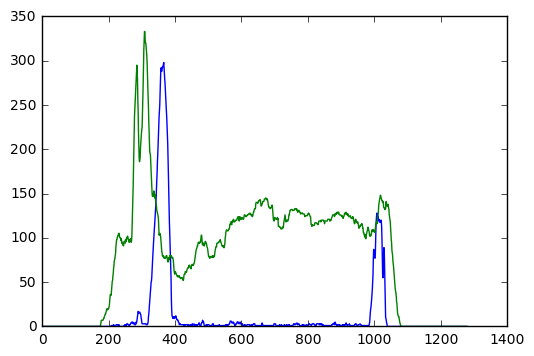

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
#import moviepy as mve

counter = 0
output = 'project_video_1.mp4'
#output_new = 'output_lane_detect1.mp4'
clip1 = VideoFileClip("project_video.mp4",audio = False)
clip2 = clip1.subclip(1, 10) 
#plt.imshow(clip1)
output_clip1 = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip1.write_videofile( output, audio=False)
#print(counter)

In [25]:
HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

458.25139019 3504.56242013
[MoviePy] >>>> Building video challenge_video_1.mp4
[MoviePy] Writing video challenge_video_1.mp4


  0%|                                                  | 0/485 [00:00<?, ?it/s]

604.779790782 3290.40568405


  0%|                                          | 1/485 [00:00<03:58,  2.03it/s]

610.75352268 1380.3282657


  0%|▏                                         | 2/485 [00:01<04:49,  1.67it/s]

661.665995164 859.028073362


  1%|▎                                         | 3/485 [00:02<05:06,  1.57it/s]

603.186156628 795.849160895


  1%|▎                                         | 4/485 [00:02<05:43,  1.40it/s]

694.760994096 765.609535795


  1%|▍                                         | 5/485 [00:03<05:41,  1.41it/s]

669.204200761 800.73887466


  1%|▌                                         | 6/485 [00:04<05:24,  1.48it/s]

697.05642292 735.48223677


  1%|▌                                         | 7/485 [00:04<05:02,  1.58it/s]

626.326231558 740.172197729


  2%|▋                                         | 8/485 [00:05<04:36,  1.72it/s]

693.857173215 714.601790581


  2%|▊                                         | 9/485 [00:05<04:13,  1.88it/s]

648.804988429 703.275501613


  2%|▊                                        | 10/485 [00:06<03:56,  2.01it/s]

607.348491524 765.959440101


  2%|▉                                        | 11/485 [00:06<03:44,  2.11it/s]

645.577050154 759.206498131


  2%|█                                        | 12/485 [00:06<03:33,  2.22it/s]

729.227199235 742.693712495


  3%|█                                        | 13/485 [00:07<03:25,  2.30it/s]

754.980003348 733.716368531


  3%|█▏                                       | 14/485 [00:07<03:20,  2.35it/s]

730.575578659 698.625966661


  3%|█▎                                       | 15/485 [00:08<03:16,  2.39it/s]

745.764603505 699.553925516


  3%|█▎                                       | 16/485 [00:08<03:15,  2.40it/s]

767.69978696 717.927110749


  4%|█▍                                       | 17/485 [00:08<03:17,  2.37it/s]

892.336637541 700.002006717


  4%|█▌                                       | 18/485 [00:09<03:20,  2.33it/s]

779.787221489 713.391955607


  4%|█▌                                       | 19/485 [00:09<03:23,  2.29it/s]

871.880420857 726.921448002


  4%|█▋                                       | 20/485 [00:10<03:22,  2.29it/s]

871.880420857 726.921448002


  4%|█▊                                       | 21/485 [00:10<03:18,  2.34it/s]

637.271922212 3031.25723636


  5%|█▊                                       | 22/485 [00:11<03:14,  2.39it/s]

637.271922212 3031.25723636


  5%|█▉                                       | 23/485 [00:11<03:10,  2.42it/s]

506.449283079 4738.45214704


  5%|██                                       | 24/485 [00:11<03:18,  2.32it/s]

506.449283079 4738.45214704


  5%|██                                       | 25/485 [00:12<03:20,  2.29it/s]

5218.29144956 1647.03139357


  5%|██▏                                      | 26/485 [00:12<03:19,  2.30it/s]

5218.29144956 1647.03139357


  6%|██▎                                      | 27/485 [00:13<03:14,  2.36it/s]

1969.93701073 2368.2513601


  6%|██▎                                      | 28/485 [00:13<03:11,  2.38it/s]

1969.93701073 2368.2513601


  6%|██▍                                      | 29/485 [00:14<03:09,  2.41it/s]

5037.95401975 1938.05890642


  6%|██▌                                      | 30/485 [00:14<03:09,  2.40it/s]

5037.95401975 1938.05890642


  6%|██▌                                      | 31/485 [00:14<03:07,  2.43it/s]

785.865427405 10776.5400174


  7%|██▋                                      | 32/485 [00:15<03:05,  2.44it/s]

785.865427405 10776.5400174


  7%|██▊                                      | 33/485 [00:15<03:04,  2.45it/s]

847.329923369 2448.80100354


  7%|██▊                                      | 34/485 [00:16<03:04,  2.45it/s]

847.329923369 2448.80100354


  7%|██▉                                      | 35/485 [00:16<03:03,  2.45it/s]

847.329923369 2448.80100354


  7%|███                                      | 36/485 [00:16<03:05,  2.42it/s]

847.329923369 2448.80100354


  8%|███▏                                     | 37/485 [00:17<03:09,  2.37it/s]

847.329923369 2448.80100354


  8%|███▏                                     | 38/485 [00:17<03:08,  2.37it/s]

847.329923369 2448.80100354


  8%|███▎                                     | 39/485 [00:18<03:06,  2.39it/s]

847.329923369 2448.80100354


  8%|███▍                                     | 40/485 [00:18<03:06,  2.38it/s]

847.329923369 2448.80100354


  8%|███▍                                     | 41/485 [00:19<03:06,  2.38it/s]

847.329923369 2448.80100354


  9%|███▌                                     | 42/485 [00:19<03:05,  2.39it/s]

847.329923369 2448.80100354


  9%|███▋                                     | 43/485 [00:19<03:09,  2.34it/s]

847.329923369 2448.80100354


  9%|███▋                                     | 44/485 [00:20<03:06,  2.36it/s]

476.093752723 673.761666821


  9%|███▊                                     | 45/485 [00:20<03:07,  2.35it/s]

456.79549988 734.986772862


  9%|███▉                                     | 46/485 [00:21<03:07,  2.35it/s]

455.980271639 759.087662332


 10%|███▉                                     | 47/485 [00:21<03:05,  2.36it/s]

461.479684877 771.084545966


 10%|████                                     | 48/485 [00:22<03:05,  2.35it/s]

446.35601545 740.51077173


 10%|████▏                                    | 49/485 [00:22<03:09,  2.30it/s]

445.334127986 670.49824989


 10%|████▏                                    | 50/485 [00:22<03:08,  2.31it/s]

446.620171706 630.795311649


 11%|████▎                                    | 51/485 [00:23<03:04,  2.35it/s]

463.798963105 606.914437159


 11%|████▍                                    | 52/485 [00:23<03:03,  2.36it/s]

541.017387081 602.444364546


 11%|████▍                                    | 53/485 [00:24<03:05,  2.33it/s]

541.017387081 602.444364546


 11%|████▌                                    | 54/485 [00:24<03:04,  2.34it/s]

541.017387081 602.444364546


 11%|████▋                                    | 55/485 [00:25<03:11,  2.24it/s]

490.263576737 3274.91051432


 12%|████▋                                    | 56/485 [00:25<03:12,  2.23it/s]

778.817156371 1880.38160779


 12%|████▊                                    | 57/485 [00:26<03:15,  2.19it/s]

778.817156371 1880.38160779


 12%|████▉                                    | 58/485 [00:26<03:15,  2.18it/s]

544.067023226 1318.91674409


 12%|████▉                                    | 59/485 [00:26<03:10,  2.24it/s]

1475.01874234 1874.12723457


 12%|█████                                    | 60/485 [00:27<03:08,  2.25it/s]

3293.15886234 3613.15120743


 13%|█████▏                                   | 61/485 [00:27<03:09,  2.24it/s]

3760.6211723 36036.069894


 13%|█████▏                                   | 62/485 [00:28<03:09,  2.24it/s]

3551.03423757 3528.95636698


 13%|█████▎                                   | 63/485 [00:28<03:08,  2.24it/s]

2831.94234492 2335.06598923


 13%|█████▍                                   | 64/485 [00:29<03:15,  2.16it/s]

2901.12829581 3112.40528441


 13%|█████▍                                   | 65/485 [00:29<03:19,  2.10it/s]

2803.86790004 2371.25542274


 14%|█████▌                                   | 66/485 [00:30<03:21,  2.08it/s]

2633.76089346 1580.78421976


 14%|█████▋                                   | 67/485 [00:30<03:33,  1.95it/s]

2687.75321608 1548.83130097


 14%|█████▋                                   | 68/485 [00:31<03:33,  1.95it/s]

2463.7846004 1341.12800971


 14%|█████▊                                   | 69/485 [00:31<03:31,  1.97it/s]

2479.18648088 1391.13166438


 14%|█████▉                                   | 70/485 [00:32<03:24,  2.03it/s]

2523.94555452 1375.91389065


 15%|██████                                   | 71/485 [00:32<03:23,  2.03it/s]

2440.88526979 2309.74050441


 15%|██████                                   | 72/485 [00:33<03:37,  1.90it/s]

2609.32255617 10478.3351576


 15%|██████▏                                  | 73/485 [00:33<03:35,  1.91it/s]

2594.69938708 3996.89350329


 15%|██████▎                                  | 74/485 [00:34<03:30,  1.96it/s]

2461.94649792 3090.59947314


 15%|██████▎                                  | 75/485 [00:34<03:26,  1.99it/s]

2508.03507164 83305.5245958


 16%|██████▍                                  | 76/485 [00:35<03:20,  2.04it/s]

2433.89160218 15737.2752365


 16%|██████▌                                  | 77/485 [00:35<03:11,  2.13it/s]

2286.15454009 10525.9937085


 16%|██████▌                                  | 78/485 [00:36<03:04,  2.21it/s]

2097.15838662 4183.69432639


 16%|██████▋                                  | 79/485 [00:36<03:00,  2.25it/s]

2012.79147503 6641.5605706


 16%|██████▊                                  | 80/485 [00:36<02:58,  2.27it/s]

1880.89657295 2556.69359287


 17%|██████▊                                  | 81/485 [00:37<02:56,  2.29it/s]

1880.89657295 2556.69359287


 17%|██████▉                                  | 82/485 [00:37<02:54,  2.32it/s]

917.557920385 437.219838738


 17%|███████                                  | 83/485 [00:38<02:53,  2.32it/s]

1773.69299337 926.241329515


 17%|███████                                  | 84/485 [00:38<02:51,  2.34it/s]

2057.66837231 1108.69794784


 18%|███████▏                                 | 85/485 [00:39<02:49,  2.36it/s]

1761.76147045 1098.61349752


 18%|███████▎                                 | 86/485 [00:39<02:49,  2.35it/s]

1637.71302709 1289.01079602


 18%|███████▎                                 | 87/485 [00:39<02:48,  2.36it/s]

1321.47077241 1315.45154298


 18%|███████▍                                 | 88/485 [00:40<02:52,  2.30it/s]

1057.0767712 1361.7094935


 18%|███████▌                                 | 89/485 [00:40<02:55,  2.26it/s]

849.789297307 1325.99149115


 19%|███████▌                                 | 90/485 [00:41<02:53,  2.27it/s]

936.090361447 1192.97911902


 19%|███████▋                                 | 91/485 [00:41<03:04,  2.14it/s]

900.030607307 1190.87585279


 19%|███████▊                                 | 92/485 [00:42<03:03,  2.14it/s]

746.877790013 1056.89322897


 19%|███████▊                                 | 93/485 [00:42<02:56,  2.22it/s]

769.735682975 1310.72604648


 19%|███████▉                                 | 94/485 [00:43<02:54,  2.24it/s]

826.518485925 1065.81937538


 20%|████████                                 | 95/485 [00:43<02:56,  2.21it/s]

778.273239751 908.193743303


 20%|████████                                 | 96/485 [00:44<02:57,  2.19it/s]

802.727335498 794.148381672


 20%|████████▏                                | 97/485 [00:44<02:53,  2.23it/s]

635.34018533 780.171037968


 20%|████████▎                                | 98/485 [00:44<02:52,  2.25it/s]

572.715062793 692.498401449


 20%|████████▎                                | 99/485 [00:45<02:49,  2.27it/s]

492.595019127 747.83291284


 21%|████████▏                               | 100/485 [00:45<02:50,  2.26it/s]

418.958774873 905.633608505


 21%|████████▎                               | 101/485 [00:46<02:50,  2.26it/s]

415.024836247 1026.24858327


 21%|████████▍                               | 102/485 [00:46<02:54,  2.19it/s]

462.964564589 1067.39831489


 21%|████████▍                               | 103/485 [00:47<02:51,  2.23it/s]

413.11150779 1231.61775444


 21%|████████▌                               | 104/485 [00:47<02:53,  2.19it/s]

475.372421505 1091.3696673


 22%|████████▋                               | 105/485 [00:48<02:50,  2.23it/s]

477.541831897 913.178920815


 22%|████████▋                               | 106/485 [00:48<02:54,  2.18it/s]

474.090062452 910.235589917


 22%|████████▊                               | 107/485 [00:49<02:52,  2.19it/s]

450.147752206 758.408231973


 22%|████████▉                               | 108/485 [00:49<02:49,  2.23it/s]

436.747552376 785.480391921


 22%|████████▉                               | 109/485 [00:49<02:46,  2.26it/s]

430.185414889 459.374615117


 23%|█████████                               | 110/485 [00:50<02:47,  2.24it/s]

399.650268015 432.576603789


 23%|█████████▏                              | 111/485 [00:50<02:45,  2.27it/s]

383.948209154 623.657722392


 23%|█████████▏                              | 112/485 [00:51<02:46,  2.24it/s]

383.948209154 623.657722392


 23%|█████████▎                              | 113/485 [00:51<02:44,  2.26it/s]

383.948209154 623.657722392


 24%|█████████▍                              | 114/485 [00:52<02:43,  2.27it/s]

383.948209154 623.657722392


 24%|█████████▍                              | 115/485 [00:52<02:40,  2.30it/s]

383.948209154 623.657722392


 24%|█████████▌                              | 116/485 [00:52<02:44,  2.24it/s]

383.948209154 623.657722392


 24%|█████████▋                              | 117/485 [00:53<02:45,  2.23it/s]

383.948209154 623.657722392


 24%|█████████▋                              | 118/485 [00:53<02:43,  2.24it/s]

383.948209154 623.657722392


 25%|█████████▊                              | 119/485 [00:54<02:41,  2.27it/s]

383.948209154 623.657722392


 25%|█████████▉                              | 120/485 [00:54<02:42,  2.25it/s]

1296.05242202 1205.18663226


 25%|█████████▉                              | 121/485 [00:55<02:40,  2.26it/s]

1760.03700562 977.688944038


 25%|██████████                              | 122/485 [00:55<02:44,  2.20it/s]

2032.29019809 982.928123263


 25%|██████████▏                             | 123/485 [00:56<02:44,  2.21it/s]

1763.36143618 929.655910217


 26%|██████████▏                             | 124/485 [00:56<02:44,  2.19it/s]

2761.45343975 901.54926401


 26%|██████████▎                             | 125/485 [00:57<02:43,  2.20it/s]

2761.45343975 901.54926401


 26%|██████████▍                             | 126/485 [00:57<02:40,  2.23it/s]

1714.37619953 933.458613636


 26%|██████████▍                             | 127/485 [00:57<02:42,  2.21it/s]

1961.95546206 990.071755182


 26%|██████████▌                             | 128/485 [00:58<02:42,  2.19it/s]

2274.60682859 920.010542961


 27%|██████████▋                             | 129/485 [00:58<02:51,  2.08it/s]

1933.24011808 940.783071766


 27%|██████████▋                             | 130/485 [00:59<02:44,  2.16it/s]

1430.62258651 750.937499406


 27%|██████████▊                             | 131/485 [00:59<02:44,  2.15it/s]

1430.62258651 750.937499406


 27%|██████████▉                             | 132/485 [01:00<02:42,  2.18it/s]

1430.62258651 750.937499406


 27%|██████████▉                             | 133/485 [01:00<02:36,  2.24it/s]

1430.62258651 750.937499406


 28%|███████████                             | 134/485 [01:01<02:40,  2.19it/s]

1430.62258651 750.937499406


 28%|███████████▏                            | 135/485 [01:01<02:38,  2.21it/s]

1430.62258651 750.937499406


 28%|███████████▏                            | 136/485 [01:02<02:41,  2.16it/s]

1430.62258651 750.937499406


 28%|███████████▎                            | 137/485 [01:02<02:36,  2.22it/s]

1430.62258651 750.937499406


 28%|███████████▍                            | 138/485 [01:02<02:33,  2.27it/s]

1430.62258651 750.937499406


 29%|███████████▍                            | 139/485 [01:03<02:33,  2.26it/s]

1430.62258651 750.937499406


 29%|███████████▌                            | 140/485 [01:03<02:36,  2.20it/s]

1430.62258651 750.937499406


 29%|███████████▋                            | 141/485 [01:04<02:40,  2.14it/s]

1032.20334032 888.074815706


 29%|███████████▋                            | 142/485 [01:04<02:38,  2.16it/s]

1879.0630625 855.104100378


 29%|███████████▊                            | 143/485 [01:05<02:36,  2.18it/s]

1879.0630625 855.104100378


 30%|███████████▉                            | 144/485 [01:05<02:34,  2.21it/s]

670.645495741 1228.45336491


 30%|███████████▉                            | 145/485 [01:06<02:32,  2.24it/s]

681.285348324 1716.6378228


 30%|████████████                            | 146/485 [01:06<02:31,  2.24it/s]

1009.92463076 1718.26821928


 30%|████████████                            | 147/485 [01:07<02:31,  2.23it/s]

1962.36492794 1553.38845687


 31%|████████████▏                           | 148/485 [01:07<02:33,  2.19it/s]

3825.18951578 1395.13030561


 31%|████████████▎                           | 149/485 [01:08<02:40,  2.10it/s]

4660.13983295 1390.83402236


 31%|████████████▎                           | 150/485 [01:08<02:42,  2.07it/s]

7254.08911898 1133.73077967


 31%|████████████▍                           | 151/485 [01:09<02:39,  2.09it/s]

10399.6827878 1160.19932827


 31%|████████████▌                           | 152/485 [01:09<02:38,  2.10it/s]

10399.6827878 1160.19932827


 32%|████████████▌                           | 153/485 [01:09<02:35,  2.14it/s]

661.78340523 706.14164243


 32%|████████████▋                           | 154/485 [01:10<02:31,  2.18it/s]

716.651857215 788.082770096


 32%|████████████▊                           | 155/485 [01:10<02:33,  2.15it/s]

763.567135944 900.209430004


 32%|████████████▊                           | 156/485 [01:11<02:39,  2.07it/s]

788.303203657 1100.55541027


 32%|████████████▉                           | 157/485 [01:11<02:39,  2.06it/s]

821.78030075 1326.54022758


 33%|█████████████                           | 158/485 [01:12<03:10,  1.72it/s]

847.314826604 1259.37267821


 33%|█████████████                           | 159/485 [01:13<03:04,  1.76it/s]

831.071976463 1254.67796311


 33%|█████████████▏                          | 160/485 [01:13<03:01,  1.79it/s]

851.33983018 1361.87397312


 33%|█████████████▎                          | 161/485 [01:14<02:52,  1.88it/s]

813.595853233 1157.23807446


 33%|█████████████▎                          | 162/485 [01:14<02:49,  1.90it/s]

794.722624919 1145.54537801


 34%|█████████████▍                          | 163/485 [01:15<02:44,  1.96it/s]

790.742936332 1190.11781946


 34%|█████████████▌                          | 164/485 [01:15<02:40,  2.00it/s]

762.444861837 1164.52986593


 34%|█████████████▌                          | 165/485 [01:16<02:36,  2.05it/s]

737.644139147 1168.67310109


 34%|█████████████▋                          | 166/485 [01:16<02:31,  2.10it/s]

726.076299324 1103.59165207


 34%|█████████████▊                          | 167/485 [01:17<02:26,  2.17it/s]

712.532767114 1087.1548677


 35%|█████████████▊                          | 168/485 [01:17<02:26,  2.16it/s]

694.864894599 1041.7823889


 35%|█████████████▉                          | 169/485 [01:17<02:27,  2.14it/s]

671.14843435 1083.74014648


 35%|██████████████                          | 170/485 [01:18<02:26,  2.15it/s]

669.449315576 1203.2375857


 35%|██████████████                          | 171/485 [01:18<02:23,  2.18it/s]

680.958066345 1173.26161353


 35%|██████████████▏                         | 172/485 [01:19<02:25,  2.15it/s]

679.378788013 1199.84570849


 36%|██████████████▎                         | 173/485 [01:19<02:21,  2.20it/s]

685.91743948 1294.87605134


 36%|██████████████▎                         | 174/485 [01:20<02:16,  2.28it/s]

697.81368261 1201.98135901


 36%|██████████████▍                         | 175/485 [01:20<02:13,  2.32it/s]

705.622781979 1381.48503742


 36%|██████████████▌                         | 176/485 [01:21<02:15,  2.28it/s]

719.09273921 1380.78032563


 36%|██████████████▌                         | 177/485 [01:21<02:16,  2.26it/s]

719.643387517 1429.27306147


 37%|██████████████▋                         | 178/485 [01:21<02:15,  2.27it/s]

710.202902805 1362.37787729


 37%|██████████████▊                         | 179/485 [01:22<02:15,  2.26it/s]

702.643783233 1470.06371429


 37%|██████████████▊                         | 180/485 [01:22<02:21,  2.15it/s]

703.251926909 1625.8650051


 37%|██████████████▉                         | 181/485 [01:23<02:32,  1.99it/s]

676.878852141 1394.01495088


 38%|███████████████                         | 182/485 [01:24<02:36,  1.93it/s]

658.617272832 1411.71979556


 38%|███████████████                         | 183/485 [01:24<02:30,  2.01it/s]

668.89498539 1455.96506752


 38%|███████████████▏                        | 184/485 [01:24<02:30,  2.00it/s]

653.897273141 1487.11096971


 38%|███████████████▎                        | 185/485 [01:25<02:24,  2.07it/s]

641.603719443 1282.22758388


 38%|███████████████▎                        | 186/485 [01:25<02:20,  2.13it/s]

636.242275179 1276.44939218


 39%|███████████████▍                        | 187/485 [01:26<02:15,  2.21it/s]

645.397600675 1145.76332742


 39%|███████████████▌                        | 188/485 [01:26<02:13,  2.23it/s]

636.775837486 1020.3033877


 39%|███████████████▌                        | 189/485 [01:27<02:12,  2.24it/s]

614.671736511 1032.45018582


 39%|███████████████▋                        | 190/485 [01:27<02:09,  2.28it/s]

624.719522425 1094.08046485


 39%|███████████████▊                        | 191/485 [01:28<02:08,  2.28it/s]

632.583409838 1063.39758439


 40%|███████████████▊                        | 192/485 [01:28<02:10,  2.25it/s]

620.699250322 1165.08333456


 40%|███████████████▉                        | 193/485 [01:28<02:09,  2.26it/s]

609.237165373 1117.99769994


 40%|████████████████                        | 194/485 [01:29<02:05,  2.32it/s]

600.667534745 1015.70078877


 40%|████████████████                        | 195/485 [01:29<02:02,  2.37it/s]

584.538552112 997.101193366


 40%|████████████████▏                       | 196/485 [01:30<02:03,  2.35it/s]

584.758607834 898.976818339


 41%|████████████████▏                       | 197/485 [01:30<02:02,  2.34it/s]

597.734890204 1030.08327435


 41%|████████████████▎                       | 198/485 [01:30<02:00,  2.39it/s]

611.278912506 989.600260151


 41%|████████████████▍                       | 199/485 [01:31<02:10,  2.19it/s]

618.09535465 1028.58291381


 41%|████████████████▍                       | 200/485 [01:32<02:20,  2.03it/s]

629.709100562 979.307369541


 41%|████████████████▌                       | 201/485 [01:32<02:22,  1.99it/s]

633.011336969 878.592569765


 42%|████████████████▋                       | 202/485 [01:33<02:21,  2.00it/s]

643.334817778 929.599948298


 42%|████████████████▋                       | 203/485 [01:33<02:14,  2.09it/s]

650.613837773 950.045712595


 42%|████████████████▊                       | 204/485 [01:33<02:10,  2.15it/s]

678.406248012 949.516484956


 42%|████████████████▉                       | 205/485 [01:34<02:06,  2.22it/s]

803.802897963 920.638082358


 42%|████████████████▉                       | 206/485 [01:34<02:06,  2.21it/s]

906.272265296 975.508807606


 43%|█████████████████                       | 207/485 [01:35<02:03,  2.25it/s]

952.775897578 1042.74143443


 43%|█████████████████▏                      | 208/485 [01:35<02:03,  2.24it/s]

1025.34346107 1050.87140277


 43%|█████████████████▏                      | 209/485 [01:36<02:01,  2.27it/s]

1031.5213271 1105.79651637


 43%|█████████████████▎                      | 210/485 [01:36<01:59,  2.31it/s]

970.513116701 1008.28667568


 44%|█████████████████▍                      | 211/485 [01:36<01:56,  2.35it/s]

954.90692899 938.736887755


 44%|█████████████████▍                      | 212/485 [01:37<02:00,  2.26it/s]

990.674157707 967.984258154


 44%|█████████████████▌                      | 213/485 [01:37<01:59,  2.27it/s]

988.713772829 1032.85977914


 44%|█████████████████▋                      | 214/485 [01:38<01:58,  2.30it/s]

1017.15649629 1047.91598944


 44%|█████████████████▋                      | 215/485 [01:38<01:55,  2.34it/s]

1029.76799398 1025.33795216


 45%|█████████████████▊                      | 216/485 [01:39<01:56,  2.31it/s]

1081.10382714 1033.39922475


 45%|█████████████████▉                      | 217/485 [01:39<01:53,  2.35it/s]

1149.4103367 1050.64822799


 45%|█████████████████▉                      | 218/485 [01:39<01:51,  2.40it/s]

1176.49804403 1041.95791814


 45%|██████████████████                      | 219/485 [01:40<01:49,  2.42it/s]

1241.80731977 1107.9993861


 45%|██████████████████▏                     | 220/485 [01:40<01:53,  2.34it/s]

1310.07343244 1040.73910328


 46%|██████████████████▏                     | 221/485 [01:41<01:54,  2.31it/s]

1340.97173532 985.401231335


 46%|██████████████████▎                     | 222/485 [01:41<01:54,  2.30it/s]

1424.31149719 1049.24045182


 46%|██████████████████▍                     | 223/485 [01:42<01:52,  2.33it/s]

1471.39980028 1148.8827722


 46%|██████████████████▍                     | 224/485 [01:42<01:52,  2.32it/s]

1435.44360864 1015.4610501


 46%|██████████████████▌                     | 225/485 [01:42<01:49,  2.38it/s]

1362.3840935 975.852842214


 47%|██████████████████▋                     | 226/485 [01:43<01:48,  2.39it/s]

1268.81738514 981.857801784


 47%|██████████████████▋                     | 227/485 [01:43<01:48,  2.38it/s]

1199.01065669 1125.68831393


 47%|██████████████████▊                     | 228/485 [01:44<01:54,  2.25it/s]

1097.89043005 1057.27753141


 47%|██████████████████▉                     | 229/485 [01:44<01:53,  2.26it/s]

1037.19708235 1132.90939255


 47%|██████████████████▉                     | 230/485 [01:45<01:52,  2.26it/s]

1155.94782391 1110.90462998


 48%|███████████████████                     | 231/485 [01:45<01:51,  2.28it/s]

1228.37528472 1112.82779673


 48%|███████████████████▏                    | 232/485 [01:46<01:52,  2.25it/s]

1263.52080877 1135.65300992


 48%|███████████████████▏                    | 233/485 [01:46<01:52,  2.25it/s]

1336.90153899 1182.7365937


 48%|███████████████████▎                    | 234/485 [01:46<01:49,  2.29it/s]

1286.20096199 1004.81946165


 48%|███████████████████▍                    | 235/485 [01:47<01:47,  2.32it/s]

1370.57088902 1172.87097474


 49%|███████████████████▍                    | 236/485 [01:47<01:47,  2.32it/s]

1490.03585738 954.691084786


 49%|███████████████████▌                    | 237/485 [01:48<01:47,  2.30it/s]

1104.13380045 947.573976774


 49%|███████████████████▋                    | 238/485 [01:48<01:47,  2.30it/s]

1004.38843661 983.156730659


 49%|███████████████████▋                    | 239/485 [01:49<01:47,  2.29it/s]

825.788745008 1025.83884906


 49%|███████████████████▊                    | 240/485 [01:49<01:48,  2.27it/s]

793.002747742 1025.45751852


 50%|███████████████████▉                    | 241/485 [01:49<01:46,  2.30it/s]

871.341493627 1068.33333178


 50%|███████████████████▉                    | 242/485 [01:50<01:49,  2.22it/s]

920.016217172 1051.33410084


 50%|████████████████████                    | 243/485 [01:50<01:46,  2.28it/s]

973.553375852 1088.32287188


 50%|████████████████████                    | 244/485 [01:51<01:50,  2.18it/s]

979.400283754 1137.44574129


 51%|████████████████████▏                   | 245/485 [01:51<01:47,  2.22it/s]

977.630461269 1215.20336289


 51%|████████████████████▎                   | 246/485 [01:52<01:48,  2.19it/s]

931.13068914 1235.8365058


 51%|████████████████████▎                   | 247/485 [01:52<01:48,  2.20it/s]

885.016331477 1184.27086906


 51%|████████████████████▍                   | 248/485 [01:53<01:46,  2.23it/s]

831.048260765 1141.6474298


 51%|████████████████████▌                   | 249/485 [01:53<01:43,  2.28it/s]

843.814778818 1167.05627954


 52%|████████████████████▌                   | 250/485 [01:54<01:42,  2.29it/s]

810.9757488 1189.43107254


 52%|████████████████████▋                   | 251/485 [01:54<01:42,  2.29it/s]

770.057161791 1075.14229197


 52%|████████████████████▊                   | 252/485 [01:54<01:42,  2.26it/s]

730.477822562 1264.7174121


 52%|████████████████████▊                   | 253/485 [01:55<01:41,  2.29it/s]

774.140519205 1074.16070306


 52%|████████████████████▉                   | 254/485 [01:55<01:39,  2.32it/s]

807.875464891 1124.25629919


 53%|█████████████████████                   | 255/485 [01:56<01:39,  2.32it/s]

813.580492669 1147.05670262


 53%|█████████████████████                   | 256/485 [01:56<01:39,  2.30it/s]

835.730437123 1014.69689216


 53%|█████████████████████▏                  | 257/485 [01:57<01:40,  2.28it/s]

828.625795681 931.417891462


 53%|█████████████████████▎                  | 258/485 [01:57<01:39,  2.28it/s]

837.213771212 1019.26989954


 53%|█████████████████████▎                  | 259/485 [01:57<01:37,  2.31it/s]

841.317172019 983.298523578


 54%|█████████████████████▍                  | 260/485 [01:58<01:37,  2.30it/s]

810.995498866 964.185622672


 54%|█████████████████████▌                  | 261/485 [01:58<01:37,  2.29it/s]

754.276978958 857.463507565


 54%|█████████████████████▌                  | 262/485 [01:59<01:37,  2.29it/s]

753.009015388 848.710551012


 54%|█████████████████████▋                  | 263/485 [01:59<01:39,  2.23it/s]

752.846021761 823.873699319


 54%|█████████████████████▊                  | 264/485 [02:00<01:39,  2.23it/s]

772.273841642 900.546241827


 55%|█████████████████████▊                  | 265/485 [02:00<01:40,  2.20it/s]

840.219339331 986.784938434


 55%|█████████████████████▉                  | 266/485 [02:01<01:48,  2.03it/s]

866.914671404 1061.08237923


 55%|██████████████████████                  | 267/485 [02:01<01:44,  2.08it/s]

924.641355343 1105.3869795


 55%|██████████████████████                  | 268/485 [02:02<01:45,  2.07it/s]

975.960681084 1268.56325926


 55%|██████████████████████▏                 | 269/485 [02:02<01:45,  2.04it/s]

1024.89902055 1180.48427474


 56%|██████████████████████▎                 | 270/485 [02:03<01:42,  2.10it/s]

1055.30583363 1174.86180787


 56%|██████████████████████▎                 | 271/485 [02:03<01:37,  2.20it/s]

1064.25934429 1185.30241278


 56%|██████████████████████▍                 | 272/485 [02:03<01:35,  2.22it/s]

1105.32539112 1120.12425971


 56%|██████████████████████▌                 | 273/485 [02:04<01:34,  2.25it/s]

1064.87415987 1136.30142124


 56%|██████████████████████▌                 | 274/485 [02:04<01:33,  2.25it/s]

1102.35900421 1074.25433028


 57%|██████████████████████▋                 | 275/485 [02:05<01:34,  2.23it/s]

1055.41660057 865.634397419


 57%|██████████████████████▊                 | 276/485 [02:05<01:38,  2.13it/s]

1099.18254878 998.984658994


 57%|██████████████████████▊                 | 277/485 [02:06<01:38,  2.10it/s]

1100.07174199 861.190189691


 57%|██████████████████████▉                 | 278/485 [02:06<01:38,  2.11it/s]

1126.64194642 912.322815855


 58%|███████████████████████                 | 279/485 [02:07<01:34,  2.19it/s]

1168.51458995 988.192212556


 58%|███████████████████████                 | 280/485 [02:07<01:35,  2.14it/s]

1259.28244966 1039.61097601


 58%|███████████████████████▏                | 281/485 [02:08<01:33,  2.18it/s]

1271.58431086 1037.70402497


 58%|███████████████████████▎                | 282/485 [02:08<01:32,  2.20it/s]

1355.32969368 1179.485974


 58%|███████████████████████▎                | 283/485 [02:09<01:29,  2.25it/s]

1415.44279952 1132.25733582


 59%|███████████████████████▍                | 284/485 [02:09<01:29,  2.24it/s]

1441.95056871 1113.05553422


 59%|███████████████████████▌                | 285/485 [02:09<01:28,  2.26it/s]

1494.89233243 1211.98348757


 59%|███████████████████████▌                | 286/485 [02:10<01:28,  2.24it/s]

1543.72705884 1297.87706531


 59%|███████████████████████▋                | 287/485 [02:10<01:27,  2.26it/s]

1502.79060266 1314.27435581


 59%|███████████████████████▊                | 288/485 [02:11<01:28,  2.23it/s]

1527.45597471 1317.66490979


 60%|███████████████████████▊                | 289/485 [02:11<01:28,  2.22it/s]

1549.84770073 1043.2127712


 60%|███████████████████████▉                | 290/485 [02:12<01:27,  2.23it/s]

1642.17050815 1199.186743


 60%|████████████████████████                | 291/485 [02:12<01:30,  2.14it/s]

1689.0734161 1078.41025935


 60%|████████████████████████                | 292/485 [02:13<01:30,  2.14it/s]

1822.75995341 1217.16242658


 60%|████████████████████████▏               | 293/485 [02:13<01:33,  2.06it/s]

1925.70192149 1164.07562279


 61%|████████████████████████▏               | 294/485 [02:14<01:31,  2.09it/s]

1958.61419231 1238.23079781


 61%|████████████████████████▎               | 295/485 [02:14<01:28,  2.15it/s]

1997.82443769 1325.18594104


 61%|████████████████████████▍               | 296/485 [02:14<01:26,  2.19it/s]

2098.32314242 1411.17545291


 61%|████████████████████████▍               | 297/485 [02:15<01:23,  2.25it/s]

2143.1765984 1439.67486616


 61%|████████████████████████▌               | 298/485 [02:15<01:22,  2.27it/s]

2237.99921379 1495.02136198


 62%|████████████████████████▋               | 299/485 [02:16<01:21,  2.28it/s]

2318.83963407 1497.88025243


 62%|████████████████████████▋               | 300/485 [02:16<01:20,  2.29it/s]

2395.40074372 1716.24510137


 62%|████████████████████████▊               | 301/485 [02:17<01:24,  2.18it/s]

2726.18196821 1690.67237317


 62%|████████████████████████▉               | 302/485 [02:17<01:27,  2.08it/s]

2757.49733243 1820.49174871


 62%|████████████████████████▉               | 303/485 [02:18<01:40,  1.81it/s]

3264.09243114 1493.4570614


 63%|█████████████████████████               | 304/485 [02:18<01:36,  1.88it/s]

3757.63300632 1753.37386769


 63%|█████████████████████████▏              | 305/485 [02:19<01:33,  1.92it/s]

4275.34669476 1858.30497574


 63%|█████████████████████████▏              | 306/485 [02:19<01:29,  2.01it/s]

4351.22376054 1731.58490585


 63%|█████████████████████████▎              | 307/485 [02:20<01:27,  2.05it/s]

4923.68929771 1963.6001459


 64%|█████████████████████████▍              | 308/485 [02:20<01:25,  2.07it/s]

4919.59049564 1963.80978724


 64%|█████████████████████████▍              | 309/485 [02:21<01:22,  2.12it/s]

5667.77679615 1989.82317264


 64%|█████████████████████████▌              | 310/485 [02:21<01:22,  2.13it/s]

5708.51953296 2030.92915883


 64%|█████████████████████████▋              | 311/485 [02:22<01:20,  2.16it/s]

7012.76577708 2129.9329526


 64%|█████████████████████████▋              | 312/485 [02:22<01:18,  2.20it/s]

9028.93979143 2763.64487575


 65%|█████████████████████████▊              | 313/485 [02:23<01:16,  2.24it/s]

9533.79700027 3008.90852598


 65%|█████████████████████████▉              | 314/485 [02:23<01:17,  2.22it/s]

11735.887195 2613.2263785


 65%|█████████████████████████▉              | 315/485 [02:23<01:15,  2.25it/s]

13157.9697877 3486.74302001


 65%|██████████████████████████              | 316/485 [02:24<01:13,  2.30it/s]

13952.8244285 3258.6739473


 65%|██████████████████████████▏             | 317/485 [02:24<01:12,  2.33it/s]

15637.7021512 2843.94898912


 66%|██████████████████████████▏             | 318/485 [02:25<01:12,  2.31it/s]

22168.8581186 3287.15745648


 66%|██████████████████████████▎             | 319/485 [02:25<01:11,  2.33it/s]

22509.7975656 4680.56761765


 66%|██████████████████████████▍             | 320/485 [02:26<01:09,  2.37it/s]

37817.6394688 3411.35537929


 66%|██████████████████████████▍             | 321/485 [02:26<01:08,  2.39it/s]

26562.1934286 3285.60304018


 66%|██████████████████████████▌             | 322/485 [02:26<01:08,  2.39it/s]

29329.2373615 3215.39809821


 67%|██████████████████████████▋             | 323/485 [02:27<01:07,  2.39it/s]

25606.3999298 3324.95518754


 67%|██████████████████████████▋             | 324/485 [02:27<01:09,  2.31it/s]

20329.6623101 3302.42302925


 67%|██████████████████████████▊             | 325/485 [02:28<01:14,  2.15it/s]

13320.6479784 2952.19143741


 67%|██████████████████████████▉             | 326/485 [02:28<01:15,  2.10it/s]

18162.5026154 2793.50967984


 67%|██████████████████████████▉             | 327/485 [02:29<01:15,  2.10it/s]

12602.5049863 3264.67883944


 68%|███████████████████████████             | 328/485 [02:29<01:18,  1.99it/s]

12749.9863469 3134.23725507


 68%|███████████████████████████▏            | 329/485 [02:30<01:22,  1.89it/s]

11624.5285291 4189.97802894


 68%|███████████████████████████▏            | 330/485 [02:30<01:23,  1.85it/s]

8627.40599803 3558.71369293


 68%|███████████████████████████▎            | 331/485 [02:31<01:20,  1.92it/s]

7865.88452028 7187.57429339


 68%|███████████████████████████▍            | 332/485 [02:31<01:17,  1.97it/s]

7607.28588204 5140.82102376


 69%|███████████████████████████▍            | 333/485 [02:32<01:17,  1.96it/s]

6776.84051555 5758.86854215


 69%|███████████████████████████▌            | 334/485 [02:33<01:22,  1.82it/s]

6145.08845949 6202.14744497


 69%|███████████████████████████▋            | 335/485 [02:33<01:20,  1.86it/s]

6350.94386342 6045.64822441


 69%|███████████████████████████▋            | 336/485 [02:34<01:19,  1.88it/s]

5349.0127387 6764.14836977


 69%|███████████████████████████▊            | 337/485 [02:34<01:15,  1.96it/s]

5676.9565382 14435.4962048


 70%|███████████████████████████▉            | 338/485 [02:35<01:12,  2.04it/s]

5253.35949118 1218910.80604


 70%|███████████████████████████▉            | 339/485 [02:35<01:08,  2.14it/s]

4255.20332011 5733.17273801


 70%|████████████████████████████            | 340/485 [02:35<01:06,  2.17it/s]

4579.76150266 12335.0782066


 70%|████████████████████████████            | 341/485 [02:36<01:04,  2.22it/s]

4929.70765176 12724.8483646


 71%|████████████████████████████▏           | 342/485 [02:36<01:03,  2.24it/s]

7483.55151757 73472.0571575


 71%|████████████████████████████▎           | 343/485 [02:37<01:02,  2.27it/s]

6687.59265186 11454.679268


 71%|████████████████████████████▎           | 344/485 [02:37<01:01,  2.28it/s]

5177.65626991 12075.875088


 71%|████████████████████████████▍           | 345/485 [02:38<01:01,  2.27it/s]

8118.48349008 119555.030314


 71%|████████████████████████████▌           | 346/485 [02:38<01:00,  2.30it/s]

11497.9191087 70734.0852467


 72%|████████████████████████████▌           | 347/485 [02:38<01:00,  2.29it/s]

19981.6312339 10548.6152037


 72%|████████████████████████████▋           | 348/485 [02:39<00:59,  2.32it/s]

13959.3151277 67039.160722


 72%|████████████████████████████▊           | 349/485 [02:39<00:58,  2.34it/s]

24792.4926569 21281.0995481


 72%|████████████████████████████▊           | 350/485 [02:40<01:00,  2.25it/s]

168066.311215 12148.6944096


 72%|████████████████████████████▉           | 351/485 [02:40<00:57,  2.32it/s]

328790.456884 18392.7859155


 73%|█████████████████████████████           | 352/485 [02:41<00:56,  2.37it/s]

263149.904202 9942.06084766


 73%|█████████████████████████████           | 353/485 [02:41<00:56,  2.35it/s]

40852.255464 20910.8352505


 73%|█████████████████████████████▏          | 354/485 [02:41<00:56,  2.30it/s]

34428.7285241 3748.19705381


 73%|█████████████████████████████▎          | 355/485 [02:42<00:57,  2.28it/s]

24771.1447829 4096.00825123


 73%|█████████████████████████████▎          | 356/485 [02:42<00:57,  2.26it/s]

24084.2962479 3558.0307706


 74%|█████████████████████████████▍          | 357/485 [02:43<00:56,  2.28it/s]

13424.313484 4371.6894265


 74%|█████████████████████████████▌          | 358/485 [02:43<00:55,  2.31it/s]

13170.8490589 4854.94009235


 74%|█████████████████████████████▌          | 359/485 [02:44<00:54,  2.32it/s]

10820.6242772 3809.10095948


 74%|█████████████████████████████▋          | 360/485 [02:44<00:53,  2.32it/s]

9665.64837563 3443.62597887


 74%|█████████████████████████████▊          | 361/485 [02:44<00:54,  2.28it/s]

9310.55092354 4844.24782178


 75%|█████████████████████████████▊          | 362/485 [02:45<00:53,  2.31it/s]

8753.87002339 4253.55662245


 75%|█████████████████████████████▉          | 363/485 [02:45<00:52,  2.34it/s]

9363.36820407 5248.17981731


 75%|██████████████████████████████          | 364/485 [02:46<00:50,  2.39it/s]

9189.22161993 4949.80693192


 75%|██████████████████████████████          | 365/485 [02:46<00:51,  2.34it/s]

9154.28183842 4577.69199155


 75%|██████████████████████████████▏         | 366/485 [02:47<00:51,  2.33it/s]

9154.28183842 4577.69199155


 76%|██████████████████████████████▎         | 367/485 [02:47<00:51,  2.31it/s]

2829.06989741 2384.13385765


 76%|██████████████████████████████▎         | 368/485 [02:47<00:51,  2.28it/s]

3531.70064345 2705.55103691


 76%|██████████████████████████████▍         | 369/485 [02:48<00:49,  2.33it/s]

3510.89401162 2628.76263963


 76%|██████████████████████████████▌         | 370/485 [02:48<00:49,  2.31it/s]

3407.10917397 2002.72153434


 76%|██████████████████████████████▌         | 371/485 [02:49<00:48,  2.33it/s]

2944.24211548 1925.98405268


 77%|██████████████████████████████▋         | 372/485 [02:49<00:49,  2.29it/s]

2958.15403738 2225.55515206


 77%|██████████████████████████████▊         | 373/485 [02:50<00:48,  2.30it/s]

2961.94651696 2388.01228592


 77%|██████████████████████████████▊         | 374/485 [02:50<00:47,  2.33it/s]

2887.35019743 2221.47500432


 77%|██████████████████████████████▉         | 375/485 [02:51<00:47,  2.31it/s]

2871.60256248 2370.15580342


 78%|███████████████████████████████         | 376/485 [02:51<00:47,  2.30it/s]

3054.14281166 2666.2162275


 78%|███████████████████████████████         | 377/485 [02:51<00:47,  2.27it/s]

3344.5501093 2951.2427223


 78%|███████████████████████████████▏        | 378/485 [02:52<00:47,  2.26it/s]

3493.58605236 2920.90179827


 78%|███████████████████████████████▎        | 379/485 [02:52<00:46,  2.28it/s]

4304.6951189 3072.78345795


 78%|███████████████████████████████▎        | 380/485 [02:53<00:46,  2.28it/s]

9601.61019292 2797.36551501


 79%|███████████████████████████████▍        | 381/485 [02:53<00:45,  2.27it/s]

56006.255654 2683.45250921


 79%|███████████████████████████████▌        | 382/485 [02:54<00:45,  2.24it/s]

1058920.42088 2786.08201214


 79%|███████████████████████████████▌        | 383/485 [02:54<00:45,  2.23it/s]

325742.370655 2845.77695887


 79%|███████████████████████████████▋        | 384/485 [02:54<00:44,  2.26it/s]

80458.115324 2234.96217174


 79%|███████████████████████████████▊        | 385/485 [02:55<00:43,  2.31it/s]

199830.603206 2276.49181389


 80%|███████████████████████████████▊        | 386/485 [02:55<00:42,  2.33it/s]

31408.4220245 1880.86599128


 80%|███████████████████████████████▉        | 387/485 [02:56<00:42,  2.30it/s]

39170.0561568 2910.63528155


 80%|████████████████████████████████        | 388/485 [02:56<00:41,  2.32it/s]

27155.4597038 2682.45474263


 80%|████████████████████████████████        | 389/485 [02:57<00:41,  2.32it/s]

20950.3242792 3118.94947402


 80%|████████████████████████████████▏       | 390/485 [02:57<00:41,  2.31it/s]

11073.277976 4196.05122715


 81%|████████████████████████████████▏       | 391/485 [02:58<00:42,  2.23it/s]

11976.64789 2779.09245526


 81%|████████████████████████████████▎       | 392/485 [02:58<00:40,  2.30it/s]

8667.3286215 2910.40803238


 81%|████████████████████████████████▍       | 393/485 [02:58<00:39,  2.35it/s]

8724.85074925 4775.51994833


 81%|████████████████████████████████▍       | 394/485 [02:59<00:38,  2.37it/s]

8258.13558815 4407.27444653


 81%|████████████████████████████████▌       | 395/485 [02:59<00:38,  2.35it/s]

9228.965118 4694.17373876


 82%|████████████████████████████████▋       | 396/485 [03:00<00:38,  2.32it/s]

7238.17645994 5013.45516564


 82%|████████████████████████████████▋       | 397/485 [03:00<00:37,  2.34it/s]

7610.24486142 28508.4567699


 82%|████████████████████████████████▊       | 398/485 [03:00<00:36,  2.35it/s]

9933.05837683 29430.3521023


 82%|████████████████████████████████▉       | 399/485 [03:01<00:36,  2.35it/s]

8022.39993688 41347.4633008


 82%|████████████████████████████████▉       | 400/485 [03:01<00:35,  2.39it/s]

8865.57439855 32396.1976944


 83%|█████████████████████████████████       | 401/485 [03:02<00:34,  2.40it/s]

8368.26063894 19129.1622555


 83%|█████████████████████████████████▏      | 402/485 [03:02<00:35,  2.35it/s]

9016.82548728 15027.2900413


 83%|█████████████████████████████████▏      | 403/485 [03:03<00:34,  2.38it/s]

9215.57157695 18919.1863928


 83%|█████████████████████████████████▎      | 404/485 [03:03<00:34,  2.33it/s]

8521.90453504 31241.9942676


 84%|█████████████████████████████████▍      | 405/485 [03:03<00:34,  2.34it/s]

11058.1646866 318527.433189


 84%|█████████████████████████████████▍      | 406/485 [03:04<00:34,  2.32it/s]

10425.7494771 41447.0860475


 84%|█████████████████████████████████▌      | 407/485 [03:04<00:34,  2.29it/s]

18620.2920694 13326.976711


 84%|█████████████████████████████████▋      | 408/485 [03:05<00:33,  2.32it/s]

15138.3819362 95103.7558059


 84%|█████████████████████████████████▋      | 409/485 [03:05<00:32,  2.33it/s]

12739.3074832 24081.8735701


 85%|█████████████████████████████████▊      | 410/485 [03:06<00:32,  2.31it/s]

10493.6844748 20588.633943


 85%|█████████████████████████████████▉      | 411/485 [03:06<00:32,  2.30it/s]

10598.057028 21270.0778311


 85%|█████████████████████████████████▉      | 412/485 [03:07<00:31,  2.30it/s]

12047.4428373 89521.5360189


 85%|██████████████████████████████████      | 413/485 [03:07<00:30,  2.34it/s]

14749.586395 13301.2570331


 85%|██████████████████████████████████▏     | 414/485 [03:07<00:30,  2.34it/s]

40203.409737 12835.6962448


 86%|██████████████████████████████████▏     | 415/485 [03:08<00:29,  2.34it/s]

39508.8527878 18515.0899702


 86%|██████████████████████████████████▎     | 416/485 [03:08<00:28,  2.39it/s]

25462.2261833 17522.0303348


 86%|██████████████████████████████████▍     | 417/485 [03:09<00:28,  2.38it/s]

42829.6846949 19960.5999519


 86%|██████████████████████████████████▍     | 418/485 [03:09<00:28,  2.32it/s]

21029.4006808 150059.113178


 86%|██████████████████████████████████▌     | 419/485 [03:09<00:28,  2.32it/s]

30039.3540304 42574.2921275


 87%|██████████████████████████████████▋     | 420/485 [03:10<00:27,  2.33it/s]

18786.4739404 38262.0928198


 87%|██████████████████████████████████▋     | 421/485 [03:10<00:28,  2.21it/s]

19223.6101237 23658.9965712


 87%|██████████████████████████████████▊     | 422/485 [03:11<00:31,  2.02it/s]

27463.621509 7652.54957546


 87%|██████████████████████████████████▉     | 423/485 [03:12<00:31,  1.94it/s]

19655.1647968 4919.08618008


 87%|██████████████████████████████████▉     | 424/485 [03:12<00:31,  1.91it/s]

45808.0113152 3141.95846272


 88%|███████████████████████████████████     | 425/485 [03:13<00:29,  2.01it/s]

139637.224046 3703.83365143


 88%|███████████████████████████████████▏    | 426/485 [03:13<00:28,  2.08it/s]

297877.784345 3367.28632379


 88%|███████████████████████████████████▏    | 427/485 [03:13<00:26,  2.16it/s]

149330.391246 2373.48049798


 88%|███████████████████████████████████▎    | 428/485 [03:14<00:26,  2.17it/s]

127592.925218 75653.7993151


 88%|███████████████████████████████████▍    | 429/485 [03:14<00:25,  2.21it/s]

2069294.73595 13678.7889889


 89%|███████████████████████████████████▍    | 430/485 [03:15<00:24,  2.23it/s]

11767.2125791 20419.6191853


 89%|███████████████████████████████████▌    | 431/485 [03:15<00:24,  2.20it/s]

10142.3205205 18988.6954071


 89%|███████████████████████████████████▋    | 432/485 [03:16<00:23,  2.21it/s]

8182.13451577 5974.28070512


 89%|███████████████████████████████████▋    | 433/485 [03:16<00:23,  2.18it/s]

9709.31567191 7833.84911871


 89%|███████████████████████████████████▊    | 434/485 [03:17<00:24,  2.11it/s]

6724.52170724 6706.7310279


 90%|███████████████████████████████████▉    | 435/485 [03:17<00:24,  2.06it/s]

11365.4956729 9134.86091102


 90%|███████████████████████████████████▉    | 436/485 [03:18<00:23,  2.08it/s]

13639.1601154 7399.03908319


 90%|████████████████████████████████████    | 437/485 [03:18<00:22,  2.13it/s]

146956.590772 8344.003587


 90%|████████████████████████████████████    | 438/485 [03:19<00:22,  2.09it/s]

167851.987226 26716.9216498


 91%|████████████████████████████████████▏   | 439/485 [03:19<00:21,  2.12it/s]

13825.9738418 12870.2478462


 91%|████████████████████████████████████▎   | 440/485 [03:19<00:21,  2.13it/s]

23721.3591726 14281.2764296


 91%|████████████████████████████████████▎   | 441/485 [03:20<00:20,  2.18it/s]

16787.4891482 12419.2504861


 91%|████████████████████████████████████▍   | 442/485 [03:20<00:19,  2.19it/s]

28339.9573723 11799.397068


 91%|████████████████████████████████████▌   | 443/485 [03:21<00:19,  2.17it/s]

18193.6929228 9259.4477614


 92%|████████████████████████████████████▌   | 444/485 [03:21<00:18,  2.21it/s]

10963.6952605 19162.3248717


 92%|████████████████████████████████████▋   | 445/485 [03:22<00:17,  2.24it/s]

7395.99750708 9044.10440278


 92%|████████████████████████████████████▊   | 446/485 [03:22<00:17,  2.22it/s]

6954.05794911 7215.74562212


 92%|████████████████████████████████████▊   | 447/485 [03:23<00:16,  2.25it/s]

6856.30706374 6693.67894559


 92%|████████████████████████████████████▉   | 448/485 [03:23<00:16,  2.29it/s]

4892.77175645 9067.59012878


 93%|█████████████████████████████████████   | 449/485 [03:23<00:15,  2.28it/s]

4234.4901808 44016.5822761


 93%|█████████████████████████████████████   | 450/485 [03:24<00:16,  2.13it/s]

5337.61766608 6179.09728315


 93%|█████████████████████████████████████▏  | 451/485 [03:25<00:16,  2.02it/s]

3938.77179183 5369.89224277


 93%|█████████████████████████████████████▎  | 452/485 [03:25<00:16,  2.06it/s]

3549.08039678 2466.20800262


 93%|█████████████████████████████████████▎  | 453/485 [03:25<00:15,  2.07it/s]

3300.49545539 2498.29682224


 94%|█████████████████████████████████████▍  | 454/485 [03:26<00:15,  2.04it/s]

2916.16076119 2536.95943544


 94%|█████████████████████████████████████▌  | 455/485 [03:26<00:14,  2.10it/s]

2717.80750697 2503.34019459


 94%|█████████████████████████████████████▌  | 456/485 [03:27<00:13,  2.18it/s]

2773.17784329 2024.14835012


 94%|█████████████████████████████████████▋  | 457/485 [03:27<00:12,  2.20it/s]

2730.63325252 3118.25531661


 94%|█████████████████████████████████████▊  | 458/485 [03:28<00:12,  2.18it/s]

3401.08913126 3455.56548739


 95%|█████████████████████████████████████▊  | 459/485 [03:28<00:11,  2.24it/s]

4706.29304715 7209.95262808


 95%|█████████████████████████████████████▉  | 460/485 [03:29<00:10,  2.29it/s]

6053.28936708 15239.9990836


 95%|██████████████████████████████████████  | 461/485 [03:29<00:10,  2.27it/s]

8735.46636945 31908.0679414


 95%|██████████████████████████████████████  | 462/485 [03:29<00:10,  2.28it/s]

12725.0660919 473568.214308


 95%|██████████████████████████████████████▏ | 463/485 [03:30<00:09,  2.31it/s]

19924.6723329 185224.358399


 96%|██████████████████████████████████████▎ | 464/485 [03:30<00:09,  2.33it/s]

40802.4809147 4570.90452906


 96%|██████████████████████████████████████▎ | 465/485 [03:31<00:08,  2.36it/s]

16021.0647252 3119.45038487


 96%|██████████████████████████████████████▍ | 466/485 [03:31<00:08,  2.37it/s]

16021.0647252 3119.45038487


 96%|██████████████████████████████████████▌ | 467/485 [03:32<00:07,  2.29it/s]

57491.9812462 3396.87145498


 96%|██████████████████████████████████████▌ | 468/485 [03:32<00:07,  2.30it/s]

57491.9812462 3396.87145498


 97%|██████████████████████████████████████▋ | 469/485 [03:33<00:07,  2.26it/s]

57491.9812462 3396.87145498


 97%|██████████████████████████████████████▊ | 470/485 [03:33<00:06,  2.29it/s]

57491.9812462 3396.87145498


 97%|██████████████████████████████████████▊ | 471/485 [03:33<00:06,  2.32it/s]

57491.9812462 3396.87145498


 97%|██████████████████████████████████████▉ | 472/485 [03:34<00:05,  2.32it/s]

57491.9812462 3396.87145498


 98%|███████████████████████████████████████ | 473/485 [03:34<00:05,  2.32it/s]

57491.9812462 3396.87145498


 98%|███████████████████████████████████████ | 474/485 [03:35<00:04,  2.31it/s]

844.456523549 20121.3355017


 98%|███████████████████████████████████████▏| 475/485 [03:35<00:04,  2.31it/s]

1558.01818003 27401.1235738


 98%|███████████████████████████████████████▎| 476/485 [03:36<00:03,  2.31it/s]

1156.78755022 32033.0792266


 98%|███████████████████████████████████████▎| 477/485 [03:36<00:03,  2.33it/s]

1156.78755022 32033.0792266


 99%|███████████████████████████████████████▍| 478/485 [03:36<00:02,  2.35it/s]

1108.00949608 5618.13747699


 99%|███████████████████████████████████████▌| 479/485 [03:37<00:02,  2.35it/s]

10928.2250534 1944.65049763


 99%|███████████████████████████████████████▌| 480/485 [03:37<00:02,  2.34it/s]

1571.24483263 2042.456542


 99%|███████████████████████████████████████▋| 481/485 [03:38<00:01,  2.31it/s]

1571.24483263 2042.456542


 99%|███████████████████████████████████████▊| 482/485 [03:38<00:01,  2.30it/s]

5458.46660843 6352.12258264


100%|███████████████████████████████████████▊| 483/485 [03:39<00:00,  2.33it/s]

5458.46660843 6352.12258264


100%|███████████████████████████████████████▉| 484/485 [03:39<00:00,  2.36it/s]

4565.54467663 5387.31239211


100%|████████████████████████████████████████| 485/485 [03:39<00:00,  2.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_1.mp4 

Wall time: 3min 41s


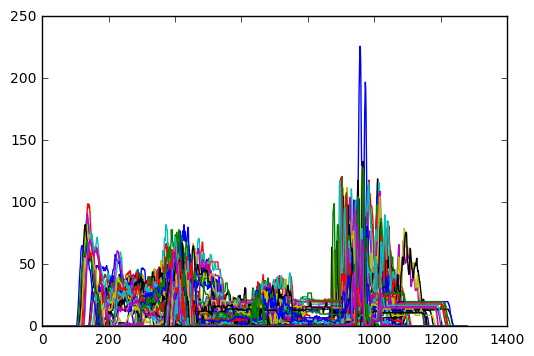

In [26]:
counter = 0
output = 'challenge_video_1.mp4'
#output_new = 'output_lane_detect1.mp4'
clip1 = VideoFileClip("challenge_video.mp4",audio = False)
clip2 = clip1.subclip(1, 10) 
#plt.imshow(clip1)
output_clip1 = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip1.write_videofile( output, audio=False)
#print(counter)

In [27]:
HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))